In [111]:
import os, datetime

from qubitPack.tool_box import get_db, get_band_edges_characters, get_unique_sites_from_wy, get_good_ir_sites
from qubitPack.tool_box import IOTools

import pandas as pd
import numpy as np
# pd.set_option('display.max_rows', 500)

from pymatgen import Spin, Element
from pymatgen.io.vasp.inputs import Structure

from monty.serialization import loadfn

from matplotlib import pyplot as plt
from matplotlib.ticker import AutoMinorLocator

# plt.style.use(['science', 'notebook', 'grid'])


C2DB = get_db("2dMat_from_cmr_fysik", "2dMaterial_v1", user="readUser", password="qiminyan", port=1234)
SCAN2dMat = get_db("Scan2dMat", "calc_data",  user="Jeng_ro", password="qimin", port=1236)
SCAN2dDefect = get_db("Scan2dDefect", "calc_data",  user="Jeng_ro", password="qimin", port=1236)
SCAN2dIR = get_db("Scan2dDefect", "ir_data", port=1236)
C2DB_IR = get_db("C2DB_IR", "calc_data",  user="Jeng_ro", password="qimin", port=1234)

save_xlsx_path = "/Users/jeng-yuantsai/Research/project/Scan2dDefect/latest_results/xlsx"
save_plt_path = "/Users/jeng-yuantsai/Research/project/Scan2dDefect/latest_results/plt"


# Read precompiled defect and host excel

In [235]:
defect_df = IOTools(cwd=save_xlsx_path, excel_file="defect_0_2_2021-10-22").read_excel()
host_df = IOTools(cwd=save_xlsx_path, excel_file="host_2021-10-25").read_excel()

# Tools

In [102]:
from collections import Counter
from qubitPack.qc_searching.analysis.main import get_defect_state

defect_db = SCAN2dDefect
ir_db = SCAN2dIR
host_db = SCAN2dMat

def return_level_info(taskid):
    print(taskid)
    e = defect_db.collection.find_one({"task_id": taskid})

    tk_id = e["task_id"]
    pc_from_id = e["pc_from_id"]
    defect_name = e["defect_name"]
    charge_state = e["charge_state"]

    level_info = None
    try:
        tot, proj, d_df, levels = get_defect_state(
            defect_db,
            {"task_id": tk_id},
            5, -5,
            None,
            False,
            "dist",
            (host_db, pc_from_id, 0, 0, 0),
            0.2,
            is_vacuum_aligment_on_plot=True,
            locpot_c2db=None,#(c2db, c2db_uid, 0)
            ir_db=ir_db,
            ir_entry_filter={"pc_from_id": pc_from_id, "defect_name": defect_name, "charge_state": charge_state},
        )
        level_info = d_df.T.to_dict("records")[0]
    except Exception as er:
        print(er)
        level_info = {}
    return level_info

# Host 

In [234]:
def host_candidate_stats():
    col = SCAN2dMat.collection
    filter = {
        "output.bandgap":{"$gte":1},
#             "c2db_info.gap_hse_nosoc":{"$gte":1.5},
        "task_label": "SCAN_nscf line"
    }
    show = {
        "formula":1,
        "class":1,
        "ehull":1,
        "spacegroup":1,
        "gap_hse_nosoc":1
    }

    hosts = []
    host_candidates = list(col.find(filter))
    for e in host_candidates[:]:
        print(e["task_id"])
        print(e["task_id"], e["c2db_info"]["uid"])
        bs = SCAN2dMat.get_band_structure(e["task_id"])
        data = {}
        # add band edges info
        if bs.get_band_gap()["energy"] != 0:
            data = get_band_edges_characters(bs)
            data.update({"taskid": e["task_id"]})


        st = Structure.from_dict(e["input"]["structure"])
        species, site_syms, wyckoffs, pg, site_idx, spg, spg_number = get_unique_sites_from_wy(st, symprec=1e-1).values()
        good_ir = get_good_ir_sites(st, symprec=1e-1)

        print(e["c2db_info"]["uid"])
        d = {
            "species": tuple(species),
            "reduced_species": tuple(good_ir["species"]),
            "site_sym": tuple(site_syms),
            "reduced_site_sym": tuple(good_ir["site_syms"]),
            "wyckoffs": tuple(wyckoffs),
            "reduced_wy": tuple(good_ir["wys"]),
            "site_idx": tuple(site_idx),
            "reduced_site_idx": tuple(good_ir["site_idx"]),
            "pmg_point_gp": pg,
            "prototype": e["c2db_info"]["prototype"],
            "formula": e["c2db_info"]["formula"],
            "c2db_spacegroup": e["c2db_info"]["spacegroup"],
            "spg": spg,
            "spg_number": spg_number,
            "pg": pg,
            "gap_scan": e["output"]["bandgap"],
            "c2db_gap_hse": e["c2db_info"]["gap_hse"],
            "c2db_gap_hse_nosoc": e["c2db_info"]["gap_hse_nosoc"],
            "c2db_soc_intensity": e["c2db_info"]["gap_hse_nosoc"] - e["c2db_info"]["gap_hse"],
            "c2db_ehull": e["c2db_info"]["ehull"],
            "c2db_uid":e["c2db_info"]["uid"],
        }
        d.update(data)
        hosts.append(d)
    # print(bad_pg)
    host_df = pd.DataFrame(hosts)
    return host_df

host_df = host_candidate_stats()
IOTools(cwd=save_xlsx_path, pandas_df=host_df).to_excel("host")

4
4 BN-BN-NM
{'cbm': {'up': {'max_element_idx': 0, 'max_element': 'B', 'max_proj': 0.5265, 'proj_on_element': array([0.5265, 0.    ])}, 'down': {'max_element_idx': 0, 'max_element': 'B', 'max_proj': 0.5265, 'proj_on_element': array([0.5265, 0.    ])}, 'is_up_dn_band_idx_equal': True}, 'vbm': {'up': {'max_element_idx': 1, 'max_element': 'N', 'max_proj': 0.611, 'proj_on_element': array([0.   , 0.611])}, 'down': {'max_element_idx': 1, 'max_element': 'N', 'max_proj': 0.611, 'proj_on_element': array([0.   , 0.611])}, 'is_up_dn_band_idx_equal': True}}
['B', 'N'] ['-6m2', '-6m2'] ['b', 'd'] -6m2
['B', 'N'] ['-6m2', '-6m2'] ['b', 'd'] -6m2
['B', 'N'] ['-6m2', '-6m2'] ['b', 'd'] -6m2 [0, 1]
BN-BN-NM
29
29 PdS2-CdI2-NM
{'cbm': {'up': {'max_element_idx': 0, 'max_element': 'Pd', 'max_proj': 0.38709999999999994, 'proj_on_element': array([0.3871, 0.1465, 0.1465])}, 'down': {'max_element_idx': 0, 'max_element': 'Pd', 'max_proj': 0.38699999999999996, 'proj_on_element': array([0.387 , 0.1465, 0.1465])}

## Uniform site symmetries

In [237]:
uni = host_df["reduced_site_sym"].isin([("-6m2", "-6m2"), ("3m", "3m"), ("4mm", "4mm")])

In [238]:
uniform_host_df = host_df.loc[uni, :]
display(uniform_host_df)

,species,reduced_species,site_sym,reduced_site_sym,wyckoffs,reduced_wy,site_idx,reduced_site_idx,pmg_point_gp,prototype,...,gap_scan,c2db_gap_hse,c2db_gap_hse_nosoc,c2db_soc_intensity,c2db_ehull,c2db_uid,cbm,vbm,is_vbm_cbm_from_same_element,taskid
0,"(B, N)","(B, N)","(-6m2, -6m2)","(-6m2, -6m2)","(b, d)","(b, d)","(0, 1)","(0, 1)",-6m2,BN,...,4.8382,5.675449,5.675463,0.000014,-0.015999,BN-BN-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,4
13,"(Al, S)","(Al, S)","(3m., 3m.)","(3m, 3m)","(i, h)","(i, h)","(0, 2)","(0, 2)",-6m2,GaS,...,2.0676,2.880595,2.882262,0.001667,0.004823,Al2S2-GaS-NM,"{'up': {'max_element_idx': 2, 'max_element': '...","{'up': {'max_element_idx': 2, 'max_element': '...",True,117
14,"(Al, N)","(Al, N)","(-6m2, -6m2)","(-6m2, -6m2)","(b, d)","(b, d)","(0, 1)","(0, 1)",-6m2,BN,...,2.9891,4.048289,4.048311,0.000022,0.511926,AlN-BN-NM,"{'up': {'max_element_idx': 1, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",True,124
15,"(Ga, N)","(Ga, N)","(-6m2, -6m2)","(-6m2, -6m2)","(b, d)","(b, d)","(0, 1)","(0, 1)",-6m2,BN,...,2.2126,3.089671,3.091059,0.001388,0.416362,GaN-BN-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,125
25,"(Ga, P)","(Ga, P)","(3m., 3m.)","(3m, 3m)","(b, c)","(b, c)","(0, 1)","(0, 1)",3m,GeSe,...,1.7872,2.369200,2.372396,0.003195,0.445465,GaP-GeSe-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,196
41,"(Cu, I)","(Cu, I)","(3m., 3m.)","(3m, 3m)","(d, d)","(d, d)","(0, 2)","(0, 2)",-3m,CH,...,1.9644,3.359049,3.619248,0.260198,-0.008103,Cu2I2-CH-NM,"{'up': {'max_element_idx': 3, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,343
43,"(Ge, S)","(Ge, S)","(3m., 3m.)","(3m, 3m)","(a, c)","(a, c)","(0, 1)","(0, 1)",3m,GeSe,...,2.4595,3.230953,3.257409,0.026456,0.052546,GeS-GeSe-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,352
70,"(Ga, Te)","(Ga, Te)","(3m., 3m.)","(3m, 3m)","(i, h)","(i, h)","(0, 2)","(0, 2)",-6m2,GaS,...,1.5510,1.861535,2.005683,0.144147,0.002150,Ga2Te2-GaS-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 2, 'max_element': '...",False,523
74,"(Ga, As)","(Ga, As)","(3m., 3m.)","(3m, 3m)","(b, c)","(b, c)","(0, 1)","(0, 1)",3m,GeSe,...,1.2461,1.718675,1.724846,0.006171,0.411574,GaAs-GeSe-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {}, 'down': {'max_element_idx': 1, 'max...",False,537
78,"(Pb, O)","(Pb, O)","(3m., 3m.)","(3m, 3m)","(a, c)","(a, c)","(0, 1)","(0, 1)",3m,GeSe,...,1.7928,2.638455,2.795482,0.157028,0.306204,PbO-GeSe-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,577


In [286]:
uniform_host_gp = uniform_host_df.groupby(["spg_number", "reduced_site_sym"]).agg(
    dict(taskid=["count", "unique"], c2db_uid=["count", "unique"]))
display(uniform_host_gp)
IOTools(cwd=save_xlsx_path, pandas_df=uniform_host_gp).to_excel("uni_host_gp", index=True)

taskid  \
                             count   
spg_number reduced_site_sym          
129        (4mm, 4mm)            1   
156        (3m, 3m)             16   
164        (3m, 3m)             25   
187        (-6m2, -6m2)          4   
           (3m, 3m)             11   

                                                                                \
                                                                        unique   
spg_number reduced_site_sym                                                      
129        (4mm, 4mm)                                                   [2610]   
156        (3m, 3m)          [196, 352, 537, 577, 684, 1397, 1418, 1424, 14...   
164        (3m, 3m)          [343, 792, 797, 810, 824, 836, 843, 911, 913, ...   
187        (-6m2, -6m2)                                    [4, 124, 125, 2245]   
           (3m, 3m)          [117, 523, 613, 1254, 1375, 1885, 2212, 2242, ...   

                            c2db_uid  \
                               count   
spg_number reduced_site_sym            
129        (4mm, 4mm)              1   
156        (3m, 3m)               16   
164        (3m, 3m)               25   
187        (-6m2, -6m2)            4   
           (3m, 3m)               11   

                                                                                
                                                                        unique  
spg_number reduced_site_sym                                                     
129        (4mm, 4mm)                                          [Pb2Se2-PbS-NM]  
156        (3m, 3m)          [GaP-GeSe-NM, GeS-GeSe-NM, GaAs-GeSe-NM, PbO-G...  
164        (3m, 3m)          [Cu2I2-CH-NM, Ga2Te2-GaSe-NM, Al2Se2-GaSe-NM, ...  
187        (-6m2, -6m2)           [BN-BN-NM, AlN-BN-NM, GaN-BN-NM, AlAs-BN-NM]  
           (3m, 3m)          [Al2S2-GaS-NM, Ga2Te2-GaS-NM, Al2Se2-GaS-NM, A...

In [268]:
for k in range(uniform_host_gp.loc[:, "taskid"]["unique"].count()):
    print("=="*10, k)
    for i in uniform_host_gp.iloc[k, 3]:
        a = defect_df.loc[defect_df["c2db_uid"].isin(uniform_host_gp.iloc[k, 3]), :]
        if i not in a["c2db_uid"].unique():
            print(i)
            print(int(host_df.loc[host_df["c2db_uid"] == i, "taskid"]))

==================== 0
Pb2Se2-PbS-NM
2610
==================== 1
GeO-GeSe-NM
2102
==================== 2
Cu2I2-CH-NM
343
Au2I2-CH-NM
913
Ag2I2-CH-NM
982
==================== 3
==================== 4


## Non-uniform site symmetries

In [244]:
nonuni = ~host_df["reduced_site_sym"].isin([("-6m2", "-6m2"), ("3m", "3m"), ("4mm", "4mm")])

In [245]:
nonuniform_host_df = host_df.loc[nonuni, :]
display(nonuniform_host_df)

,species,reduced_species,site_sym,reduced_site_sym,wyckoffs,reduced_wy,site_idx,reduced_site_idx,pmg_point_gp,prototype,...,gap_scan,c2db_gap_hse,c2db_gap_hse_nosoc,c2db_soc_intensity,c2db_ehull,c2db_uid,cbm,vbm,is_vbm_cbm_from_same_element,taskid
1,"(Pd, S)","(Pd, S)","(-3m., 3m.)","(-3m, 3m)","(b, d)","(b, d)","(0, 1)","(0, 1)",-3m,CdI2,...,1.4713,1.680873,1.732135,0.051262,0.100831,PdS2-CdI2-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,29
2,"(Mg, Cl)","(Mg, Cl)","(-3m., 3m.)","(-3m, 3m)","(b, d)","(b, d)","(0, 1)","(0, 1)",-3m,CdI2,...,5.9952,7.294069,7.338506,0.044437,-0.005223,MgCl2-CdI2-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,40
3,"(Ti, O)","(Ti, O)","(-3m., 3m.)","(-3m, 3m)","(b, d)","(b, d)","(0, 1)","(0, 1)",-3m,CdI2,...,2.8945,5.218117,5.219086,0.000969,0.135314,TiO2-CdI2-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,43
4,"(Mg, Cl)","(Mg, Cl)","(-6m2, 3m.)","(-6m2, 3m)","(b, i)","(b, i)","(0, 1)","(0, 1)",-6m2,MoS2,...,4.7609,6.062543,6.108373,0.045829,0.184829,MgCl2-MoS2-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {}, 'down': {'max_element_idx': 1, 'max...",False,46
5,"(Zn, Cl)","(Zn, Cl)","(-6m2, 3m.)","(-6m2, 3m)","(b, i)","(b, i)","(0, 1)","(0, 1)",-6m2,MoS2,...,3.4767,4.718491,4.767981,0.049490,0.231134,ZnCl2-MoS2-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {}, 'down': {'max_element_idx': 1, 'max...",False,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,"(In, Cl)","(In, Cl)","(-4m2, 4mm)","(-42m, 4mm)","(b, c)","(b, c)","(0, 2)","(0, 2)",4/mmm,FeSe,...,2.0715,2.996892,3.040682,0.043790,0.132849,In2Cl2-FeSe-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 1, 'max_element': '...",False,2565
301,"(In, Br)","(In,)","(-6.., ..m)","(-6,)","(d, i)","(d,)","(0, 2)","(0,)",-6m2,TiCl3,...,2.2046,2.983688,3.144006,0.160318,0.107728,In2Br6-TiCl3-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 3, 'max_element': '...",False,2580
304,"(In, I)","(In,)","(3.2, ..m)","(3,)","(d, k)","(d,)","(0, 2)","(0,)",-3m,BiI3,...,1.9024,2.395647,2.682527,0.286880,0.004112,In2I6-BiI3-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {}, 'down': {'max_element_idx': 2, 'max...",False,2601
307,"(Pb, S)",(),"(m.., m..)",(),"(a, a)",(),"(0, 2)",(),mm2,PbS,...,1.6788,1.806243,2.256162,0.449919,0.054141,Pb2S2-PbS-NM,"{'up': {'max_element_idx': 0, 'max_element': '...","{'up': {'max_element_idx': 2, 'max_element': '...",False,2632


In [287]:
nonuniform_host_gp = nonuniform_host_df.groupby(["spg_number", "reduced_site_sym"]).agg(
    dict(taskid=["count", "unique"], c2db_uid=["count", "unique"]))
display(nonuniform_host_gp)
IOTools(cwd=save_xlsx_path, pandas_df=nonuniform_host_gp).to_excel("nonuni_host_gp", index=True)

taskid  \
                             count   
spg_number reduced_site_sym          
10         ()                    7   
11         ()                   12   
12         ()                    5   
14         ()                   11   
31         ()                    9   
59         ()                    4   
115        (-42m,)              48   
129        (-42m, 4mm)          22   
147        (3,)                  1   
162        (3,)                 27   
164        (-3m, 3m)            48   
187        (-6m2, 3m)           39   
           (3m, -6m2)            2   
189        (-6,)                14   
191        (-6m2,)               4   

                                                                                \
                                                                        unique   
spg_number reduced_site_sym                                                      
10         ()                        [992, 1040, 1041, 1066, 1076, 1095, 2442]   
11         ()                [1480, 1495, 1506, 1519, 1521, 1534, 1540, 154...   
12         ()                                   [1010, 1859, 1957, 2445, 2521]   
14         ()                [1797, 1814, 1821, 1833, 1852, 1903, 1944, 195...   
31         ()                [825, 2010, 2030, 2110, 2186, 2201, 2488, 2505...   
59         ()                                         [1556, 1580, 1659, 1709]   
115        (-42m,)           [127, 143, 165, 179, 183, 197, 239, 282, 297, ...   
129        (-42m, 4mm)       [293, 356, 394, 458, 593, 642, 681, 682, 1085,...   
147        (3,)                                                          [640]   
162        (3,)              [147, 303, 306, 311, 329, 331, 447, 552, 667, ...   
164        (-3m, 3m)         [29, 40, 43, 66, 106, 115, 157, 176, 312, 385,...   
187        (-6m2, 3m)        [46, 55, 57, 63, 82, 105, 228, 229, 268, 374, ...   
           (3m, -6m2)                                              [524, 1164]   
189        (-6,)             [159, 425, 1061, 1092, 1096, 1138, 1315, 1394,...   
191        (-6m2,)                                     [200, 1108, 1459, 2281]   

                            c2db_uid  \
                               count   
spg_number reduced_site_sym            
10         ()                      7   
11         ()                     12   
12         ()                      5   
14         ()                     11   
31         ()                      9   
59         ()                      4   
115        (-42m,)                48   
129        (-42m, 4mm)            22   
147        (3,)                    1   
162        (3,)                   27   
164        (-3m, 3m)              48   
187        (-6m2, 3m)             39   
           (3m, -6m2)              2   
189        (-6,)                  14   
191        (-6m2,)                 4   

                                                                                
                                                                        unique  
spg_number reduced_site_sym                                                     
10         ()                [Cu2S2-AuSe-NM, Au2S2-AuSe-NM, Ag2Te2-AuSe-NM,...  
11         ()                [Ru2S4-WTe2-NM, Ru2Te4-WTe2-NM, Hf2Br4-WTe2-NM...  
12         ()                [Tl2Cl2-CH-NM, Cd2Se4-WTe2-NM, Zn2Se4-PdS2-NM,...  
14         ()                [Zn2S4-PdS2-NM, Pd2Se4-PdS2-NM, Pt2Te4-PdS2-NM...  
31         ()                [Ge2S2-SnS-NM, Sn2S2-SnS-NM, S2Si2-SnS-NM, Sn2...  
59         ()                [Ti2O6-TiS3-NM, Hf2S6-TiS3-NM, Zr2O6-TiS3-NM, ...  
115        (-42m,)           [SnF2-GeS2-NM, ZrO2-GeS2-NM, GeO2-GeS2-NM, ZrS...  
129        (-42m, 4mm)       [Cu2Cl2-FeSe-NM, Rb2I2-FeSe-NM, Cs2Cl2-FeSe-NM...  
147        (3,)                                               [Br6Sb2-BiI3-NM]  
162        (3,)              [Rh2Cl6-BiI3-NM, Ir2Cl6-BiI3-NM, Bi2Cl6-BiI3-N...  
164        (-3m, 3m)         [PdS2-CdI2-NM, MgCl2-CdI2-NM, TiO2-CdI2-NM, Sn...  
187        

In [266]:
for k in range(nonuniform_host_gp.loc[:, "taskid"]["unique"].count()):
    print("=="*10, k)
    for i in nonuniform_host_gp.iloc[k, 3]:
        a = defect_df.loc[defect_df["c2db_uid"].isin(nonuniform_host_gp.iloc[k, 3]), :]
        if i not in a["c2db_uid"].unique():
            print(i)
            print(int(host_df.loc[host_df["c2db_uid"] == i, "taskid"]))

==================== 0
Cu2S2-AuSe-NM
992
Au2S2-AuSe-NM
1040
Ag2Te2-AuSe-NM
1041
Au2Se2-AuSe-NM
1066
Au2Te2-AuSe-NM
1076
Ag2S2-AuSe-NM
1095
Cu2Se2-AuSe-NM
2442
==================== 1
Ru2S4-WTe2-NM
1480
Ru2Te4-WTe2-NM
1495
Hf2Br4-WTe2-NM
1506
Zr2Cl4-WTe2-NM
1519
Ti2O4-WTe2-NM
1521
Os2Te4-WTe2-NM
1534
Ru2Se4-WTe2-NM
1540
Os2Se4-WTe2-NM
1545
Os2S4-WTe2-NM
1552
Hf2Cl4-WTe2-NM
1595
Ru2Se6-VTe3-NM
1752
Zr2Br4-WTe2-NM
2451
==================== 2
Tl2Cl2-CH-NM
1010
Cd2Se4-WTe2-NM
1859
Zn2Se4-PdS2-NM
1957
Pb2S4-WTe2-NM
2445
Tl2Br2-ISb-NM
2521
==================== 3
Zn2S4-PdS2-NM
1797
Pd2Se4-PdS2-NM
1814
Pt2Te4-PdS2-NM
1821
Pt2S4-PdS2-NM
1833
Ni2S4-PdS2-NM
1852
Ni2Te4-PdS2-NM
1903
Pt2Se4-PdS2-NM
1944
Pd2S4-PdS2-NM
1950
Pd2Te4-PdS2-NM
1959
Ni2Se4-PdS2-NM
2021
Cd2S4-PdS2-NM
2087
==================== 4
Ge2S2-SnS-NM
825
Sn2S2-SnS-NM
2010
S2Si2-SnS-NM
2030
Sn2Se2-SnS-NM
2110
Si2Te2-SnS-NM
2186
Ge2Te2-SnS-NM
2201
Ge2Se2-SnS-NM
2488
Se2Si2-SnS-NM
2505
Pb2S2-PbS-NM
2632
==================== 5
Ti2O6-TiS3-N

# Defect

In [269]:
data = []
col = SCAN2dDefect.collection
for e in col.find({"task_label": "SCAN_nscf uniform"}): #"host_info.c2db_info.prototype": {"$in": ["AgBr3"]}
#     print(e["host_info"]["c2db_info"]["uid"], e["task_id"])
    try:
        is_vbm_cbm_same = host_df.loc[host_df["c2db_uid"] == e["host_info"]["c2db_info"]["uid"],
                                      "is_vbm_cbm_from_same_element"].iloc[0]
        hse_gap_nosoc = host_df.loc[host_df["c2db_uid"] == e["host_info"]["c2db_info"]["uid"], "c2db_gap_hse_nosoc"].iloc[0]
        host_spg_number = host_df.loc[host_df["c2db_uid"] == e["host_info"]["c2db_info"]["uid"], "spg_number"].iloc[0]
        host_spg =  host_df.loc[host_df["c2db_uid"] == e["host_info"]["c2db_info"]["uid"], "spg"].iloc[0]
        host_taskid =  host_df.loc[host_df["c2db_uid"] == e["host_info"]["c2db_info"]["uid"], "taskid"].iloc[0]

    except:
        is_vbm_cbm_same = None
        hse_gap_nosoc = None
        
    is_nelect_even = None
    if e["input"]["incar"]["NELECT"] % 2 == 0:
        is_nelect_even = True
    else:
        is_nelect_even = False
        
    info = {
        "task_id": e["task_id"],
        "is_vbm_cbm_same": is_vbm_cbm_same, 
        "c2db_uid": e["host_info"]["c2db_info"]["uid"],
        "prototype": e["host_info"]["c2db_info"]["prototype"],
        "host_spg": host_spg,
        "host_spg_number": host_spg_number,
        "host_taskid": host_taskid,
        "gap_scan": e["host_info"]["scan_bs"]["bandgap"],
        "hse_gap_nosoc":hse_gap_nosoc,
        "defect_name": e["defect_name"],
        "defect_type": e["defect_entry"]["defect_type"],
        "charge": e["charge_state"],
        "mag": e["calcs_reversed"][0]["output"]["outcar"]["total_magnetization"],
        "reduced_site_sym": tuple(e["host_info"]["sym_data"]["good_ir_info"]["site_sym"]),
        "reduced_site_specie": tuple(e["host_info"]["sym_data"]["good_ir_info"]["species"]),
        "chemsys": e["chemsys"],
        "is_nelect_even": is_nelect_even
    }

    # level_info = return_level_info(e["task_id"])
    # info.update(level_info)


    data.append(info)


defect_df = pd.DataFrame(data)
defect_df.fillna("None", inplace=True)
display(defect_df)
IOTools(cwd=save_xlsx_path, pandas_df=defect_df).to_excel("defect_no_ev")

,task_id,is_vbm_cbm_same,c2db_uid,prototype,host_spg,host_spg_number,host_taskid,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag,reduced_site_sym,reduced_site_specie,chemsys,is_nelect_even
0,7,True,Al2S2-GaS-NM,GaS,P-6m2,187,117,2.0676,2.882262,vac_2_S,vacancy,0,0.0,"(3m, 3m)","(Al, S)",Al-S,True
1,10,False,BN-BN-NM,BN,P-6m2,187,4,4.8382,5.675463,vac_1_B,vacancy,0,3.0,"(-6m2, -6m2)","(B, N)",B-N,False
2,12,False,BN-BN-NM,BN,P-6m2,187,4,4.8382,5.675463,vac_2_N,vacancy,0,1.0,"(-6m2, -6m2)","(B, N)",B-N,False
3,17,False,GaP-GeSe-NM,GeSe,P3m1,156,196,1.7872,2.372396,vac_2_P,vacancy,0,1.0,"(3m, 3m)","(Ga, P)",Ga-P,False
4,21,False,GaP-GeSe-NM,GeSe,P3m1,156,196,1.7872,2.372396,vac_1_Ga,vacancy,0,1.0,"(3m, 3m)","(Ga, P)",Ga-P,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1349,5527,False,HgI2-GeS2-NM,GeS2,P-4m2,115,1134,1.7552,2.716354,as_1_I_on_Hg,antisite,1,2.0,"(-42m,)","(Hg,)",Hg-I,True
1350,5534,False,PbI2-CdI2-NM,CdI2,P-3m1,164,2546,2.2425,3.197034,as_1_Pb_on_I,antisite,1,0.0,"(-3m, 3m)","(Pb, I)",I-Pb,True
1351,5545,False,ZnI2-MoS2-NM,MoS2,P-6m2,187,229,1.1539,2.067731,as_1_I_on_Zn,antisite,1,2.0,"(-6m2, 3m)","(Zn, I)",I-Zn,True
1352,5546,False,PbCl2-MoS2-NM,MoS2,P-6m2,187,1195,3.2687,4.370487,as_1_Cl_on_Pb,antisite,1,4.0,"(-6m2, 3m)","(Pb, Cl)",Cl-Pb,True


## Triplets categorized by hosts

### Mix charge

In [291]:
# all_triplet_df = defect_df.loc[(defect_df["mag"].round(0) == 2), :]
all_triplet_df = defect_df.loc[~defect_df["reduced_site_sym"].isin([("-6m2", "-6m2"), ("3m", "3m"), ("4mm", "4mm")]), :]

display(all_triplet_df.count())
grouping = ["host_spg_number","reduced_site_sym", "host_taskid", "c2db_uid", "defect_type", "defect_name",
            "is_nelect_even", "charge",
            "chemsys", "prototype", "is_vbm_cbm_same", "reduced_site_specie", "gap_scan", "mag"]
level_info = ["up_band_idx", "up_from_vbm", "up_occ", "dn_band_idx",
         "dn_from_vbm", "dn_occ", "up_deg", "dn_deg", "up_tran_en", "dn_tran_en", "triplet_from", "up_ir", "dn_ir"]
level_info = dict(zip(level_info, [["unique"] for i in range(len(level_info))]))
agg_func = {
    "task_id": ["count", "unique"],
}
# agg_func.update(level_info)
all_triplet_gp = all_triplet_df.groupby(grouping).agg(agg_func)
display(all_triplet_gp)
IOTools(cwd=save_xlsx_path, pandas_df=all_triplet_gp).to_excel("defects_no_ev_nonuniform_site_sym", index=True)

task_id                911
is_vbm_cbm_same        911
c2db_uid               911
prototype              911
host_spg               911
host_spg_number        911
host_taskid            911
gap_scan               911
hse_gap_nosoc          911
defect_name            911
defect_type            911
charge                 911
mag                    911
reduced_site_sym       911
reduced_site_specie    911
chemsys                911
is_nelect_even         911
dtype: int64

task_id  \
                                                                                                                                                                                 count   
host_spg_number reduced_site_sym host_taskid c2db_uid       defect_type defect_name   is_nelect_even charge chemsys prototype is_vbm_cbm_same reduced_site_specie gap_scan mag           
115             (-42m,)          179         ZrS2-GeS2-NM   antisite    as_1_S_on_Zr  True            0     S-Zr    GeS2      False           (Zr,)               1.6598   0.0       1   
                                                            vacancy     vac_1_Zr      True            0     S-Zr    GeS2      False           (Zr,)               1.6598   4.0       1   
                                 183         ZnCl2-GeS2-NM  antisite    as_1_Cl_on_Zn False           0     Cl-Zn   GeS2      False           (Zn,)               4.3132   3.0       1   
                                 197         GeS2-GeS2-NM   antisite    as_1_S_on_Ge  True            0     Ge-S    GeS2      False           (Ge,)               1.4559   0.0       1   
                                                            vacancy     vac_1_Ge      True            0     Ge-S    GeS2      False           (Ge,)               1.4559   4.0       1   
...                                                                                                                                                                                ...   
191             (-6m2,)          1459        Y2Br6-AgBr3-NM vacancy     vac_1_Y       True           -1     Br-Y    AgBr3     False           (Y,)                3.1579   2.0       1   
                                                                                                      1     Br-Y    AgBr3     False           (Y,)                3.1579   4.0       1   
                                 2281        Y2Cl6-AgBr3-NM antisite    as_1_Cl_on_Y  True            0     Cl-Y    AgBr3     False           (Y,)                4.1343   2.0       1   
                                                            vacancy     vac_1_Y       False           0     Cl-Y    AgBr3     False           (Y,)                4.1343   3.0       1   
                                                                                      True           -1     Cl-Y    AgBr3     False           (Y,)                4.1343   2.0       1   

                                                                                                                                                                                        
                                                                                                                                                                                unique  
host_spg_number reduced_site_sym host_taskid c2db_uid       defect_type defect_name   is_nelect_even charge chemsys prototype is_vbm_cbm_same reduced_site_specie gap_scan mag          
115             (-42m,)          179         ZrS2-GeS2-NM   antisite    as_1_S_on_Zr  True            0     S-Zr    GeS2      False           (Zr,)               1.6598   0.0  [2926]  
                                                            vacancy     vac_1_Zr      True            0     S-Zr    GeS2      False           (Zr,)               1.6598   4.0  [3273]  
                                 183         ZnCl2-GeS2-NM  antisite    as_1_Cl_on_Zn False           0     Cl-Zn   GeS2      False           (Zn,)               4.3132   3.0  [2260]  
                                 197         GeS2-GeS2-NM   antisite    as_1_S_on_Ge  True            0     Ge-S    GeS2      False           (Ge,)               1.4559   0.0  [3445]  
                                                            vacancy     vac_1_Ge      True            0     Ge-S    GeS2      False           (Ge,)               1.4559   4.0  [3274]  
...                                                                                       

### Neutral

In [27]:
neutral_triplet_df = defect_df.loc[(defect_df["mag"].round(0) == 2) & (defect_df["charge"] == 0), :]
display(neutral_triplet_df.count())
grouping = ["prototype", "reduced_site_sym", 
            "is_vbm_cbm_same", "reduced_site_specie",
            "chemsys", "defect_type", "charge", "defect_name"]
agg_func = {"task_id": ["count", "unique"]}
neutral_triplet_gp = neutral_triplet_df.groupby(grouping).agg(agg_func)
display(neutral_triplet_gp)
IOTools(cwd=save_xlsx_path, pandas_df=neutral_triplet_gp).to_excel("neutral_triplets", index=True)

task_id                178
is_vbm_cbm_same        178
c2db_uid               178
prototype              178
gap_scan               178
hse_gap_nosoc          178
defect_name            178
defect_type            178
charge                 178
mag                    178
reduced_site_sym       178
reduced_site_specie    178
chemsys                178
is_nelect_even         178
dtype: int64

task_id  \
                                                                                                          count   
prototype reduced_site_sym is_vbm_cbm_same reduced_site_specie chemsys defect_type charge defect_name             
AgBr3     (-6,)            False           (Bi,)               Bi-Br   antisite    0      as_1_Br_on_Bi       1   
                                           (In,)               Cl-In   antisite    0      as_1_Cl_on_In       1   
                                           (Tl,)               Cl-Tl   antisite    0      as_1_Cl_on_Tl       1   
          (-6m2,)          False           (Bi,)               Bi-Cl   antisite    0      as_1_Cl_on_Bi       1   
                                           (Sc,)               Cl-Sc   antisite    0      as_1_Cl_on_Sc       1   
                                           (Y,)                Br-Y    antisite    0      as_1_Br_on_Y        1   
                                                               Cl-Y    antisite    0      as_1_Cl_on_Y        1   
BN        (-6m2, -6m2)     False           (Ga, N)             Ga-N    antisite    0      as_1_N_on_Ga        1   
BiI3      (3,)             False           (Al,)               Al-Br   antisite    0      as_1_Br_on_Al       1   
                                                               Al-I    antisite    0      as_1_I_on_Al        1   
                                           (As,)               As-Br   antisite    0      as_1_Br_on_As       1   
                                           (Bi,)               Bi-Br   antisite    0      as_1_Br_on_Bi       1   
                                                               Bi-I    antisite    0      as_1_I_on_Bi        1   
                                           (Ga,)               Br-Ga   antisite    0      as_1_Br_on_Ga       1   
                                                               Cl-Ga   antisite    0      as_1_Cl_on_Ga       1   
                                                               Ga-I    antisite    0      as_1_I_on_Ga        1   
                                           (In,)               Br-In   antisite    0      as_1_Br_on_In       1   
                                                               Cl-In   antisite    0      as_1_Cl_on_In       1   
                                                               I-In    antisite    0      as_1_I_on_In        1   
                                           (Ir,)               I-Ir    antisite    0      as_1_I_on_Ir        1   
                                           (Sb,)               I-Sb    antisite    0      as_1_I_on_Sb        1   
                                           (Sc,)               Br-Sc   antisite    0      as_1_Br_on_Sc       1   
                                                               Cl-Sc   antisite    0      as_1_Cl_on_Sc       1   
                                                               I-Sc    antisite    0      as_1_I_on_Sc        1   
                                           (Tl,)               Br-Tl   antisite    0      as_1_Br_on_Tl       1   
                                                               Cl-Tl   antisite    0      as_1_Cl_on_Tl       1   
                                           (Y,)                Br-Y    antisite    0      as_1_Br_on_Y        1   
                                                               I-Y     antisite    0      as_1_I_on_Y         1   
                           True            (Al,)               Al-Cl   antisite    0      as_1_Cl_on_Al       1   
                                           (Ir,)               Br-Ir   antisite    0      as_1_Br_on_Ir       1   
                                           (Rh,)               Br-Rh   antisite    0      as_1_Br_on_Rh       1   
                                                               Cl-Rh   antisite    0      as_1_Cl_on_Rh       1   
                                                               I-Rh    antisite

### Charged

In [28]:
charged_triplet_df = defect_df.loc[(defect_df["mag"].round(0) == 2) & (defect_df["charge"] != 0), :]
display(charged_triplet_df.count())
grouping = ["prototype", "reduced_site_sym", 
            "is_vbm_cbm_same", "reduced_site_specie",
            "chemsys", "defect_type", "charge", "defect_name"]
agg_func = {"task_id": ["count", "unique"]}
charged_triplet_gp = charged_triplet_df.groupby(grouping).agg(agg_func)
display(charged_triplet_gp)
IOTools(cwd=save_xlsx_path, pandas_df=charged_triplet_gp).to_excel("charged_triplets", index=True)

task_id                167
is_vbm_cbm_same        167
c2db_uid               167
prototype              167
gap_scan               167
hse_gap_nosoc          167
defect_name            167
defect_type            167
charge                 167
mag                    167
reduced_site_sym       167
reduced_site_specie    167
chemsys                167
is_nelect_even         167
dtype: int64

task_id  \
                                                                                                          count   
prototype reduced_site_sym is_vbm_cbm_same reduced_site_specie chemsys defect_type charge defect_name             
AgBr3     (-6,)            False           (Bi,)               Bi-Br   vacancy     -1     vac_1_Bi            1   
          (-6m2,)          False           (Bi,)               Bi-Cl   vacancy     -1     vac_1_Bi            1   
                                           (Sc,)               Cl-Sc   vacancy     -1     vac_1_Sc            1   
                                           (Y,)                Br-Y    vacancy     -1     vac_1_Y             1   
                                                               Cl-Y    vacancy     -1     vac_1_Y             1   
BN        (-6m2, -6m2)     False           (B, N)              B-N     vacancy     -1     vac_1_B             1   
                                           (Ga, N)             Ga-N    vacancy     -1     vac_1_Ga            1   
                                                                                          vac_2_N             1   
                           True            (Al, As)            Al-As   vacancy     -1     vac_1_Al            1   
                                                                                          vac_2_As            1   
                                           (Al, N)             Al-N    vacancy     -1     vac_1_Al            1   
BiI3      (3,)             False           (Al,)               Al-Br   vacancy     -1     vac_1_Al            1   
                                                               Al-I    vacancy     -1     vac_1_Al            1   
                                           (As,)               As-Br   vacancy     -1     vac_1_As            1   
                                           (Bi,)               Bi-Br   vacancy     -1     vac_1_Bi            1   
                                                                                    1     vac_1_Bi            1   
                                                               Bi-Cl   vacancy     -1     vac_1_Bi            1   
                                                                                    1     vac_1_Bi            1   
                                                               Bi-I    vacancy     -1     vac_1_Bi            1   
                                           (Ga,)               Br-Ga   vacancy     -1     vac_1_Ga            1   
                                                               Cl-Ga   vacancy     -1     vac_1_Ga            1   
                                                               Ga-I    vacancy     -1     vac_1_Ga            1   
                                           (In,)               Br-In   vacancy     -1     vac_1_In            1   
                                                               Cl-In   vacancy     -1     vac_1_In            1   
                                                               I-In    vacancy     -1     vac_1_In            1   
                                           (Ir,)               Cl-Ir   vacancy     -1     vac_1_Ir            1   
                                                               I-Ir    vacancy     -1     vac_1_Ir            1   
                                           (Sb,)               Br-Sb   vacancy     -1     vac_1_Sb            1   
                                                                                    1     vac_1_Sb            1   
                                                               I-Sb    vacancy     -1     vac_1_Sb            1   
                                                                                    1     vac_1_Sb            1   
                                           (Sc,)               Br-Sc   vacancy     -1     vac_1_Sc            1   
                                                               Cl-Sc   vacancy 

## Triplets correlated to vbm and cbm components

In [145]:
dd = defect_df.loc[df["mag"].round(0) == 2, :]
dd.sort_values(["hse_gap_nosoc", "c2db_uid", "defect_name"], inplace=True)
display(dd)

                                          
IOTools(cwd=defect_path, pandas_df=dd.loc[dd["is_vbm_cbm_same"].isin([1]), :]).to_excel("defect_same_vbm_cbm")



/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
786,3292,True,WTe2-MoS2-NM,MoS2,1.1615,1.486893,as_1_Te_on_W,antisite,0,2.0
788,3298,True,MoTe2-MoS2-NM,MoS2,1.2107,1.516223,as_1_Mo_on_Te,antisite,0,2.0
785,3282,True,MoTe2-MoS2-NM,MoS2,1.2107,1.516223,as_1_Te_on_Mo,antisite,0,2.0
398,1763,True,Ge2H2-CH-NM,CH,1.3235,1.586213,as_1_H_on_Ge,antisite,-1,2.0
281,1280,True,Ge2H2-CH-NM,CH,1.3235,1.586213,vac_1_Ge,vacancy,0,2.0
...,...,...,...,...,...,...,...,...,...,...
913,3781,False,SrCl2-CdI2-NM,CdI2,5.1806,7.053662,vac_1_Sr,vacancy,0,2.0
851,3537,False,MgCl2-CdI2-NM,CdI2,5.9952,7.338506,vac_1_Mg,vacancy,0,2.0
893,3703,False,CaCl2-CdI2-NM,CdI2,5.7187,7.446433,vac_1_Ca,vacancy,0,2.0
296,1347,None,Tl2I2-CH-NM,CH,3.0241,NaN,as_1_I_on_Tl,antisite,0,2.0


In [146]:
diff_vbm_cbm = dd.loc[dd["is_vbm_cbm_same"].isin([0, None]), :]
display(diff_vbm_cbm.loc[diff_vbm_cbm["defect_name"].str.contains("vac"), :].count())
display(diff_vbm_cbm.loc[diff_vbm_cbm["defect_name"].str.contains("as"), :].count())


# IOTools(cwd=defect_path, pandas_df=diff_vbm_cbm).to_excel("defect_diff_vbm_cbm")

task_id            104
is_vbm_cbm_same    104
c2db_uid           104
prototype          104
gap_scan           104
hse_gap_nosoc      104
defect_name        104
defect_type        104
charge             104
mag                104
dtype: int64

task_id            87
is_vbm_cbm_same    85
c2db_uid           87
prototype          87
gap_scan           87
hse_gap_nosoc      85
defect_name        87
defect_type        87
charge             87
mag                87
dtype: int64

In [147]:
same_vbm_cbm = dd.loc[dd["is_vbm_cbm_same"].isin([1]), :]
display(same_vbm_cbm.loc[same_vbm_cbm["defect_name"].str.contains("vac"), :].count())
display(same_vbm_cbm.loc[same_vbm_cbm["defect_name"].str.contains("as"), :].count())

# IOTools(cwd=defect_path, pandas_df=diff_vbm_cbm).to_excel("defect_same_vbm_cbm")

task_id            33
is_vbm_cbm_same    33
c2db_uid           33
prototype          33
gap_scan           33
hse_gap_nosoc      33
defect_name        33
defect_type        33
charge             33
mag                33
dtype: int64

task_id            61
is_vbm_cbm_same    61
c2db_uid           61
prototype          61
gap_scan           61
hse_gap_nosoc      61
defect_name        61
defect_type        61
charge             61
mag                61
dtype: int64

*The above two results show that antisites tend to have triplet states in uniform band components.

### Uniform host band components

In [148]:
same_vbm_cbm = dd.loc[(dd["is_vbm_cbm_same"].isin([1])), :]
fig = plt.figure(dpi=300, figsize=(20, 20))

for plt_idx, prototype in enumerate(same_vbm_cbm["prototype"].unique().tolist()):
    print(plt_idx, prototype)
    ax = fig.add_subplot(4, 3, plt_idx+1)
    freq = same_vbm_cbm.loc[same_vbm_cbm["prototype"] == prototype, "defect_type"]
    display(same_vbm_cbm.loc[same_vbm_cbm["prototype"] == prototype, :])
    
    ax.hist(freq, bins=5 ,stacked=True)
    ax.set_title(prototype)
    ax.set_ylabel("count")
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))





0 MoS2


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
786,3292,True,WTe2-MoS2-NM,MoS2,1.1615,1.486893,as_1_Te_on_W,antisite,0,2.0
788,3298,True,MoTe2-MoS2-NM,MoS2,1.2107,1.516223,as_1_Mo_on_Te,antisite,0,2.0
785,3282,True,MoTe2-MoS2-NM,MoS2,1.2107,1.516223,as_1_Te_on_Mo,antisite,0,2.0
768,3222,True,MoSe2-MoS2-NM,MoS2,1.5619,1.916092,as_1_Se_on_Mo,antisite,0,2.0
771,3237,True,WSe2-MoS2-NM,MoS2,1.6296,2.040652,as_1_Se_on_W,antisite,0,2.0
773,3239,True,WSe2-MoS2-NM,MoS2,1.6296,2.040652,as_1_W_on_Se,antisite,0,2.0
709,2974,True,MoS2-MoS2-NM,MoS2,1.7282,2.168438,as_1_Mo_on_S,antisite,0,2.0
782,3278,True,WS2-MoS2-NM,MoS2,1.8888,2.333135,as_1_W_on_S,antisite,0,2.0


1 CH


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
398,1763,True,Ge2H2-CH-NM,CH,1.3235,1.586213,as_1_H_on_Ge,antisite,-1,2.0
281,1280,True,Ge2H2-CH-NM,CH,1.3235,1.586213,vac_1_Ge,vacancy,0,2.0
306,1406,True,Ge2H2-CH-NM,CH,1.3235,1.586213,vac_2_H,vacancy,1,2.0
336,1519,True,H2Si2-CH-NM,CH,2.1991,2.877284,as_1_H_on_Si,antisite,-1,2.0
333,1507,True,H2Si2-CH-NM,CH,2.1991,2.877284,as_1_Si_on_H,antisite,-1,2.0
286,1306,True,H2Si2-CH-NM,CH,2.1991,2.877284,vac_1_Si,vacancy,0,2.0
304,1396,True,H2Si2-CH-NM,CH,2.1991,2.877284,vac_2_H,vacancy,1,2.0
390,1712,True,Ag2Br2-CH-NM,CH,1.5178,3.064473,vac_1_Ag,vacancy,1,2.0


2 GaS


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
212,869,True,In2Te2-GaS-NM,GaS,1.5321,1.946865,as_1_In_on_Te,antisite,1,2.0
213,881,True,In2Te2-GaS-NM,GaS,1.5321,1.946865,as_1_Te_on_In,antisite,-1,2.0
139,586,True,In2Te2-GaS-NM,GaS,1.5321,1.946865,vac_1_In,vacancy,1,2.0
251,1025,True,In2Se2-GaS-NM,GaS,1.5829,2.080722,as_1_In_on_Se,antisite,1,2.0
252,1029,True,In2Se2-GaS-NM,GaS,1.5829,2.080722,as_1_Se_on_In,antisite,-1,2.0
174,709,True,In2Se2-GaS-NM,GaS,1.5829,2.080722,vac_1_In,vacancy,1,2.0
208,855,True,In2S2-GaS-NM,GaS,1.8059,2.433877,as_1_In_on_S,antisite,1,2.0
207,852,True,In2S2-GaS-NM,GaS,1.8059,2.433877,as_1_S_on_In,antisite,-1,2.0
158,644,True,In2S2-GaS-NM,GaS,1.8059,2.433877,vac_1_In,vacancy,1,2.0
255,1033,True,Al2Te2-GaS-NM,GaS,1.7911,2.456662,as_1_Al_on_Te,antisite,1,2.0


3 GaSe


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
230,968,True,In2Se2-GaSe-NM,GaSe,1.4650,1.980912,as_1_In_on_Se,antisite,1,2.0
320,1456,True,In2Se2-GaSe-NM,GaSe,1.4650,1.980912,as_1_In_on_Se,antisite,1,2.0
234,973,True,In2Se2-GaSe-NM,GaSe,1.4650,1.980912,as_1_Se_on_In,antisite,-1,2.0
318,1452,True,In2Se2-GaSe-NM,GaSe,1.4650,1.980912,as_1_Se_on_In,antisite,-1,2.0
154,629,True,In2Se2-GaSe-NM,GaSe,1.4650,1.980912,vac_1_In,vacancy,1,2.0
313,1438,True,In2Se2-GaSe-NM,GaSe,1.4650,1.980912,vac_1_In,vacancy,1,2.0
404,1781,True,Pd2F2-GaSe-NM,GaSe,1.1799,2.236802,as_1_F_on_Pd,antisite,-1,2.0
499,2151,True,Pd2F2-GaSe-NM,GaSe,1.1799,2.236802,as_1_F_on_Pd,antisite,-1,2.0
412,1811,True,Pd2F2-GaSe-NM,GaSe,1.1799,2.236802,vac_2_F,vacancy,-1,2.0
263,1060,True,In2S2-GaSe-NM,GaSe,1.6774,2.355388,as_1_In_on_S,antisite,1,2.0


4 BN


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
163,666,True,AlAs-BN-NM,BN,1.5944,2.029926,vac_1_Al,vacancy,-1,2.0
165,670,True,AlAs-BN-NM,BN,1.5944,2.029926,vac_2_As,vacancy,-1,2.0
169,701,True,AlN-BN-NM,BN,2.9891,4.048311,vac_1_Al,vacancy,-1,2.0


5 GeSe


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
501,2153,True,SnO-GeSe-NM,GeSe,1.5976,2.223333,as_1_Sn_on_O,antisite,0,2.0
503,2159,True,SnO-GeSe-NM,GeSe,1.5976,2.223333,vac_1_Sn,vacancy,0,2.0


6 CdI2


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
858,3567,True,OsI2-CdI2-NM,CdI2,1.3734,2.320804,vac_1_Os,vacancy,0,2.0
894,3709,True,RuI2-CdI2-NM,CdI2,1.2275,2.345410,vac_1_Ru,vacancy,0,2.0
900,3738,True,OsBr2-CdI2-NM,CdI2,1.3077,2.499748,vac_1_Os,vacancy,0,2.0
856,3561,True,RuBr2-CdI2-NM,CdI2,1.1969,2.560621,vac_1_Ru,vacancy,0,2.0
897,3722,True,OsCl2-CdI2-NM,CdI2,1.4542,2.770823,vac_1_Os,vacancy,0,2.0
890,3694,True,RuCl2-CdI2-NM,CdI2,1.3306,2.834412,vac_1_Ru,vacancy,0,2.0
704,2962,True,PdO2-CdI2-NM,CdI2,1.6340,2.879867,as_1_O_on_Pd,antisite,0,2.0
763,3199,True,PtO2-CdI2-NM,CdI2,1.7653,3.179552,as_1_O_on_Pt,antisite,0,2.0


7 BiI3


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
810,3388,True,Rh2I6-BiI3-NM,BiI3,1.4098,2.346353,as_1_I_on_Rh,antisite,0,2.0
829,3446,True,Rh2Br6-BiI3-NM,BiI3,1.6384,2.781377,as_1_Br_on_Rh,antisite,0,2.0
803,3374,True,Ir2Br6-BiI3-NM,BiI3,1.9345,3.027719,as_1_Br_on_Ir,antisite,0,2.0
787,3295,True,Rh2Cl6-BiI3-NM,BiI3,1.8836,3.215056,as_1_Cl_on_Rh,antisite,0,2.0
807,3385,True,Al2Cl6-BiI3-NM,BiI3,2.6519,6.983471,as_1_Cl_on_Al,antisite,0,2.0


8 FeSe


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
736,3091,True,Ag2I2-FeSe-NM,FeSe,1.8500,3.202017,as_1_I_on_Ag,antisite,0,2.0
752,3153,True,Ga2Cl2-FeSe-NM,FeSe,2.2388,3.225561,as_1_Cl_on_Ga,antisite,0,2.0
744,3121,True,K2I2-FeSe-NM,FeSe,3.9743,5.039913,as_1_I_on_K,antisite,0,2.0


In [149]:
display(same_vbm_cbm.loc[same_vbm_cbm["prototype"] == "MoS2", :])

,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
786,3292,True,WTe2-MoS2-NM,MoS2,1.1615,1.486893,as_1_Te_on_W,antisite,0,2.0
788,3298,True,MoTe2-MoS2-NM,MoS2,1.2107,1.516223,as_1_Mo_on_Te,antisite,0,2.0
785,3282,True,MoTe2-MoS2-NM,MoS2,1.2107,1.516223,as_1_Te_on_Mo,antisite,0,2.0
768,3222,True,MoSe2-MoS2-NM,MoS2,1.5619,1.916092,as_1_Se_on_Mo,antisite,0,2.0
771,3237,True,WSe2-MoS2-NM,MoS2,1.6296,2.040652,as_1_Se_on_W,antisite,0,2.0
773,3239,True,WSe2-MoS2-NM,MoS2,1.6296,2.040652,as_1_W_on_Se,antisite,0,2.0
709,2974,True,MoS2-MoS2-NM,MoS2,1.7282,2.168438,as_1_Mo_on_S,antisite,0,2.0
782,3278,True,WS2-MoS2-NM,MoS2,1.8888,2.333135,as_1_W_on_S,antisite,0,2.0


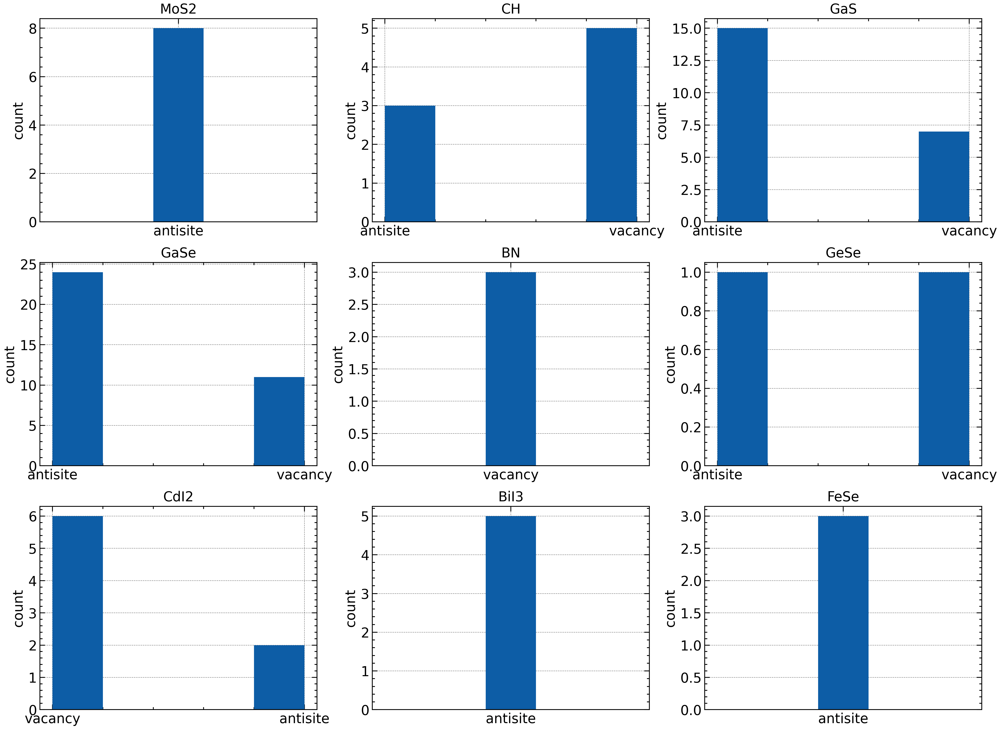

In [138]:
display(fig)

### heter host band components

In [150]:
diff_vbm_cbm = dd.loc[dd["is_vbm_cbm_same"].isin([0, None]), :]
fig = plt.figure(dpi=300, figsize=(20, 20))

for plt_idx, prototype in enumerate(diff_vbm_cbm["prototype"].unique().tolist()):
    print(plt_idx, prototype)
    ax = fig.add_subplot(4, 3, plt_idx+1)
    freq = diff_vbm_cbm.loc[diff_vbm_cbm["prototype"] == prototype, "defect_type"]
    display(diff_vbm_cbm.loc[diff_vbm_cbm["prototype"] == prototype, :])
    
    ax.hist(freq, bins=5, stacked=True)
    ax.set_title(prototype)
    ax.set_ylabel("count")
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))




0 GeSe


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
153,624,False,GaAs-GeSe-NM,GeSe,1.2461,1.724846,vac_1_Ga,vacancy,-1,2.0
156,639,False,GaAs-GeSe-NM,GeSe,1.2461,1.724846,vac_2_As,vacancy,-1,2.0
168,693,False,InP-GeSe-NM,GeSe,1.1360,1.784716,vac_1_In,vacancy,-1,2.0
175,710,False,InP-GeSe-NM,GeSe,1.1360,1.784716,vac_2_P,vacancy,-1,2.0
173,706,False,AlSb-GeSe-NM,GeSe,1.5499,2.004251,vac_1_Al,vacancy,-1,2.0
171,703,False,AlSb-GeSe-NM,GeSe,1.5499,2.004251,vac_2_Sb,vacancy,-1,2.0
27,127,False,PbTe-GeSe-NM,GeSe,1.5979,2.222880,vac_2_Pb,vacancy,0,2.0
55,246,False,GeTe-GeSe-NM,GeSe,1.8052,2.325294,as_1_Te_on_Ge,antisite,0,2.0
83,349,False,GeTe-GeSe-NM,GeSe,1.8052,2.325294,vac_1_Ge,vacancy,0,2.0
192,771,False,GaP-GeSe-NM,GeSe,1.7872,2.372396,vac_1_Ga,vacancy,-1,2.0


1 CH


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
294,1337,False,Pb2Te2-CH-NM,CH,1.5508,1.801611,as_1_Pb_on_Te,antisite,0,2.0
287,1308,False,Pb2Te2-CH-NM,CH,1.5508,1.801611,vac_1_Te,vacancy,0,2.0
291,1320,False,Cd2S2-CH-NM,CH,1.6113,2.704395,vac_1_Cd,vacancy,0,2.0
297,1348,False,Zn2Se2-CH-NM,CH,1.7897,2.763799,as_1_Zn_on_Se,antisite,0,2.0
303,1366,False,Zn2S2-CH-NM,CH,2.6130,3.787432,as_1_Zn_on_S,antisite,0,2.0
300,1354,False,Zn2S2-CH-NM,CH,2.6130,3.787432,vac_1_Zn,vacancy,0,2.0
486,2113,False,C2F2-CH-NM,CH,3.1199,4.922175,vac_1_C,vacancy,0,2.0
479,2092,False,C2F2-CH-NM,CH,3.1199,4.922175,vac_2_F,vacancy,1,2.0
296,1347,None,Tl2I2-CH-NM,CH,3.0241,NaN,as_1_I_on_Tl,antisite,0,2.0
292,1329,None,Tl2I2-CH-NM,CH,3.0241,NaN,as_1_Tl_on_I,antisite,0,2.0


2 GaS


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
490,2125,False,Al2O2-GaS-NM,GaS,1.2084,1.850685,as_1_Al_on_O,antisite,-1,2.0
277,1095,False,Ga2Te2-GaS-NM,GaS,1.5510,2.005683,as_1_Ga_on_Te,antisite,1,2.0
258,1037,False,Ga2Te2-GaS-NM,GaS,1.5510,2.005683,as_1_Te_on_Ga,antisite,-1,2.0
183,741,False,Ga2Te2-GaS-NM,GaS,1.5510,2.005683,vac_1_Ga,vacancy,1,2.0
219,913,False,Ga2Se2-GaS-NM,GaS,2.0183,2.527861,as_1_Ga_on_Se,antisite,1,2.0
218,902,False,Ga2Se2-GaS-NM,GaS,2.0183,2.527861,as_1_Se_on_Ga,antisite,-1,2.0
141,591,False,Ga2Se2-GaS-NM,GaS,2.0183,2.527861,vac_1_Ga,vacancy,1,2.0
235,978,False,Ga2S2-GaS-NM,GaS,2.4565,3.199461,as_1_Ga_on_S,antisite,1,2.0
223,940,False,Ga2S2-GaS-NM,GaS,2.4565,3.199461,as_1_S_on_Ga,antisite,-1,2.0
161,654,False,Ga2S2-GaS-NM,GaS,2.4565,3.199461,vac_1_Ga,vacancy,1,2.0


3 TiCl3


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
817,3418,False,Al2I6-TiCl3-NM,TiCl3,1.2663,1.939598,as_1_I_on_Al,antisite,0,2.0
816,3415,False,Tl2Br6-TiCl3-NM,TiCl3,1.3172,2.041306,as_1_Br_on_Tl,antisite,0,2.0
819,3423,False,Ga2Br6-TiCl3-NM,TiCl3,1.6747,2.479430,as_1_Br_on_Ga,antisite,0,2.0
824,3431,False,In2Br6-TiCl3-NM,TiCl3,2.2046,3.144006,as_1_Br_on_In,antisite,0,2.0
808,3386,False,Bi2I6-TiCl3-NM,TiCl3,2.4479,3.221688,as_1_I_on_Bi,antisite,0,2.0
698,2934,False,Al2Br6-TiCl3-NM,TiCl3,2.9134,3.721265,as_1_Br_on_Al,antisite,0,2.0
986,4069,False,Al2Br6-TiCl3-NM,TiCl3,2.9134,3.721265,vac_1_Al,vacancy,-1,2.0
821,3426,False,Ga2Cl6-TiCl3-NM,TiCl3,2.7545,3.820890,as_1_Cl_on_Ga,antisite,0,2.0
818,3420,False,Y2I6-TiCl3-NM,TiCl3,2.2757,3.835716,as_1_I_on_Y,antisite,0,2.0
812,3392,False,Al2Cl6-TiCl3-NM,TiCl3,4.1046,5.276350,as_1_Cl_on_Al,antisite,0,2.0


4 GaSe


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
246,1006,False,Ga2Te2-GaSe-NM,GaSe,1.4893,1.956031,as_1_Ga_on_Te,antisite,1,2.0
386,1692,False,Ga2Te2-GaSe-NM,GaSe,1.4893,1.956031,as_1_Ga_on_Te,antisite,1,2.0
247,1007,False,Ga2Te2-GaSe-NM,GaSe,1.4893,1.956031,as_1_Te_on_Ga,antisite,-1,2.0
388,1700,False,Ga2Te2-GaSe-NM,GaSe,1.4893,1.956031,as_1_Te_on_Ga,antisite,-1,2.0
197,784,False,Ga2Te2-GaSe-NM,GaSe,1.4893,1.956031,vac_1_Ga,vacancy,1,2.0
324,1472,False,Ga2Te2-GaSe-NM,GaSe,1.4893,1.956031,vac_1_Ga,vacancy,1,2.0
242,996,False,Ga2Se2-GaSe-NM,GaSe,1.8335,2.386467,as_1_Ga_on_Se,antisite,1,2.0
374,1660,False,Ga2Se2-GaSe-NM,GaSe,1.8335,2.386467,as_1_Ga_on_Se,antisite,1,2.0
243,999,False,Ga2Se2-GaSe-NM,GaSe,1.8335,2.386467,as_1_Se_on_Ga,antisite,-1,2.0
381,1676,False,Ga2Se2-GaSe-NM,GaSe,1.8335,2.386467,as_1_Se_on_Ga,antisite,-1,2.0


5 MoS2


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
878,3648,False,ZnI2-MoS2-NM,MoS2,1.1539,2.067731,vac_1_Zn,vacancy,0,2.0
784,3280,False,PbSe2-MoS2-NM,MoS2,1.6878,2.658036,as_1_Se_on_Pb,antisite,0,2.0
804,3377,False,PbSe2-MoS2-NM,MoS2,1.6878,2.658036,vac_1_Pb,vacancy,0,2.0
875,3645,False,HgBr2-MoS2-NM,MoS2,1.6542,2.671914,vac_1_Hg,vacancy,0,2.0
867,3594,False,CdI2-MoS2-NM,MoS2,1.6964,2.706832,vac_1_Cd,vacancy,0,2.0
877,3647,False,SnI2-MoS2-NM,MoS2,1.9701,2.739276,vac_1_Sn,vacancy,0,2.0
776,3255,False,PbS2-MoS2-NM,MoS2,2.0488,3.103852,as_1_S_on_Pb,antisite,0,2.0
831,3449,False,PbS2-MoS2-NM,MoS2,2.0488,3.103852,vac_1_Pb,vacancy,0,2.0
838,3486,False,HgCl2-MoS2-NM,MoS2,2.0190,3.255830,vac_1_Hg,vacancy,0,2.0
832,3468,False,PbI2-MoS2-NM,MoS2,2.3774,3.291795,vac_1_Pb,vacancy,0,2.0


6 BiI3


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
800,3359,False,Ga2I6-BiI3-NM,BiI3,1.4913,2.149071,as_1_I_on_Ga,antisite,0,2.0
699,2936,False,Ir2I6-BiI3-NM,BiI3,1.5943,2.600032,as_1_I_on_Ir,antisite,0,2.0
825,3433,False,In2I6-BiI3-NM,BiI3,1.9024,2.682527,as_1_I_on_In,antisite,0,2.0
793,3328,False,Tl2Br6-BiI3-NM,BiI3,1.8941,2.699830,as_1_Br_on_Tl,antisite,0,2.0
789,3308,False,I6Sb2-BiI3-NM,BiI3,2.2199,2.850669,as_1_I_on_Sb,antisite,0,2.0
697,2933,False,Bi2I6-BiI3-NM,BiI3,2.5352,3.275310,as_1_I_on_Bi,antisite,0,2.0
798,3353,False,Al2I6-BiI3-NM,BiI3,2.5723,3.296733,as_1_I_on_Al,antisite,0,2.0
797,3350,False,As2Br6-BiI3-NM,BiI3,1.9321,3.375340,as_1_Br_on_As,antisite,0,2.0
792,3314,False,Tl2Cl6-BiI3-NM,BiI3,2.5819,3.564838,as_1_Cl_on_Tl,antisite,0,2.0
707,2971,False,Ga2Br6-BiI3-NM,BiI3,2.8849,3.740071,as_1_Br_on_Ga,antisite,0,2.0


7 CdI2


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
703,2961,False,SnS2-CdI2-NM,CdI2,1.6908,2.361786,as_1_Sn_on_S,antisite,0,2.0
859,3569,False,SnI2-CdI2-NM,CdI2,1.7921,2.676717,vac_1_Sn,vacancy,0,2.0
904,3749,False,GeI2-CdI2-NM,CdI2,1.9965,2.819113,vac_1_Ge,vacancy,0,2.0
854,3552,False,ZnI2-CdI2-NM,CdI2,1.9267,2.886343,vac_1_Zn,vacancy,0,2.0
895,3713,False,SnBr2-CdI2-NM,CdI2,2.0238,2.930619,vac_1_Sn,vacancy,0,2.0
882,3658,False,HgBr2-CdI2-NM,CdI2,2.0057,3.060726,vac_1_Hg,vacancy,0,2.0
920,3799,False,Br2Ge-CdI2-NM,CdI2,2.2220,3.186569,vac_1_Ge,vacancy,0,2.0
884,3674,False,PbI2-CdI2-NM,CdI2,2.2425,3.197034,vac_1_Pb,vacancy,0,2.0
855,3560,False,SnCl2-CdI2-NM,CdI2,2.1332,3.229226,vac_1_Sn,vacancy,0,2.0
909,3768,False,CdI2-CdI2-NM,CdI2,2.3342,3.346202,vac_1_Cd,vacancy,0,2.0


8 FeSe


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
753,3156,False,In2I2-FeSe-NM,FeSe,1.6782,2.419714,as_1_I_on_In,antisite,0,2.0
749,3143,False,In2I2-FeSe-NM,FeSe,1.6782,2.419714,as_1_In_on_I,antisite,0,2.0
706,2967,False,Ga2I2-FeSe-NM,FeSe,1.6637,2.450590,as_1_Ga_on_I,antisite,0,2.0
711,2983,False,Ga2I2-FeSe-NM,FeSe,1.6637,2.450590,as_1_I_on_Ga,antisite,0,2.0
756,3171,False,In2Cl2-FeSe-NM,FeSe,2.0715,3.040682,as_1_Cl_on_In,antisite,0,2.0
739,3106,False,Tl2I2-FeSe-NM,FeSe,2.1666,3.060428,as_1_I_on_Tl,antisite,0,2.0
737,3101,False,Tl2I2-FeSe-NM,FeSe,2.1666,3.060428,as_1_Tl_on_I,antisite,0,2.0
717,2996,False,Ag2Cl2-FeSe-NM,FeSe,1.5024,3.523594,as_1_Cl_on_Ag,antisite,0,2.0
740,3107,False,Tl2Br2-FeSe-NM,FeSe,2.6398,3.531813,as_1_Br_on_Tl,antisite,0,2.0
742,3111,False,Tl2Br2-FeSe-NM,FeSe,2.6398,3.531813,as_1_Tl_on_Br,antisite,0,2.0


9 GeS2


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
731,3076,False,HgI2-GeS2-NM,GeS2,1.7552,2.716354,vac_1_Hg,vacancy,0,2.0
775,3251,False,HgBr2-GeS2-NM,GeS2,2.0307,3.199317,vac_1_Hg,vacancy,0,2.0
777,3265,False,CdI2-GeS2-NM,GeS2,2.4911,3.585504,vac_1_Cd,vacancy,0,2.0
770,3226,False,ZnI2-GeS2-NM,GeS2,2.7478,3.668625,vac_1_Zn,vacancy,0,2.0
732,3077,False,HgCl2-GeS2-NM,GeS2,2.3924,3.756964,vac_1_Hg,vacancy,0,2.0
730,3074,False,CdBr2-GeS2-NM,GeS2,3.0040,4.232495,vac_1_Cd,vacancy,0,2.0
735,3087,False,ZnBr2-GeS2-NM,GeS2,3.4878,4.606213,vac_1_Zn,vacancy,0,2.0
727,3063,False,CdCl2-GeS2-NM,GeS2,3.5565,5.012256,vac_1_Cd,vacancy,0,2.0
769,3223,False,SrI2-GeS2-NM,GeS2,3.5871,5.099842,vac_1_Sr,vacancy,0,2.0
729,3071,False,BaI2-GeS2-NM,GeS2,3.9973,5.142240,vac_1_Ba,vacancy,0,2.0


10 AgBr3


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
820,3425,False,Tl2Cl6-AgBr3-NM,AgBr3,1.7882,2.781903,as_1_Cl_on_Tl,antisite,0,2.0
694,2919,False,Bi2Br6-AgBr3-NM,AgBr3,2.7004,3.537633,as_1_Br_on_Bi,antisite,0,2.0
839,3491,False,Bi2Cl6-AgBr3-NM,AgBr3,3.1167,4.123039,as_1_Cl_on_Bi,antisite,0,2.0
822,3428,False,In2Cl6-AgBr3-NM,AgBr3,3.0008,4.208040,as_1_Cl_on_In,antisite,0,2.0
813,3403,False,Y2Br6-AgBr3-NM,AgBr3,3.1579,4.930940,as_1_Br_on_Y,antisite,0,2.0
842,3503,False,Sc2Cl6-AgBr3-NM,AgBr3,3.2505,5.306213,as_1_Cl_on_Sc,antisite,0,2.0
710,2975,False,Y2Cl6-AgBr3-NM,AgBr3,4.1343,6.015598,as_1_Cl_on_Y,antisite,0,2.0


11 BN


,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
131,523,False,GaN-BN-NM,BN,2.2126,3.091059,as_1_N_on_Ga,antisite,0,2.0
155,631,False,GaN-BN-NM,BN,2.2126,3.091059,vac_1_Ga,vacancy,-1,2.0
137,580,False,GaN-BN-NM,BN,2.2126,3.091059,vac_2_N,vacancy,-1,2.0
188,759,False,BN-BN-NM,BN,4.8382,5.675463,vac_1_B,vacancy,-1,2.0


In [154]:
display(diff_vbm_cbm.loc[diff_vbm_cbm["prototype"] == "BN", :])

,task_id,is_vbm_cbm_same,c2db_uid,prototype,gap_scan,hse_gap_nosoc,defect_name,defect_type,charge,mag
131,523,False,GaN-BN-NM,BN,2.2126,3.091059,as_1_N_on_Ga,antisite,0,2.0
155,631,False,GaN-BN-NM,BN,2.2126,3.091059,vac_1_Ga,vacancy,-1,2.0
137,580,False,GaN-BN-NM,BN,2.2126,3.091059,vac_2_N,vacancy,-1,2.0
188,759,False,BN-BN-NM,BN,4.8382,5.675463,vac_1_B,vacancy,-1,2.0


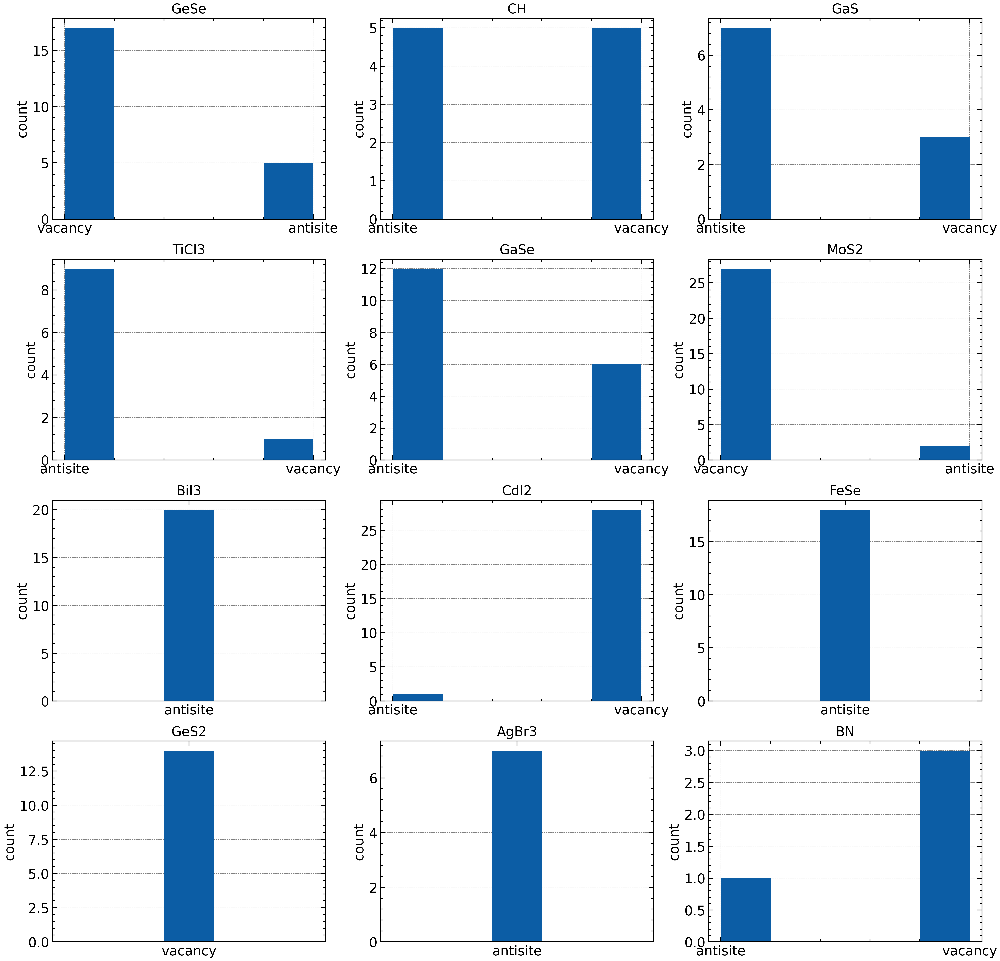

In [153]:
display(fig)

# Show qualified defect triplets (not ready)

In [29]:
from atomate.vasp.database import VaspCalcDb
from pymatgen import Element
import pandas as pd
import os
from collections import Counter
import numpy as np
from qubitPack.qc_searching.analysis.main import get_defect_state
from qubitPack.tool_box import get_db

# db = VaspCalcDb.from_db_file('/Users/jeng-yuantsai/Research/project/symBaseBinaryQubit/calculations/'
#                              'search_triplet_from_defect_db/db.json')
defect_db = get_db("Scan2dDefect", "calc_data", port=1236)
ir_db = get_db("Scan2dDefect", "ir_data", port=1236)
# defect_db = get_db("antisiteQubit", "perturbed", port=1234)
host_db = get_db("Scan2dMat", "calc_data", port=1236)
#
# proj_path = '/Users/jeng-yuantsai/Research/project/symBaseBinaryQubit/calculations/search_triplet_from_defect_db'
# db_json = os.path.join(proj_path, "db.json")

# host_path = "/Users/jeng-yuantsai/Research/project/symBaseBinaryQubit/calculations/scan_relax_pc"
# db_host_json = os.path.join(host_path, "db.json")

# es = defect_db.collection.aggregate(
#     [
#         {"$match": {"task_label": "SCAN_nscf uniform"}},
#         {"$addFields":{"mag": {"$abs": {"$arrayElemAt": ["$calcs_reversed.output.outcar.total_magnetization",0]}}}},
#         {"$addFields":{"defect_name":"$defect_entry.name", "point_group":"$output.spacegroup.point_group"}},
#         {"$project": {"_id":0, "formula_pretty":1, "nsites":1, "elements":1,
#                       "mag":1, "charge_state":1, "chemsys":1, "defect_name":1,
#                       "point_group":1, "task_id":1, "pc_from_id": 1,
#         }},
#         {"$match":{"mag":{"$gte":1.9, "$lte":2.1}}},
#         {"$sort":{"mag":-1}},
#         # {"$group": {"_id":"$chemsys", "q": {"$push":"$charge_state"},"m": {"$push":"$formula_pretty"}, "nsites":{"$push":"$nsites"}}}
#     ]
# )

def screen_triplets(taskids):
    print(taskids)
    es = defect_db.collection.find({"task_id": {"$in": taskids}})

    ess = []
    for e in list(es)[:]:
        els = [Element(e["elements"][0]).group, Element(e["elements"][1]).group]
        els.sort()

        tk_id = e["task_id"]
        pc_from_id = e["pc_from_id"]
        defect_name = e["defect_name"]
        charge_state = e["charge_state"]
        e.update({"prototype": e["host_info"]["c2db_info"]["prototype"]})
        e.update({"site_sym": e["host_info"]["sym_data"]["good_ir_info"]["site_sym"]})
        e.update({"site_specie": e["host_info"]["sym_data"]["good_ir_info"]["species"]})
        e.update({"pmg_pg": e["output"]["spacegroup"]["point_group"]})
        try:
            tot, proj, d_df, levels = get_defect_state(
                defect_db,
                {"task_id": tk_id},
                5, -5,
                None,
                False,
                "dist",
                (host_db, pc_from_id, 0, 0, 0),
                0.01,
                is_vacuum_aligment_on_plot=True,
                locpot_c2db=None,#(c2db, c2db_uid, 0)
                ir_db=ir_db,
                ir_entry_filter={"pc_from_id": pc_from_id, "defect_name": defect_name, "charge_state": charge_state},
            )

            print(d_df)
            if d_df.loc["triplet_from"][0] == "up" and d_df.loc["up_from_vbm"][0][-1] >= 0.2 \
                    and d_df.loc["up_tran_en"][0] >= 0.2:
                e.update(d_df.to_dict()[0])
                e.update({"group": "{}_{}".format(els[0], els[1])})
            elif d_df.loc["triplet_from"][0] == "dn" and d_df.loc["dn_from_vbm"][0][-1] >= 0.2\
                    and d_df.loc["dn_tran_en"][0] >= 0.2:
                e.update(d_df.to_dict()[0])
                e.update({"group": "{}_{}".format(els[0], els[1])})
            else:
                continue
            ess.append(e)

        except Exception as er:
            print(er)
            # print(er)
            # e.update(
            #     {
            #         "up_from_vbm": None,
            #         "up_occ": None,
            #         "dn_from_vbm": None,
            #         "dn_occ": None
            #     }
            # )
            continue
        # e.pop("elements")

    return pd.DataFrame(ess)



In [35]:
taskids = [int(i[0]) for i in neutral_triplet_gp.iloc[:,1].tolist()]
neutral_screened_triplets_df = screen_triplets(taskids)

display(neutral_screened_triplets_df.loc[:, ["task_id", "chemsys",
                                "formula_pretty", "defect_name", "pmg_pg",
                                "prototype", "site_sym", "site_specie", "charge_state"
                                ]])


[2919, 3428, 3425, 3491, 3503, 3403, 2975, 523, 2930, 3353, 3350, 3310, 2933, 2971, 2949, 3359, 3429, 3389, 3433, 2936, 3308, 3407, 3001, 3369, 3328, 3314, 3354, 3331, 3385, 3374, 3446, 3295, 3388, 2113, 1320, 1337, 1308, 1347, 1329, 1366, 1354, 1348, 1280, 1306, 3789, 3702, 3758, 3745, 3703, 3741, 3532, 3768, 3799, 3693, 3749, 3658, 3716, 3730, 3537, 3760, 3677, 3775, 3674, 3713, 3560, 3569, 2961, 3723, 3781, 3774, 3795, 3700, 3552, 3738, 3722, 3567, 2962, 3199, 3561, 3694, 3709, 2996, 3120, 3026, 3036, 2967, 2983, 3171, 3156, 3143, 2988, 3122, 3031, 2989, 3032, 3107, 3111, 3106, 3101, 3091, 3153, 3121, 3062, 3219, 3071, 3266, 3074, 3063, 3265, 3251, 3077, 3076, 3078, 3223, 3087, 3226, 325, 285, 330, 246, 349, 512, 147, 280, 338, 334, 131, 505, 104, 127, 2153, 2159, 3473, 3620, 3387, 3470, 3469, 3618, 3646, 3594, 3472, 3645, 3486, 3655, 3691, 3619, 3590, 3468, 3255, 3449, 3280, 3377, 3575, 3572, 3647, 3494, 3478, 3527, 3651, 3675, 3648, 2974, 3222, 3278, 3237, 3239, 3298, 3282, 3292, 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                0
up_band_idx             [159, 158, 157, 155, 154]
up_from_vbm   [1.817, 1.801, 1.801, 1.773, 1.773]
up_occ                  [0.0, 0.0, 0.0, 0.0, 0.0]
dn_band_idx             [158, 157, 155, 153, 152]
dn_from_vbm      [1.829, 1.829, 1.79, 0.37, 0.37]
dn_occ                  [0.0, 0.0, 0.0, 0.0, 0.0]
up_deg                                  [1, 2, 2]
dn_deg                                  [2, 1, 2]
triplet_from                                   dn
up_tran_en                                      0
dn_tran_en                                      0
---task_id: 127---
total_mag:2.000
cbm:-2.153, vbm:-3.751, efermi:-3.164
{'1': {-3.396: True}, '-1': {-2.845: False, -2.846: False, -3.579: True, -3.741: True}}
                 3       4       0 spin orbital  adjacent antisite
band_index                                                        
153         0.0000  0.0000  0.0000    1       s    0.0000        1
153         0.0090  0.0091  0.0000    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.




{'1': {-5.915: True}, '-1': {-5.364: False, -5.365: False, -6.098: True, -6.26: True}, 'vbm': -6.27, 'cbm': -4.672}
                                               0
up_band_idx                           [153, 152]
up_from_vbm                       [0.355, 0.355]
up_occ                                [1.0, 1.0]
dn_band_idx            [153, 152, 151, 150, 149]
dn_from_vbm   [0.906, 0.905, 0.172, 0.172, 0.01]
dn_occ                 [0.0, 0.0, 1.0, 1.0, 1.0]
up_deg                                       [2]
dn_deg                              [1, 1, 2, 1]
triplet_from                                  dn
up_tran_en                                     0
dn_tran_en                                 0.733
---task_id: 131---
total_mag:2.000
cbm:-2.076, vbm:-4.338, efermi:-4.094
{'1': {}, '-1': {-3.902: False, -4.282: True}}
                27      15      30 spin orbital  adjacent antisite
band_index                                                        
153         0.0000  0.0000  0.0000   -1  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 147---
total_mag:2.000
cbm:-2.364, vbm:-4.530, efermi:-4.189
{'1': {-4.489: True, -4.513: True}, '-1': {-3.941: False, -3.942: False, -4.418: True, -4.462: True, -4.464: True, -4.482: True}}
                27      30      15 spin orbital  adjacent antisite
band_index                                                        
152         0.0000  0.0000  0.0000    1       s    0.0000        1
152         0.0000  0.0000  0.0000    1      pz    0.0000        1
152         0.0000  0.0000  0.0071    1      py    0.0071        1
152         0.0000  0.0075  0.0018    1      px    0.0093        1
152         0.0000  0.0000  0.0000    1     dz2    0.0000        1
152         0.0000  0.0000  0.0000    1     dyz    0.0000        1
152         0.0000  0.0000  0.0000    1     dxz    0.0000        1
152         0.0000  0.0000  0.0000    1     dxy    0.0000        1
152         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
151         0.0000  0.0000  0.0000    1       s    0.0000   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 246---
total_mag:2.000
cbm:-1.918, vbm:-3.723, efermi:-2.887
{'1': {-2.709: False, -3.069: True}, '-1': {-2.377: False, -2.405: False, -3.667: True}}
                27      15      30      31 spin orbital  adjacent  antisite
band_index                                                                 
157         0.0014  0.0014  0.0014  0.0246    1       s    0.0042    0.0246
157         0.0154  0.0154  0.0154  0.1840    1      pz    0.0462    0.1840
157         0.0089  0.0089  0.0358  0.0000    1      py    0.0536    0.0000
157         0.0268  0.0268  0.0000  0.0000    1      px    0.0536    0.0000
157         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
157         0.0000  0.0000  0.0010  0.0000    1     dyz    0.0010    0.0000
157         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
157         0.0010  0.0010  0.0000  0.0000    1     dxy    0.0020    0.0000
157         0.0000  0.0000  0.0014  0.0000    1  dx2-y2    0.0014    0.0000
15

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 280---
total_mag:2.000
cbm:-2.504, vbm:-4.519, efermi:-2.867
{'1': {-3.089: True, -3.832: True, -4.205: True, -4.338: True}, '-1': {-2.645: False, -3.522: True, -4.169: True, -4.31: True}}
                 4       5       0      16 spin orbital  adjacent  antisite
band_index                                                                 
164         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
164         0.0000  0.0238  0.0238  0.0000    1      pz    0.0476    0.0000
164         0.0000  0.0406  0.0094  0.1022    1      py    0.0500    0.1022
164         0.0000  0.0000  0.0312  0.0341    1      px    0.0312    0.0341
164         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
164         0.0000  0.0000  0.0000  0.0019    1     dyz    0.0000    0.0019
164         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
164         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
164         0.0010  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 285---
total_mag:2.000
cbm:-2.279, vbm:-4.558, efermi:-3.660
{'1': {-3.501: False, -3.825: True}, '-1': {-2.962: False, -3.114: False}}
                44      48      24      49 spin orbital  adjacent  antisite
band_index                                                                 
247         0.0018  0.0018  0.0018  0.0209    1       s    0.0054    0.0209
247         0.0208  0.0208  0.0208  0.2106    1      pz    0.0624    0.2106
247         0.0104  0.0417  0.0104  0.0000    1      py    0.0625    0.0000
247         0.0313  0.0000  0.0313  0.0000    1      px    0.0626    0.0000
247         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
247         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
247         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
247         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
247         0.0000  0.0011  0.0000  0.0000    1  dx2-y2    0.0011    0.0000
246         0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 325---
total_mag:2.000
cbm:-2.402, vbm:-4.862, efermi:-4.357
{'1': {-4.684: True, -4.764: True, -4.85: True}, '-1': {-4.25: False, -4.456: True, -4.749: True, -4.793: True, -4.854: True}}
                44      48      24 spin orbital  adjacent antisite
band_index                                                        
243         0.0000  0.0000  0.0000    1       s    0.0000        1
243         0.0430  0.0904  0.0086    1      pz    0.1420        1
243         0.0012  0.0039  0.0000    1      py    0.0051        1
243         0.0000  0.0000  0.0000    1      px    0.0000        1
243         0.0000  0.0000  0.0000    1     dz2    0.0000        1
243         0.0000  0.0000  0.0000    1     dyz    0.0000        1
243         0.0000  0.0000  0.0000    1     dxz    0.0000        1
243         0.0000  0.0000  0.0000    1     dxy    0.0000        1
243         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
242         0.0000  0.0000  0.0000    1       s    0.0000      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 330---
total_mag:2.000
cbm:-2.306, vbm:-4.585, efermi:-4.313
{'1': {}, '-1': {-4.064: False, -4.538: True}}
                44      48      24 spin orbital  adjacent antisite
band_index                                                        
243         0.0000  0.0000  0.0000   -1       s    0.0000       -1
243         0.0000  0.0649  0.0530   -1      pz    0.1179       -1
243         0.0080  0.1186  0.0389   -1      py    0.1655       -1
243         0.0000  0.0013  0.0603   -1      px    0.0616       -1
243         0.0000  0.0000  0.0000   -1     dz2    0.0000       -1
243         0.0000  0.0000  0.0000   -1     dyz    0.0000       -1
243         0.0000  0.0000  0.0000   -1     dxz    0.0000       -1
243         0.0000  0.0000  0.0000   -1     dxy    0.0000       -1
243         0.0000  0.0000  0.0000   -1  dx2-y2    0.0000       -1
242         0.0000  0.0000  0.0000   -1       s    0.0000       -1
242         0.0783  0.0142  0.0261   -1      pz    0.1186       -1
242      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-2.263, vbm:-4.614, efermi:-4.083
{'1': {-4.386: True, -4.469: True, -4.494: True, -4.554: True, -4.588: True, -4.614: True}, '-1': {-4.003: False, -4.154: True, -4.38: True, -4.466: True, -4.559: True, -4.575: True, -4.608: True}}
                44      48      24 spin orbital  adjacent antisite
band_index                                                        
243         0.0000  0.0000  0.0000    1       s    0.0000        1
243         0.0102  0.0885  0.0385    1      pz    0.1372        1
243         0.0000  0.0000  0.0000    1      py    0.0000        1
243         0.0000  0.0000  0.0000    1      px    0.0000        1
243         0.0000  0.0000  0.0000    1     dz2    0.0000        1
243         0.0000  0.0000  0.0000    1     dyz    0.0000        1
243         0.0000  0.0000  0.0000    1     dxz    0.0000        1
243         0.0000  0.0000  0.0000    1     dxy    0.0000        1
243         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
242        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 338---
total_mag:2.000
cbm:-2.499, vbm:-4.513, efermi:-4.004
{'1': {-4.233: True, -4.363: True, -4.37: True}, '-1': {-3.616: False, -4.264: True, -4.322: True, -4.349: True, -4.376: True, -4.42: True}}
                27      30      15 spin orbital  adjacent antisite
band_index                                                        
153         0.0000  0.0000  0.0000    1       s    0.0000        1
153         0.0094  0.0023  0.0024    1      pz    0.0141        1
153         0.0153  0.0153  0.0034    1      py    0.0340        1
153         0.0459  0.0193  0.0312    1      px    0.0964        1
153         0.0000  0.0000  0.0000    1     dz2    0.0000        1
153         0.0000  0.0000  0.0000    1     dyz    0.0000        1
153         0.0000  0.0000  0.0000    1     dxz    0.0000        1
153         0.0000  0.0000  0.0000    1     dxy    0.0000        1
153         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
152         0.0000  0.0000  0.0000    1       s  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 349---
total_mag:2.000
cbm:-1.977, vbm:-3.782, efermi:-3.325
{'1': {-3.556: True}, '-1': {-3.05: False}}
                27      15      30 spin orbital  adjacent antisite
band_index                                                        
153         0.0000  0.0000  0.0000    1       s    0.0000        1
153         0.0000  0.0161  0.0161    1      pz    0.0322        1
153         0.0115  0.0390  0.0829    1      py    0.1334        1
153         0.0038  0.0477  0.0038    1      px    0.0553        1
153         0.0000  0.0000  0.0000    1     dz2    0.0000        1
153         0.0000  0.0000  0.0000    1     dyz    0.0000        1
153         0.0000  0.0000  0.0000    1     dxz    0.0000        1
153         0.0000  0.0000  0.0000    1     dxy    0.0000        1
153         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
152         0.0000  0.0000  0.0000    1       s    0.0000        1
152         0.0214  0.0054  0.0054    1      pz    0.0322        1
152         

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 505---
total_mag:2.000
cbm:-1.495, vbm:-3.334, efermi:-2.755
{'1': {-1.504: False, -1.539: False, -1.547: False, -2.627: False, -2.89: True}, '-1': {-1.529: False, -1.53: False, -2.143: False, -2.314: False}}
                27      15      30      31 spin orbital  adjacent  antisite
band_index                                                                 
162         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
162         0.0012  0.0094  0.0039  0.0000    1      pz    0.0145    0.0000
162         0.0016  0.0000  0.0000  0.0000    1      py    0.0016    0.0000
162         0.0011  0.0000  0.0018  0.0000    1      px    0.0029    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
162         0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 512---
total_mag:2.000
cbm:-2.432, vbm:-4.597, efermi:-2.942
{'1': {-3.176: True, -3.887: True, -4.386: True}, '-1': {-2.683: False, -3.567: True, -4.357: True, -4.595: True}}
                 4       5       0      16 spin orbital  adjacent  antisite
band_index                                                                 
164         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
164         0.0000  0.0318  0.0317  0.0000    1      pz    0.0635    0.0000
164         0.0000  0.0355  0.0073  0.1130    1      py    0.0428    0.1130
164         0.0000  0.0000  0.0283  0.0376    1      px    0.0283    0.0376
164         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
164         0.0000  0.0000  0.0000  0.0021    1     dyz    0.0000    0.0021
164         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
164         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
164         0.0011  0.0000  0.0000  0.0000    1  dx2

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 523---
total_mag:2.000
cbm:-2.302, vbm:-4.514, efermi:-2.714
{'1': {-2.791: True, -3.116: True}, '-1': {-2.638: False}}
                28      48      24      49 spin orbital  adjacent  antisite
band_index                                                                 
221         0.0192  0.0192  0.0192  0.0216    1       s    0.0576    0.0216
221         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
221         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
220         0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1280---
total_mag:2.000
cbm:-3.084, vbm:-4.407, efermi:-3.342
{'1': {-4.319: True}, '-1': {}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 1306---
total_mag:2.000
cbm:-1.959, vbm:-4.159, efermi:-3.182
{'1': {-3.788: True}, '-1': {}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 1308---
total_mag:2.000
cbm:-2.298, vbm:-3.849, efermi:-3.494
{'1': {-2.635: False, -2.648: False, -2.8: False, -3.151: False, -3.397: False, -3.599: True}, '-1': {-2.549: False, -2.56: False, -2.596: False, -2.6: False, -2.601: False, -2.731: False, -3.253: False, -3.274: False}}
                29      27      30 spin orbital  adjacent antisite
band_index                                                        
194         0.0054  0.0055  0.0054    1       s    0.0163        1
194         0.0000  0.0000  0.0000    1      pz    0.0000        1
194         0.0118  0.0119  0.0474    1      py    0.0711        1
194         0.0355  0.0356  0.0000    1      px    0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1320---
total_mag:2.000
cbm:-4.071, vbm:-5.683, efermi:-5.199
{'1': {-5.532: True}, '-1': {-5.007: False, -5.394: True, -5.568: True}}
                48      59      47 spin orbital  adjacent antisite
band_index                                                        
280         0.0000  0.0000  0.0000    1       s    0.0000        1
280         0.0022  0.0022  0.0000    1      pz    0.0044        1
280         0.0323  0.0202  0.0112    1      py    0.0637        1
280         0.0035  0.0152  0.0035    1      px    0.0222        1
280         0.0000  0.0000  0.0000    1     dz2    0.0000        1
280         0.0000  0.0000  0.0000    1     dyz    0.0000        1
280         0.0000  0.0000  0.0000    1     dxz    0.0000        1
280         0.0000  0.0000  0.0000    1     dxy    0.0000        1
280         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
279         0.0000  0.0000  0.0000    1       s    0.0000        1
279         0.0000  0.0000  0.0029    1      pz  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1329---
total_mag:2.000
cbm:-1.340, vbm:-4.364, efermi:-2.037
{'1': {-1.707: False, -2.178: True, -2.433: True, -4.094: True, -4.332: True}, '-1': {-1.443: False, -1.657: False, -1.896: False, -4.084: True, -4.317: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 1337---
total_mag:2.000
cbm:-2.308, vbm:-3.858, efermi:-3.779
{'1': {-2.849: False, -2.915: False, -3.059: False, -3.067: False, -3.135: False}, '-1': {-2.595: False, -2.737: False, -3.004: False, -3.091: False, -3.562: False, -3.779: True}}
                27      29      30      35 spin orbital  adjacent  antisite
band_index                                                                 
200         0.0000  0.0000  0.0000  0.0061    1       s    0.0000    0.0061
200         0.0290  0.0289  0.0289  0.0785    1      pz    0.0868    0.0785
200         0.0021  0.0021  0.0086  0.0000    1      py    0.0128    0.0000
200         0.0064  0.0064  0.0000  0.0000    1      px    0.0128    0.0000
200

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1347---
total_mag:2.000
cbm:-1.302, vbm:-4.326, efermi:-3.793
{'1': {-4.02: True, -4.072: True, -4.088: True, -4.169: True, -4.275: True}, '-1': {-3.298: False, -3.505: False, -4.069: True, -4.07: True, -4.243: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 1348---
total_mag:2.000
cbm:-2.457, vbm:-4.247, efermi:-2.758
{'1': {-2.987: True}, '-1': {}}
                28      17      16       0      32 spin orbital  adjacent  \
band_index                                                                  
291         0.0503  0.0503  0.0000  0.0000  0.0000    1       s    0.1006   
291         0.0019  0.0019  0.0000  0.0000  0.0000    1      pz    0.0038   
291         0.0083  0.0374  0.0000  0.0010  0.0795    1      py    0.0457   
291         0.0291  0.0000  0.0000  0.0000  0.0265    1      px    0.0291   
291         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
291         0.0000  0.0013  0.0000  0.0015  0.0011    1     dyz    0.001

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1354---
total_mag:2.000
cbm:-2.017, vbm:-4.630, efermi:-4.509
{'1': {-4.568: True}, '-1': {-4.464: False, -4.552: True}}
                48      59      47      31 spin orbital  adjacent  antisite
band_index                                                                 
282         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
282         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
282         0.0116  0.0021  0.0116  0.0040    1      py    0.0253    0.0040
282         0.0131  0.0224  0.0344  0.0118    1      px    0.0699    0.0118
282         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
282         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
282         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
282         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
282         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
281         0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-2.015, vbm:-4.628, efermi:-2.649
{'1': {-2.878: True}, '-1': {-2.228: False, -4.616: True}}
                17      28      16       0      32 spin orbital  adjacent  \
band_index                                                                  
291         0.0539  0.0538  0.0000  0.0000  0.0000    1       s    0.1077   
291         0.0036  0.0036  0.0000  0.0000  0.0000    1      pz    0.0072   
291         0.0394  0.0085  0.0000  0.0000  0.0876    1      py    0.0479   
291         0.0000  0.0310  0.0000  0.0000  0.0292    1      px    0.0310   
291         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
291         0.0016  0.0000  0.0000  0.0000  0.0016    1     dyz    0.0016   
291         0.0000  0.0012  0.0000  0.0000  0.0000    1     dxz    0.0012   
291         0.0018  0.0016  0.0018  0.0000  0.0017    1     dxy    0.0052   
291         0.0051  0.0052  0.0054  0.0000  0.0050    1  dx2-y2    0.0157   
290         0.0179  0.0180  0.0718  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2113---
total_mag:2.000
cbm:-3.203, vbm:-6.323, efermi:-3.510
{'1': {-3.51: True, -4.374: True}, '-1': {}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 2153---
total_mag:2.000
cbm:-2.962, vbm:-4.559, efermi:-2.567
{'1': {-3.695: True}, '-1': {-3.368: True}}
                 5       0       6      25 spin orbital  adjacent  antisite
band_index                                                                 
252         0.0000  0.0000  0.0000  0.0265    1       s    0.0000    0.0265
252         0.0615  0.0615  0.0615  0.1195    1      pz    0.1845    0.1195
252         0.0020  0.0020  0.0080  0.0000    1      py    0.0120    0.0000
252         0.0060  0.0060  0.0000  0.0000    1      px    0.0120    0.0000
252         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
252         0.0010  0.0010  0.0040  0.0000    1     dyz    0.0060    0.0000
252         0.0030  0.0030  0.0000  0.0000    1     dxz    0.0060    0.0000
252         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2159---
total_mag:2.000
cbm:-2.635, vbm:-4.232, efermi:-3.993
{'1': {-4.013: True}, '-1': {-3.587: False, -4.006: True}}
                44      24      48 spin orbital  adjacent antisite
band_index                                                        
243         0.0000  0.0000  0.0000    1       s    0.0000        1
243         0.0000  0.0000  0.0000    1      pz    0.0000        1
243         0.0130  0.0130  0.0000    1      py    0.0260        1
243         0.0043  0.0043  0.0174    1      px    0.0260        1
243         0.0000  0.0000  0.0000    1     dz2    0.0000        1
243         0.0000  0.0000  0.0000    1     dyz    0.0000        1
243         0.0000  0.0000  0.0000    1     dxz    0.0000        1
243         0.0000  0.0000  0.0000    1     dxy    0.0000        1
243         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
243         0.0000  0.0000  0.0000   -1       s    0.0000       -1
243         0.0000  0.0000  0.0000   -1      pz    0.0000      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2919---
total_mag:2.000
cbm:-3.309, vbm:-6.010, efermi:-5.579
{'1': {-5.402: False, -5.76: True}, '-1': {-5.031: False, -5.133: False}}
                29      17      19       7      11      23      31 spin  \
band_index                                                                
106         0.0011  0.0011  0.0011  0.0011  0.0011  0.0011  0.0000    1   
106         0.0330  0.0330  0.0330  0.0330  0.0330  0.0330  0.2358    1   
106         0.0024  0.0024  0.0331  0.0331  0.0178  0.0178  0.0000    1   
106         0.0331  0.0331  0.0024  0.0024  0.0177  0.0177  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
105         0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2930---
total_mag:2.000
cbm:-1.132, vbm:-5.437, efermi:-4.550
{'1': {-4.504: False, -4.609: True}, '-1': {-3.978: False, -4.131: False}}
                65      17      38      44      26      53      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0109  0.0109  0.0109  0.0109  0.0109  0.0109  0.2250    1   
219         0.0000  0.0433  0.0380  0.0433  0.0000  0.0380  0.0000    1   
219         0.0541  0.0110  0.0163  0.0110  0.0541  0.0163  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2933---
total_mag:2.000
cbm:-2.033, vbm:-4.568, efermi:-3.861
{'1': {-3.808: False, -3.925: True}, '-1': {-3.321: False, -3.475: False}}
                 7      29      19      17      23      11      31 spin  \
band_index                                                                
106         0.0012  0.0012  0.0012  0.0012  0.0012  0.0012  0.0000    1   
106         0.0142  0.0142  0.0142  0.0142  0.0142  0.0142  0.2246    1   
106         0.0327  0.0000  0.0327  0.0340  0.0340  0.0000  0.0000    1   
106         0.0118  0.0445  0.0118  0.0105  0.0105  0.0445  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
105         0.0000  0.0015

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2934---
total_mag:2.000
cbm:-2.184, vbm:-5.097, efermi:-4.863
{'1': {-4.602: False, -5.093: True}, '-1': {-4.244: False, -4.485: False}}
                65      38      17      44      26      53      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0183  0.0183  0.0183  0.0183  0.0183  0.0183  0.2123    1   
219         0.0014  0.0014  0.0420  0.0420  0.0278  0.0278  0.0000    1   
219         0.0461  0.0461  0.0055  0.0055  0.0197  0.0197  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2936---
total_mag:2.000
cbm:-1.768, vbm:-3.363, efermi:-2.651
{'1': {-2.606: False, -2.708: True, -3.028: True, -3.062: True, -3.086: True, -3.226: True, -3.23: True, -3.251: True, -3.259: True, -3.292: True, -3.299: True, -3.334: True}, '-1': {-2.166: False, -2.309: False, -3.021: True, -3.055: True, -3.073: True, -3.217: True, -3.218: True, -3.244: True, -3.251: True, -3.283: True, -3.296: True, -3.326: True}}
                17      65      53      38      44      26      71 spin  \
band_index                                                                
270         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
270         0.0098  0.0098  0.0098  0.0098  0.0098  0.0098  0.1899    1   
270         0.0311  0.0000  0.0270  0.0270  0.0311  0.0000  0.0000    1   
270         0.0077  0.0387  0.0118  0.0118  0.0077  0.0386  0.0000    1   
270         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
270         0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [270, 269, 268, 266, 265, 264, 263, 262, 261, ...
up_from_vbm   [0.757, 0.655, 0.655, 0.335, 0.335, 0.301, 0.3...
up_occ        [0.1033, 0.9483, 0.9485, 1.0, 1.0, 1.0, 1.0, 1...
dn_band_idx   [270, 269, 268, 266, 265, 264, 263, 262, 261, ...
dn_from_vbm   [1.197, 1.197, 1.054, 0.342, 0.342, 0.308, 0.3...
dn_occ        [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg                     [1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2]
dn_deg                     [2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.712
---task_id: 2949---
total_mag:2.000
cbm:-2.205, vbm:-6.392, efermi:-5.532
{'1': {-5.463: False, -5.611: True, -6.385: True}, '-1': {-4.745: False, -4.969: False, -6.365: True, -6.371: True, -6.382: True}}
                65      17 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2961---
total_mag:2.000
cbm:-3.026, vbm:-4.717, efermi:-3.219
{'1': {-3.4: True, -3.919: True, -4.634: True}, '-1': {-3.038: False, -3.668: True, -4.367: True, -4.551: True}}
                 5       6       0      25 spin orbital  adjacent  antisite
band_index                                                                 
329         0.0031  0.0420  0.0224  0.0000    1       s    0.0675    0.0000
329         0.0000  0.0100  0.0053  0.0000    1      pz    0.0153    0.0000
329         0.0011  0.0149  0.0032  0.1004    1      py    0.0192    0.1004
329         0.0000  0.0000  0.0049  0.0071    1      px    0.0049    0.0071
329         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
329         0.0000  0.0074  0.0000  0.0035    1     dyz    0.0074    0.0035
329         0.0000  0.0000  0.0035  0.0000    1     dxz    0.0035    0.0000
329         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
329         0.0000  0.0024  0.0000  0.0000    1  dx2-

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2962---
total_mag:2.000
cbm:-4.024, vbm:-5.658, efermi:-5.601
{'1': {-4.617: False}, '-1': {-4.422: False, -5.45: False}}
                53      44      24      73      48      49      74 spin  \
band_index                                                                
275         0.0000  0.0000  0.0027  0.0027  0.0027  0.0027  0.0000    1   
275         0.0000  0.0000  0.0402  0.0402  0.0399  0.0399  0.0000    1   
275         0.0000  0.0000  0.0186  0.0186  0.0602  0.0602  0.2182    1   
275         0.0000  0.0000  0.0424  0.0424  0.0000  0.0000  0.0742    1   
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
274         0.0036  0.0036  0.0000  0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2967---
total_mag:2.000
cbm:-2.074, vbm:-3.737, efermi:-3.107
{'1': {-2.156: False, -2.755: False, -3.337: True}, '-1': {-2.583: False, -2.74: False}}
                 0       9      11       6      18 spin orbital  adjacent  \
band_index                                                                  
186         0.0000  0.0000  0.0000  0.0000  0.0000    1       s    0.0000   
186         0.0372  0.0056  0.0056  0.0372  0.0000    1      pz    0.0484   
186         0.0012  0.0014  0.0014  0.0012  0.0000    1      py    0.0040   
186         0.0095  0.0078  0.0078  0.0095  0.0000    1      px    0.0251   
186         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
186         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
186         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000   
186         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
186         0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2971---
total_mag:2.000
cbm:-3.065, vbm:-5.950, efermi:-4.751
{'1': {-4.704: False, -4.811: True, -5.628: True, -5.64: True, -5.646: True, -5.664: True, -5.742: True, -5.763: True, -5.78: True, -5.794: True, -5.799: True, -5.801: True, -5.833: True, -5.846: True, -5.856: True, -5.859: True, -5.867: True, -5.915: True, -5.922: True}, '-1': {-4.182: False, -4.326: False, -5.607: True, -5.614: True, -5.63: True, -5.651: True, -5.652: True, -5.73: True, -5.733: True, -5.744: True, -5.77: True, -5.776: True, -5.792: True, -5.799: True, -5.834: True, -5.835: True, -5.847: True, -5.848: True, -5.884: True, -5.904: True}}
                65      17      38      44      26      53      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0111  0.0111  0.0111  0.0111  0.0111  0.0111  0.2268    1   
304         0.0000  0.0434  0.0377  0.0434  0.0000  0.0377  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [304, 303, 302, 301, 300, 299, 298, 297, 296, ...
up_from_vbm   [1.246, 1.139, 1.139, 0.322, 0.322, 0.31, 0.30...
up_occ        [0.092, 0.954, 0.954, 1.0, 1.0, 1.0, 1.0, 1.0,...
dn_band_idx   [304, 303, 302, 301, 300, 299, 298, 297, 296, ...
dn_from_vbm   [1.768, 1.768, 1.624, 0.343, 0.343, 0.336, 0.3...
dn_occ        [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [1, 2, 2, 1, 2, 3, 2, 1, 1, 1, 3, 2, 2, 3, 2, ...
dn_deg            [2, 1, 4, 1, 3, 3, 1, 1, 2, 1, 2, 4, 3, 1, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                1.281
---task_id: 2974---
total_mag:2.000
cbm:-1.614, vbm:-3.343, efermi:-2.354
{'1': {-2.156: False, -2.555: True, -3.064: True, -3.229: True, -3.338: True}, '-1': {-3.041: True, -3.066: True, -3.327: True, -3.338: True}}
               

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2975---
total_mag:2.000
cbm:-2.826, vbm:-6.961, efermi:-6.461
{'1': {-6.126: False, -6.691: True, -6.921: True}, '-1': {-5.643: False, -5.853: False, -6.89: True}}
                17      44      65      38      53      26      71 spin  \
band_index                                                                
287         0.0013  0.0013  0.0013  0.0013  0.0013  0.0013  0.0000    1   
287         0.0376  0.0376  0.0376  0.0376  0.0376  0.0376  0.2547    1   
287         0.0394  0.0394  0.0100  0.0100  0.0097  0.0097  0.0000    1   
287         0.0000  0.0000  0.0295  0.0294  0.0297  0.0297  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2983---
total_mag:2.000
cbm:-2.079, vbm:-3.743, efermi:-3.681
{'1': {-2.127: False}, '-1': {-2.101: False, -3.557: False}}
                20      26      17      28      35 spin orbital  adjacent  \
band_index                                                                  
181         0.0000  0.0000  0.0000  0.0000  0.0000    1       s    0.0000   
181         0.0010  0.0000  0.0010  0.0000  0.0000    1      pz    0.0020   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1      py    0.0000   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1      px    0.0000   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
181         0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000   
180         0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-2.590, vbm:-7.122, efermi:-5.075
{'1': {-5.306: True, -5.842: True, -6.583: True, -6.999: True}, '-1': {-4.44: False, -5.594: True, -6.144: True, -6.344: True, -6.48: True, -6.627: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 2989---
total_mag:2.000
cbm:-2.126, vbm:-6.721, efermi:-5.447
{'1': {-5.681: True, -5.99: True, -6.018: True, -6.566: True}, '-1': {-4.621: False, -5.739: True, -6.136: True, -6.673: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 2996---
total_mag:2.000
cbm:-3.274, vbm:-4.776, efermi:-4.932
{'1': {-3.405: False}, '-1': {-3.399: False}}
                18      15      22      19      31      50      35      47  \
band_index                                                                   
287         0.0018  0.0018  0.0018  0.0018  0.0000  0.0000  0.0000  0.0000   
287         0.0000  0.0000  0.0000  0.0000  0.0011  0.0011  0.0011  0.0011   
287         0.0000  0.0000  0.0000  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3001---
total_mag:2.000
cbm:-2.768, vbm:-6.768, efermi:-5.943
{'1': {-5.848: False, -6.047: True}, '-1': {-5.186: False, -5.353: False}}
                53      17      26      44      65      38      71 spin  \
band_index                                                                
287         0.0010  0.0010  0.0010  0.0010  0.0010  0.0010  0.0000    1   
287         0.0177  0.0177  0.0177  0.0177  0.0177  0.0177  0.2522    1   
287         0.0437  0.0425  0.0000  0.0426  0.0000  0.0437  0.0000    1   
287         0.0138  0.0149  0.0575  0.0150  0.0575  0.0138  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
286         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3026---
total_mag:2.000
cbm:-0.883, vbm:-5.645, efermi:-5.158
{'1': {-5.39: True}, '-1': {-4.375: False, -5.423: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3031---
total_mag:2.000
cbm:-1.650, vbm:-5.718, efermi:-5.022
{'1': {-5.255: True, -5.715: True}, '-1': {-4.406: False, -5.453: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3032---
total_mag:2.000
cbm:-1.952, vbm:-5.633, efermi:-4.424
{'1': {-4.655: True, -5.189: True}, '-1': {-3.855: False, -4.957: True, -5.521: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3036---
total_mag:2.000
cbm:-0.792, vbm:-5.555, efermi:-1.732
{'1': {-0.816: False, -1.153: False, -2.158: True}, '-1': {-0.819: False, -1.071: False, -1.957: True}}
                11       6       9       0      18 spin orbital  adjacent  \
band_index                                                                  
147         0.0059  0.0020  0.0059  0.0020  0.0000    1       s    0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                         0
up_band_idx           [147, 146, 145, 144]
up_from_vbm   [4.739, 4.739, 4.402, 3.397]
up_occ                [0.0, 0.0, 0.0, 1.0]
dn_band_idx           [147, 146, 145, 144]
dn_from_vbm   [4.736, 4.736, 4.484, 3.598]
dn_occ                [0.0, 0.0, 0.0, 1.0]
up_deg                           [2, 1, 1]
dn_deg                           [2, 1, 1]
triplet_from                            dn
up_tran_en                           1.005
dn_tran_en                           0.886
---task_id: 3062---
total_mag:2.000
cbm:-2.081, vbm:-6.631, efermi:-5.717
{'1': {-6.106: True, -6.261: True, -6.41: True, -6.472: True, -6.477: True, -6.629: True}, '-1': {-5.64: False, -5.725: True, -5.747: True, -6.376: True, -6.457: True, -6.538: True, -6.576: True, -6.613: True, -6.615: True, -6.618: True}}
                17      10      23       8 spin orbital  adjacent  antisite
band_index                                                                 
103         0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx                 [103, 102, 101, 98, 97, 96, 92, 91]
up_from_vbm   [0.525, 0.37, 0.37, 0.221, 0.159, 0.154, 0.002...
up_occ                 [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx   [103, 102, 101, 100, 99, 96, 95, 94, 92, 91, 9...
dn_from_vbm   [0.991, 0.906, 0.906, 0.884, 0.255, 0.174, 0.0...
dn_occ        [0.0155, 0.5915, 0.5915, 0.8016, 1.0, 1.0, 1.0...
up_deg                                       [1, 2, 1, 1, 1, 2]
dn_deg                              [1, 2, 1, 1, 1, 2, 2, 2, 2]
triplet_from                                                 up
up_tran_en                                                0.155
dn_tran_en                                                    0
---task_id: 3063---
total_mag:2.000
cbm:-4.034, vbm:-7.590, efermi:-6.495
{'1': {-6.946: True, -7.0: True, -7.103: True, -7.239: True, -7.241: True, -7.274: True, -7.337: True, -7.364: True, -7.372: True, -7.425: True, -7.464: True,

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [200, 198, 197, 196, 195, 193, 192, 191, 188, ...
up_from_vbm   [0.644, 0.59, 0.59, 0.59, 0.487, 0.351, 0.351,...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [202, 201, 200, 199, 194, 193, 192, 191, 190, ...
dn_from_vbm   [1.232, 1.095, 1.095, 0.927, 0.525, 0.525, 0.5...
dn_occ        [0.0001, 0.4998, 0.5002, 1.0, 1.0, 1.0, 1.0, 1...
up_deg         [1, 3, 1, 3, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1, 2, 1]
dn_deg         [1, 2, 1, 3, 1, 1, 2, 1, 1, 1, 3, 3, 1, 2, 1, 2]
triplet_from                                                 dn
up_tran_en                                                0.054
dn_tran_en                                                    0
---task_id: 3071---
total_mag:2.000
cbm:-1.772, vbm:-5.769, efermi:-4.949
{'1': {-5.35: True, -5.443: True, -5.536: True, -5.758: True}, '-1': {-4.824: False, -4.949: True, -5.032: True, -5.714: True, -5.737: True}}
                

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3074---
total_mag:2.000
cbm:-3.179, vbm:-6.183, efermi:-5.833
{'1': {-6.179: True}, '-1': {-5.76: False, -5.832: True, -5.951: True}}
                43      31      18      15 spin orbital  adjacent  antisite
band_index                                                                 
202         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
202         0.0792  0.0792  0.0000  0.0000    1      py    0.1584    0.0000
202         0.0000  0.0000  0.0792  0.0792    1      px    0.0792    0.0792
202         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
202         0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3076---
total_mag:2.000
cbm:-2.370, vbm:-4.125, efermi:-4.575
{'1': {-2.374: False, -2.441: False, -2.556: False, -2.849: False}, '-1': {-2.429: False, -2.52: False, -2.835: False}}
                31      43      18      15 spin orbital  adjacent  antisite
band_index                                                                 
209         0.0019  0.0019  0.0019  0.0019    1       s    0.0057    0.0019
209         0.0030  0.0030  0.0030  0.0030    1      pz    0.0090    0.0030
209         0.0000  0.0000  0.0073  0.0073    1      py    0.0073    0.0073
209         0.0073  0.0073  0.0000  0.0000    1      px    0.0146    0.0000
209         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
209         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
209         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
209         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
209         0.0000  0.0000  0.0000  0.0000    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3077---
total_mag:2.000
cbm:-4.950, vbm:-7.343, efermi:-6.613
{'1': {-6.68: True, -6.742: True, -6.749: True, -6.812: True, -6.964: True, -6.965: True, -6.994: True, -7.032: True, -7.044: True, -7.051: True, -7.105: True, -7.13: True, -7.133: True, -7.137: True, -7.149: True, -7.178: True, -7.206: True, -7.236: True, -7.274: True, -7.322: True, -7.325: True}, '-1': {-6.571: False, -6.652: True, -6.688: True, -6.701: True, -6.708: True, -6.857: True, -6.882: True, -6.942: True, -6.991: True, -7.0: True, -7.002: True, -7.053: True, -7.071: True, -7.094: True, -7.099: True, -7.155: True, -7.167: True, -7.18: True, -7.251: True, -7.28: True, -7.299: True, -7.307: True, -7.309: True, -7.326: True}}
                15      18      43      31 spin orbital  adjacent  antisite
band_index                                                                 
202         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000    1      pz  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3078---
total_mag:2.000
cbm:-2.741, vbm:-6.948, efermi:-5.867
{'1': {-6.321: True, -6.41: True, -6.512: True, -6.686: True, -6.726: True, -6.753: True, -6.786: True, -6.837: True, -6.915: True, -6.925: True}, '-1': {-5.747: False, -5.868: True, -5.969: True, -6.606: True, -6.712: True, -6.714: True, -6.73: True, -6.744: True, -6.817: True, -6.842: True, -6.858: True, -6.886: True, -6.928: True, -6.937: True, -6.941: True}}
                43      18      31      15 spin orbital  adjacent  antisite
band_index                                                                 
187         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
187         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
187         0.1517  0.0000  0.1517  0.0000    1      py    0.3034    0.0000
187         0.0000  0.1517  0.0000  0.1517    1      px    0.1517    0.1517
187         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
187         0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [187, 186, 185, 184, 174, 170, 169, 166, 165, ...
up_from_vbm   [0.627, 0.538, 0.538, 0.436, 0.262, 0.222, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [187, 186, 185, 184, 179, 178, 170, 169, 168, ...
dn_from_vbm   [1.201, 1.08, 1.08, 0.979, 0.342, 0.342, 0.236...
dn_occ        [0.0003, 0.5008, 0.5008, 0.998, 1.0, 1.0, 1.0,...
up_deg                           [1, 2, 1, 1, 2, 2, 1, 2, 1, 2]
dn_deg               [1, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2]
triplet_from                                                 dn
up_tran_en                                                0.089
dn_tran_en                                                    0
---task_id: 3087---
total_mag:2.000
cbm:-2.464, vbm:-5.951, efermi:-5.627
{'1': {-5.887: True, -5.892: True, -5.92: True}, '-1': {-5.595: False, -5.64: True, -5.698: True, -5.799: True}}
                43      31      15      18 sp

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3091---
total_mag:2.000
cbm:-1.565, vbm:-3.415, efermi:-3.467
{'1': {}, '-1': {-3.409: False}}
                18      15      22      19      50      47      31      35  \
band_index                                                                   
286         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   
286         0.0000  0.0000  0.0000  0.0000  0.0128  0.0128  0.0128  0.0128   
286         0.0000  0.0000  0.0000  0.0000  0.0662  0.0662  0.0000  0.0000   
286         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0662  0.0662   
286         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   
286         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   
286         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   
286         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   
286         0.0042  0.0042  0.0042  0.0042  0.0000  0.0000  0.0000  0.0000   

                63 spin orbital  a

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3101---
total_mag:2.000
cbm:-3.880, vbm:-6.047, efermi:-2.639
{'1': {-4.469: True, -4.71: True, -4.748: True, -4.838: True, -4.888: True, -4.94: True, -4.962: True, -5.068: True, -5.188: True, -5.257: True, -5.275: True, -5.371: True, -5.418: True, -5.519: True, -5.642: True, -5.646: True, -5.667: True, -5.867: True}, '-1': {-4.455: True, -4.704: True, -4.742: True, -4.824: True, -4.875: True, -4.936: True, -4.947: True, -5.059: True, -5.178: True, -5.243: True, -5.263: True, -5.355: True, -5.407: True, -5.507: True, -5.633: True, -5.634: True, -5.648: True, -5.857: True}}
                 0       9       6      11      18 spin orbital  adjacent  \
band_index                                                                  
181         0.0075  0.0075  0.0075  0.0075  0.0049    1       s    0.0225   
181         0.0011  0.0011  0.0011  0.0011  0.0025    1      pz    0.0033   
181         0.0000  0.0010  0.0000  0.0010  0.0000    1      py    0.0010   
181         0.0010  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [181, 177, 176, 175, 174, 173, 172, 171, 169, ...
up_from_vbm   [1.578, 1.337, 1.337, 1.299, 1.209, 1.159, 1.1...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [181, 177, 176, 175, 174, 173, 172, 171, 170, ...
dn_from_vbm   [1.592, 1.343, 1.343, 1.305, 1.223, 1.172, 1.1...
dn_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 1, 2, 3, ...
dn_deg        [1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 1, 2, 3, ...
triplet_from                                                 dn
up_tran_en                                                0.241
dn_tran_en                                                0.249
---task_id: 3106---
total_mag:2.000
cbm:-3.919, vbm:-6.086, efermi:-4.102
{'1': {-4.44: True, -4.446: True, -4.538: True, -4.585: True, -4.753: True, -4.876: True, -4.954: True, -4.972: True, -5.064: True, -5.2: True, -5.215: True, 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [176, 175, 174, 173, 172, 171, 170, 169, 168, ...
up_from_vbm   [1.646, 1.646, 1.64, 1.548, 1.548, 1.501, 1.33...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [174, 173, 172, 171, 170, 169, 168, 167, 166, ...
dn_from_vbm   [1.661, 1.6, 1.6, 1.509, 1.36, 1.252, 1.252, 1...
dn_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [2, 1, 2, 1, 1, 2, 1, 2, 1, 1, 3, 2, 1, 1, 2, ...
dn_deg        [1, 2, 1, 1, 2, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, ...
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.061
---task_id: 3107---
total_mag:2.000
cbm:-4.033, vbm:-6.673, efermi:-4.511
{'1': {-4.741: True, -5.411: True, -5.683: True, -5.806: True, -5.897: True, -6.05: True, -6.585: True, -6.617: True, -6.621: True}, '-1': {-4.256: False, -5.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [181, 180, 179, 174, 173, 171, 170, 169, 167, ...
up_from_vbm   [1.798, 1.646, 1.646, 1.434, 1.429, 1.299, 1.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [181, 180, 179, 174, 173, 171, 170, 169, 167, ...
dn_from_vbm   [1.816, 1.652, 1.652, 1.448, 1.448, 1.312, 1.3...
dn_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg               [1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 1, 2, 2, 1]
dn_deg               [1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 1, 2, 2, 1]
triplet_from                                                 dn
up_tran_en                                                0.152
dn_tran_en                                                0.164
---task_id: 3120---
total_mag:2.000
cbm:-2.605, vbm:-7.135, efermi:-4.742
{'1': {-4.976: True, -5.403: True, -5.912: True, -6.43: True}, '-1': {-4.149: False, -5.163: True, -5.651: True, -6.038: True, -6.792: True}}
unsupported oper

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3122---
total_mag:2.000
cbm:-1.083, vbm:-6.051, efermi:-5.543
{'1': {-5.776: True}, '-1': {-4.685: False, -5.894: True}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3143---
total_mag:2.000
cbm:-2.437, vbm:-4.115, efermi:-2.737
{'1': {-2.484: False, -2.969: True}, '-1': {-2.446: False}}
                11       6       0       9      18 spin orbital  adjacent  \
band_index                                                                  
184         0.0120  0.0120  0.0120  0.0120  0.0000    1       s    0.0360   
184         0.0056  0.0056  0.0056  0.0056  0.1298    1      pz    0.0168   
184         0.0137  0.0000  0.0000  0.0137  0.0000    1      py    0.0137   
184         0.0000  0.0137  0.0137  0.0000  0.0000    1      px    0.0274   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3153---
total_mag:2.000
cbm:-2.012, vbm:-4.251, efermi:-4.256
{'1': {-2.164: False, -2.276: False}, '-1': {-2.135: False, -2.244: False}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3156---
total_mag:2.000
cbm:-2.461, vbm:-4.139, efermi:-3.526
{'1': {-3.626: True}, '-1': {-3.425: False, -4.086: True}}
                20      28      17      26      35 spin orbital  adjacent  \
band_index                                                                  
177         0.0000  0.0000  0.0000  0.0000  0.0000    1       s    0.0000   
177         0.0112  0.0087  0.0112  0.0087  0.0000    1      pz    0.0311   
177         0.0000  0.0117  0.0000  0.0117  0.0011    1      py    0.0117   
177         0.0150  0.0000  0.0150  0.0000  0.0014    1      px    0.0300   
177         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
177         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
177         0.0000  0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-1.786, vbm:-3.858, efermi:-4.016
{'1': {-1.958: False, -2.059: False}, '-1': {-1.944: False, -2.027: False}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3199---
total_mag:2.000
cbm:-3.843, vbm:-5.609, efermi:-4.936
{'1': {-4.638: False, -5.074: True, -5.282: True, -5.37: True, -5.452: True}, '-1': {-3.997: False, -4.799: False, -5.273: True, -5.34: True, -5.391: True, -5.392: True}}
                44      53      24      73      48      49      74 spin  \
band_index                                                                
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
275         0.0000  0.0000  0.0269  0.0269  0.0269  0.0269  0.0000    1   
275         0.0000  0.0000  0.0201  0.0202  0.0709  0.0709  0.1141    1   
275         0.0000  0.0000  0.0508  0.0509  0.0000  0.0000  0.0380    1   
275         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
275         0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3219---
total_mag:2.000
cbm:-1.780, vbm:-6.969, efermi:-5.966
{'1': {-6.409: True, -6.636: True, -6.706: True, -6.74: True, -6.795: True, -6.879: True, -6.935: True}, '-1': {-5.632: False, -5.935: False, -6.013: True, -6.473: True, -6.776: True, -6.79: True, -6.859: True, -6.934: True, -6.953: True}}
                 8      17      23      10 spin orbital  adjacent  antisite
band_index                                                                 
103         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
103         0.0000  0.1671  0.1671  0.0000    1      py    0.3342    0.0000
103         0.1671  0.0000  0.0000  0.1671    1      px    0.1671    0.1671
103         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
10

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx        [103, 102, 101, 100, 99, 98, 97, 96, 95, 94]
up_from_vbm   [0.56, 0.333, 0.263, 0.263, 0.229, 0.174, 0.17...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [103, 102, 101, 100, 99, 98, 97, 96, 95, 94, 9...
dn_from_vbm   [1.337, 1.034, 0.956, 0.956, 0.496, 0.193, 0.1...
dn_occ        [0.0, 0.1902, 0.9049, 0.9049, 1.0, 1.0, 1.0, 1...
up_deg                                    [1, 1, 2, 1, 2, 1, 2]
dn_deg                              [1, 1, 2, 1, 2, 2, 1, 2, 1]
triplet_from                                                 dn
up_tran_en                                                0.227
dn_tran_en                                                0.303
---task_id: 3222---
total_mag:2.000
cbm:-1.233, vbm:-2.795, efermi:-2.412
{'1': {-1.359: False, -1.367: False, -2.4: False, -2.723: True}, '-1': {-1.26: False, -2.102: False, -2.444: True, -2.445: True}}
                44      69  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3223---
total_mag:2.000
cbm:-2.181, vbm:-5.768, efermi:-5.012
{'1': {-5.437: True, -5.5: True, -5.589: True}, '-1': {-4.886: False, -5.012: True, -5.123: True}}
                10       8      23      17 spin orbital  adjacent  antisite
band_index                                                                 
103         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
103         0.0000  0.0000  0.1332  0.1332    1      py    0.1332    0.1332
103         0.1332  0.1332  0.0000  0.0000    1      px    0.2664    0.0000
103         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3226---
total_mag:2.000
cbm:-1.650, vbm:-4.397, efermi:-4.272
{'1': {}, '-1': {-4.26: False, -4.261: False, -4.317: True}}
                18      15      43      31 spin orbital  adjacent  antisite
band_index                                                                 
202         0.0000  0.0000  0.0000  0.0000   -1       s    0.0000    0.0000
202         0.0210  0.0210  0.0035  0.0035   -1      pz    0.0455    0.0035
202         0.0467  0.0467  0.0881  0.0881   -1      py    0.1815    0.0881
202         0.0148  0.0148  0.0078  0.0078   -1      px    0.0374    0.0078
202         0.0000  0.0000  0.0000  0.0000   -1     dz2    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000   -1     dyz    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000   -1     dxz    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000   -1     dxy    0.0000    0.0000
202         0.0000  0.0000  0.0000  0.0000   -1  dx2-y2    0.0000    0.0000
201         0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3237---
total_mag:2.000
cbm:-0.976, vbm:-2.606, efermi:-2.238
{'1': {-1.129: False, -1.13: False, -2.231: True, -2.522: True}, '-1': {-1.042: False, -1.948: False, -2.267: True}}
                69      44      73      48      49      24      74 spin  \
band_index                                                                
323         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
323         0.0000  0.0000  0.0056  0.0056  0.0064  0.0064  0.0000    1   
323         0.0028  0.0028  0.0082  0.0082  0.0000  0.0000  0.1096    1   
323         0.0000  0.0000  0.0010  0.0010  0.0094  0.0094  0.0474    1   
323         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
323         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
323         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
323         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
323         0.0000  0.0000  0.0010  0.0010  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3239---
total_mag:2.000
cbm:-0.923, vbm:-2.552, efermi:-1.687
{'1': {-1.687: True, -1.78: True}, '-1': {-0.965: False, -1.077: False}}
                 5       6       0      25 spin orbital  adjacent  antisite
band_index                                                                 
330         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
330         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
330         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
330         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
330         0.0000  0.0201  0.0146  0.0000    1     dz2    0.0347    0.0000
330         0.0000  0.0000  0.0000  0.0435    1     dyz    0.0000    0.0435
330         0.0000  0.0000  0.0000  0.0073    1     dxz    0.0000    0.0073
330         0.0000  0.0000  0.0000  0.0462    1     dxy    0.0000    0.0462
330         0.0018  0.0000  0.0000  0.2771    1  dx2-y2    0.0018    0.2771
329         0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3251---
total_mag:2.000
cbm:-3.539, vbm:-5.570, efermi:-5.902
{'1': {-3.86: False}, '-1': {-3.843: False}}
                18      15      31      43 spin orbital  adjacent  antisite
band_index                                                                 
203         0.0010  0.0010  0.0010  0.0010    1       s    0.0030    0.0010
203         0.0023  0.0023  0.0023  0.0023    1      pz    0.0069    0.0023
203         0.0034  0.0034  0.0000  0.0000    1      py    0.0068    0.0000
203         0.0000  0.0000  0.0034  0.0034    1      px    0.0034    0.0034
203         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-2.124, vbm:-4.173, efermi:-3.833
{'1': {-3.094: False, -4.131: True}, '-1': {-2.779: False, -2.907: False}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 3265---
total_mag:2.000
cbm:-1.837, vbm:-4.328, efermi:-4.545
{'1': {-2.245: False}, '-1': {-2.236: False}}
                43      18      31      15 spin orbital  adjacent  antisite
band_index                                                                 
203         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
203         0.0000  0.0019  0.0000  0.0019    1      py    0.0019    0.0019
203         0.0019  0.0000  0.0019  0.0000    1      px    0.0038    0.0000
203         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
203         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
203         0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3266---
total_mag:2.000
cbm:-1.566, vbm:-5.534, efermi:-4.917
{'1': {-5.376: True, -5.391: True, -5.474: True}, '-1': {-4.78: False, -4.917: True, -5.082: True, -5.524: True}}
                31      18      15      43 spin orbital  adjacent  antisite
band_index                                                                 
187         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
187         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
187         0.1221  0.0000  0.0000  0.1221    1      py    0.1221    0.1221
187         0.0000  0.1221  0.1221  0.0000    1      px    0.2442    0.0000
187         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
187         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
187         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
187         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
187         0.0000  0.0000  0.0000  0.0000    1  dx2

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3278---
total_mag:2.000
cbm:-1.008, vbm:-2.897, efermi:-1.875
{'1': {-1.733: False, -2.023: True}, '-1': {}}
                 5       6       0      25 spin orbital  adjacent  antisite
band_index                                                                 
330         0.0000  0.0000  0.0000  0.0218    1       s    0.0000    0.0218
330         0.0000  0.0000  0.0000  0.0017    1      pz    0.0000    0.0017
330         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
330         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
330         0.0150  0.0150  0.0150  0.4457    1     dz2    0.0450    0.4457
330         0.0011  0.0042  0.0011  0.0000    1     dyz    0.0064    0.0000
330         0.0032  0.0000  0.0032  0.0000    1     dxz    0.0064    0.0000
330         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
330         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
329         0.0000  0.0000  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3280---
total_mag:2.000
cbm:-3.456, vbm:-5.144, efermi:-3.397
{'1': {-3.63: True, -3.967: True, -4.031: True, -4.039: True, -4.063: True, -4.108: True, -4.14: True, -4.364: True, -4.375: True, -4.403: True, -4.691: True, -4.743: True, -4.782: True, -4.965: True, -5.045: True, -5.072: True}, '-1': {-3.933: True, -4.006: True, -4.011: True, -4.046: True, -4.096: True, -4.113: True, -4.35: True, -4.359: True, -4.365: True, -4.684: True, -4.713: True, -4.727: True, -4.921: True, -5.027: True, -5.053: True, -5.054: True}}
                43      27      30      46      31      15      47 spin  \
band_index                                                                
204         0.0000  0.0000  0.0010  0.0010  0.0018  0.0018  0.0000    1   
204         0.0000  0.0000  0.0010  0.0010  0.0019  0.0019  0.0000    1   
204         0.0107  0.0107  0.0285  0.0285  0.0096  0.0096  0.1246    1   
204         0.0000  0.0000  0.0037  0.0037  0.0451  0.0451  0.1285    1   
204         0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [204, 203, 202, 201, 200, 199, 198, 196, 195, ...
up_from_vbm   [1.514, 1.514, 1.177, 1.177, 1.113, 1.105, 1.1...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [202, 201, 200, 199, 198, 196, 195, 194, 193, ...
dn_from_vbm   [1.211, 1.211, 1.138, 1.133, 1.133, 1.098, 1.0...
dn_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg         [2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 2, 2]
dn_deg               [2, 1, 2, 2, 1, 2, 2, 3, 2, 1, 2, 1, 2, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 3282---
total_mag:2.000
cbm:-0.391, vbm:-1.602, efermi:-1.269
{'1': {-0.426: False, -0.606: False, -1.314: True, -1.511: True}, '-1': {-1.076: False, -1.273: True, -1.487: True}}
                45      20      49      2

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3292---
total_mag:2.000
cbm:-0.717, vbm:-1.878, efermi:-1.146
{'1': {-1.206: True, -1.361: True, -1.387: True, -1.697: True, -1.849: True, -1.874: True, -1.875: True}, '-1': {-0.97: False, -1.149: True, -1.317: True, -1.621: True, -1.823: True, -1.856: True, -1.86: True}}
                45      20      24      49      25       0      50 spin  \
band_index                                                                
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0218    1   
321         0.0072  0.0072  0.0072  0.0072  0.0072  0.0072  0.0000    1   
321         0.0071  0.0071  0.0286  0.0286  0.0071  0.0071  0.0000    1   
321         0.0214  0.0214  0.0000  0.0000  0.0214  0.0214  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0052    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [321, 320, 319, 318, 317, 316, 312, 311, 310, ...
up_from_vbm   [0.672, 0.517, 0.517, 0.491, 0.181, 0.181, 0.0...
up_occ        [0.9536, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1....
dn_band_idx   [321, 320, 319, 318, 317, 316, 312, 311, 310, ...
dn_from_vbm   [0.908, 0.729, 0.729, 0.561, 0.257, 0.257, 0.0...
dn_occ        [0.0, 0.5228, 0.5236, 1.0, 1.0, 1.0, 1.0, 1.0,...
up_deg                                       [1, 2, 1, 2, 1, 3]
dn_deg                                       [1, 2, 1, 2, 1, 3]
triplet_from                                                 up
up_tran_en                                                0.155
dn_tran_en                                                0.179
---task_id: 3295---
total_mag:2.000
cbm:-3.063, vbm:-4.947, efermi:-4.659
{'1': {-4.66: True, -4.88: True, -4.933: True}, '-1': {-4.071: False, -4.362: False, -4.901: True, -4.944: True}}
                17      65      44      38  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3298---
total_mag:2.000
cbm:-0.408, vbm:-1.619, efermi:-0.934
{'1': {-0.408: False, -0.485: False, -0.934: True, -1.359: True}, '-1': {-0.43: False, -0.443: False, -0.532: False}}
                54      55      49      74 spin orbital  adjacent  antisite
band_index                                                                 
333         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
333         0.0111  0.0446  0.0111  0.0000    1     dxy    0.0668    0.0000
333         0.0334  0.0000  0.0335  0.0000    1 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3308---
total_mag:2.000
cbm:-1.869, vbm:-4.089, efermi:-3.685
{'1': {-3.638: False, -3.744: True}, '-1': {-3.16: False, -3.311: False}}
                 7      29      17      19      23      11      31 spin  \
band_index                                                                
106         0.0011  0.0011  0.0011  0.0011  0.0011  0.0011  0.0000    1   
106         0.0135  0.0135  0.0135  0.0135  0.0135  0.0135  0.2245    1   
106         0.0336  0.0000  0.0335  0.0336  0.0336  0.0000  0.0000    1   
106         0.0112  0.0448  0.0112  0.0112  0.0112  0.0448  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
105         0.0012  0.0012 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3310---
total_mag:2.000
cbm:-2.819, vbm:-5.751, efermi:-5.259
{'1': {-5.203: False, -5.326: True, -5.742: True}, '-1': {-4.669: False, -4.808: False, -5.732: True, -5.74: True, -5.743: True}}
                65      44      17      38      26      53      71 spin  \
band_index                                                                
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0187  0.0187  0.0187  0.0187  0.0187  0.0187  0.2468    1   
236         0.0000  0.0359  0.0358  0.0391  0.0000  0.0391  0.0000    1   
236         0.0499  0.0142  0.0141  0.0109  0.0499  0.0109  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3314---
total_mag:2.000
cbm:-4.563, vbm:-7.145, efermi:-5.937
{'1': {-5.938: True, -6.007: True, -6.621: True, -6.679: True, -6.68: True, -6.719: True, -6.731: True, -6.735: True, -6.741: True, -6.756: True, -6.777: True, -6.787: True, -6.788: True, -6.794: True, -6.802: True, -6.804: True, -6.825: True, -6.844: True, -6.858: True, -6.875: True, -6.883: True, -6.888: True, -6.897: True, -6.951: True, -6.997: True, -7.003: True, -7.008: True, -7.024: True, -7.031: True, -7.035: True, -7.053: True, -7.056: True, -7.08: True, -7.092: True, -7.097: True, -7.102: True, -7.103: True, -7.116: True, -7.118: True, -7.124: True}, '-1': {-5.132: False, -5.212: False, -6.609: True, -6.651: True, -6.662: True, -6.67: True, -6.71: True, -6.713: True, -6.723: True, -6.724: True, -6.732: True, -6.736: True, -6.747: True, -6.75: True, -6.758: True, -6.776: True, -6.791: True, -6.793: True, -6.81: True, -6.839: True, -6.845: True, -6.858: True, -6.861: True, -6.87: True, -6.877: True, -6.916

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [304, 303, 302, 301, 300, 298, 297, 296, 295, ...
up_from_vbm   [1.207, 1.207, 1.138, 0.524, 0.524, 0.466, 0.4...
up_occ        [0.5117, 0.5127, 0.9756, 1.0, 1.0, 1.0, 1.0, 1...
dn_band_idx   [304, 303, 302, 301, 300, 299, 298, 297, 296, ...
dn_from_vbm   [2.013, 1.933, 1.933, 0.536, 0.536, 0.494, 0.4...
dn_occ        [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [2, 1, 2, 1, 2, 1, 5, 2, 2, 1, 3, 2, 3, 2, 1, ...
dn_deg        [1, 2, 2, 1, 3, 2, 1, 3, 3, 4, 2, 3, 3, 2, 1, ...
triplet_from                                                 dn
up_tran_en                                                0.069
dn_tran_en                                                1.397
---task_id: 3328---
total_mag:2.000
cbm:-3.859, vbm:-5.753, efermi:-5.106
{'1': {-3.902: False, -5.044: False, -5.179: True}, '-1': {-3.893: False, -4.522: False, -4.645: False}}
                65      46      53      17      26   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3331---
total_mag:2.000
cbm:-2.100, vbm:-4.845, efermi:-3.951
{'1': {-3.89: False, -4.023: True, -4.81: True}, '-1': {-3.432: False, -3.555: False, -4.786: True, -4.804: True}}
                 7      29      19      17      23      11      31 spin  \
band_index                                                                
127         0.0011  0.0011  0.0011  0.0011  0.0011  0.0011  0.0000    1   
127         0.0127  0.0127  0.0127  0.0127  0.0127  0.0127  0.2207    1   
127         0.0353  0.0000  0.0353  0.0355  0.0354  0.0000  0.0000    1   
127         0.0119  0.0472  0.0119  0.0117  0.0117  0.0472  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3350---
total_mag:2.000
cbm:-2.848, vbm:-4.780, efermi:-5.011
{'1': {}, '-1': {-4.169: False, -4.468: False}}
                62      44      53      19      38      26      71 spin  \
band_index                                                                
236         0.0015  0.0000  0.0028  0.0000  0.0000  0.0000  0.0000   -1   
236         0.0539  0.0071  0.1001  0.0134  0.0000  0.0077  0.0000   -1   
236         0.0058  0.0000  0.0924  0.0080  0.0000  0.0000  0.1270   -1   
236         0.0607  0.0173  0.0221  0.0010  0.0000  0.0056  0.1279   -1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0016   -1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0016   -1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0010   -1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0010   -1   
235         0.0015  0.0028  0.0000  0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3353---
total_mag:2.000
cbm:-1.408, vbm:-3.981, efermi:-3.158
{'1': {-3.091: False, -3.234: True}, '-1': {-2.674: False, -2.779: False}}
                17      65      44      38      53      26      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0085  0.0085  0.0085  0.0085  0.0085  0.0085  0.2068    1   
219         0.0385  0.0000  0.0385  0.0322  0.0322  0.0000  0.0000    1   
219         0.0088  0.0471  0.0088  0.0151  0.0152  0.0471  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3354---
total_mag:2.000
cbm:-2.448, vbm:-6.365, efermi:-5.437
{'1': {-5.364: False, -5.519: True}, '-1': {-4.862: False, -4.968: False}}
                17      65      44      38      53      26      71 spin  \
band_index                                                                
287         0.0010  0.0010  0.0010  0.0010  0.0010  0.0010  0.0000    1   
287         0.0177  0.0177  0.0176  0.0176  0.0177  0.0177  0.2430    1   
287         0.0392  0.0000  0.0391  0.0400  0.0400  0.0000  0.0000    1   
287         0.0136  0.0528  0.0136  0.0128  0.0128  0.0528  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
286         0.0000  0.0013

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3359---
total_mag:2.000
cbm:-2.523, vbm:-4.015, efermi:-3.298
{'1': {-3.222: False, -3.384: True}, '-1': {-2.867: False, -2.913: False}}
                65      17      38      44      26      53      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0086  0.0086  0.0087  0.0087  0.0087  0.0087  0.2085    1   
304         0.0000  0.0384  0.0321  0.0384  0.0000  0.0321  0.0000    1   
304         0.0469  0.0088  0.0151  0.0088  0.0470  0.0151  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
303         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3369---
total_mag:2.000
cbm:-2.210, vbm:-4.352, efermi:-3.662
{'1': {-3.591: False, -3.743: True}, '-1': {-3.186: False, -3.271: False}}
                17      65      44      38      53      26      71 spin  \
band_index                                                                
287         0.0011  0.0011  0.0011  0.0011  0.0011  0.0011  0.0000    1   
287         0.0118  0.0118  0.0118  0.0118  0.0118  0.0118  0.2128    1   
287         0.0355  0.0000  0.0355  0.0344  0.0344  0.0000  0.0000    1   
287         0.0111  0.0466  0.0111  0.0122  0.0122  0.0466  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
286         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3374---
total_mag:2.000
cbm:-2.718, vbm:-4.652, efermi:-3.936
{'1': {-3.936: True, -4.133: True, -4.196: True, -4.217: True, -4.268: True, -4.284: True, -4.287: True, -4.308: True, -4.333: True, -4.369: True, -4.386: True, -4.422: True, -4.483: True, -4.486: True, -4.53: True, -4.555: True, -4.618: True}, '-1': {-3.517: False, -3.78: False, -4.167: True, -4.209: True, -4.225: True, -4.253: True, -4.281: True, -4.29: True, -4.3: True, -4.327: True, -4.361: True, -4.374: True, -4.448: True, -4.479: True, -4.499: True, -4.544: True, -4.609: True, -4.639: True}}
                17      38      65      44      53      26      71 spin  \
band_index                                                                
270         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
270         0.0174  0.0000  0.0207  0.0000  0.0214  0.0242  0.0000    1   
270         0.0355  0.0050  0.0019  0.0010  0.0441  0.0012  0.0296    1   
270         0.0037  0.0011  0.0472  0.0010  0.02

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [270, 269, 268, 265, 264, 263, 262, 261, 260, ...
up_from_vbm   [0.716, 0.716, 0.519, 0.456, 0.435, 0.435, 0.3...
up_occ        [0.4996, 0.5004, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,...
dn_band_idx   [270, 269, 268, 267, 264, 263, 262, 261, 260, ...
dn_from_vbm   [1.135, 1.135, 0.872, 0.485, 0.443, 0.443, 0.4...
dn_occ        [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg         [2, 1, 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 3, 1, 2, 2]
dn_deg        [2, 1, 1, 2, 1, 1, 2, 1, 2, 2, 1, 2, 1, 2, 1, ...
triplet_from                                                 dn
up_tran_en                                                0.197
dn_tran_en                                                0.387
---task_id: 3377---
total_mag:2.000
cbm:-3.479, vbm:-5.167, efermi:-3.664
{'1': {-3.917: True, -3.962: True, -4.008: True, -4.074: True, -4.093: True, -4.172: True, -4.399: True, -4.408: True, -4.451: True, -4.701: True, -4.72: True

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [201, 200, 199, 198, 197, 196, 195, 194, 192, ...
up_from_vbm   [1.25, 1.25, 1.205, 1.159, 1.159, 1.093, 1.074...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [201, 200, 199, 198, 197, 196, 195, 194, 192, ...
dn_from_vbm   [1.687, 1.687, 1.323, 1.177, 1.177, 1.136, 1.1...
dn_occ        [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg            [2, 1, 2, 1, 2, 2, 2, 1, 1, 1, 2, 2, 1, 2, 2]
dn_deg         [2, 1, 2, 2, 1, 2, 1, 2, 2, 1, 1, 2, 2, 1, 2, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.364
---task_id: 3385---
total_mag:2.000
cbm:-87.166, vbm:-89.818, efermi:-5.285
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
---task_id: 3386---
total_mag:2.000
cbm:-1.986, vbm:-4.434, efermi:-3.988
{'1': {-2.047: Fals

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx            [111, 110, 109, 108, 107, 106, 105, 104]
up_from_vbm   [2.387, 2.387, 2.365, 2.275, 2.275, 0.666, 0.2...
up_occ                 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0]
dn_band_idx            [111, 110, 109, 108, 107, 106, 105, 104]
dn_from_vbm   [2.401, 2.4, 2.373, 2.279, 2.279, 0.986, 0.803...
dn_occ                 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
up_deg                                          [2, 1, 2, 1, 2]
dn_deg                                          [2, 1, 2, 1, 2]
triplet_from                                                 up
up_tran_en                                                0.445
dn_tran_en                                                    0
---task_id: 3387---
total_mag:2.000
cbm:-3.838, vbm:-6.935, efermi:-4.524
{'1': {-5.072: True, -5.149: True, -5.248: True, -5.252: True, -5.275: True, -5.287: True, -5.322: True, -5.338: True, -5.423: True, -5.59: True, -5.601: True

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.




                43      27      46      30      31      15 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.1609  0.1609  0.0762  0.0762  0.0154  0.0154    1      pz   
187         0.0032  0.0032  0.0056  0.0056  0.0000  0.0000    1      py   
187         0.0086  0.0086  0.0000  0.0000  0.0013  0.0013    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
...            ...     ...     ...     ...     ...     ...  ...     ...   
92          0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
92          0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
92          0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
92          0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
92          0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   

            adjacent  a

total_mag:2.000
cbm:-2.239, vbm:-3.649, efermi:-2.713
{'1': {-2.664: False, -2.775: True, -3.284: True, -3.316: True, -3.354: True, -3.373: True, -3.436: True, -3.457: True, -3.485: True, -3.577: True, -3.593: True, -3.615: True}, '-1': {-2.247: False, -2.376: False, -3.274: True, -3.31: True, -3.349: True, -3.36: True, -3.428: True, -3.437: True, -3.468: True, -3.556: True, -3.585: True, -3.599: True, -3.606: True}}
                17      65      44      38      53      26      71 spin  \
band_index                                                                
321         0.0010  0.0010  0.0010  0.0010  0.0010  0.0010  0.0000    1   
321         0.0121  0.0121  0.0121  0.0121  0.0121  0.0121  0.1938    1   
321         0.0297  0.0000  0.0297  0.0288  0.0288  0.0000  0.0000    1   
321         0.0093  0.0390  0.0093  0.0102  0.0102  0.0390  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [321, 320, 319, 317, 316, 315, 314, 313, 312, ...
up_from_vbm   [0.985, 0.874, 0.874, 0.365, 0.365, 0.333, 0.3...
up_occ        [0.0807, 0.9596, 0.9597, 1.0, 1.0, 1.0, 1.0, 1...
dn_band_idx   [321, 320, 319, 317, 316, 315, 314, 313, 312, ...
dn_from_vbm   [1.402, 1.402, 1.273, 0.375, 0.375, 0.339, 0.3...
dn_occ        [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg                     [1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 2]
dn_deg                  [2, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.898
---task_id: 3389---
total_mag:2.000
cbm:-2.619, vbm:-6.602, efermi:-5.761
{'1': {-5.684: False, -5.848: True, -6.589: True, -6.59: True}, '-1': {-4.953: False, -5.181: False, -6.574: True, -6.578: True, -6.58: True, -6.583: True}}
 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3392---
total_mag:2.000
cbm:-2.026, vbm:-6.130, efermi:-5.759
{'1': {-5.452: False, -5.992: True}, '-1': {-4.98: False, -5.174: False, -6.095: True}}
                65      38      44      17      53      26      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0228  0.0228  0.0228  0.0228  0.0228  0.0228  0.2197    1   
219         0.0018  0.0018  0.0438  0.0438  0.0278  0.0278  0.0000    1   
219         0.0471  0.0471  0.0051  0.0051  0.0211  0.0211  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3403---
total_mag:2.000
cbm:-2.982, vbm:-6.139, efermi:-5.629
{'1': {-5.389: False, -5.862: True, -6.133: True}, '-1': {-5.013: False, -5.237: False, -6.1: True}}
                 7      19      29      17      23      11      31 spin  \
band_index                                                                
127         0.0013  0.0013  0.0013  0.0013  0.0013  0.0013  0.0000    1   
127         0.0342  0.0342  0.0342  0.0342  0.0342  0.0342  0.2452    1   
127         0.0370  0.0370  0.0094  0.0094  0.0091  0.0091  0.0000    1   
127         0.0000  0.0000  0.0276  0.0276  0.0279  0.0279  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
127         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   


total_mag:2.000
cbm:-2.847, vbm:-5.966, efermi:-5.127
{'1': {-5.064: False, -5.199: True, -5.2: True, -5.949: True}, '-1': {-4.57: False, -4.68: False, -5.934: True}}
                17      65      44      38      53      26      71 spin  \
band_index                                                                
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0153  0.0153  0.0153  0.0153  0.0153  0.0153  0.2347    1   
287         0.0403  0.0000  0.0403  0.0399  0.0399  0.0000  0.0000    1   
287         0.0132  0.0535  0.0132  0.0136  0.0136  0.0535  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
286     

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3415---
total_mag:2.000
cbm:-4.710, vbm:-6.027, efermi:-5.296
{'1': {-5.071: False, -5.527: True, -5.907: True, -5.911: True}, '-1': {-4.898: False, -5.853: True, -5.875: True, -5.88: True}}
                65      38      17      44      53      26      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0251  0.0251  0.0251  0.0251  0.0251  0.0251  0.2447    1   
304         0.0022  0.0022  0.0396  0.0396  0.0231  0.0231  0.0000    1   
304         0.0410  0.0410  0.0037  0.0037  0.0202  0.0202  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3418---
total_mag:2.000
cbm:-2.467, vbm:-3.734, efermi:-3.479
{'1': {-3.178: False, -3.71: True}, '-1': {-2.879: False, -3.155: False}}
                65      38      44      17      53      26      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0144  0.0144  0.0144  0.0144  0.0144  0.0144  0.1997    1   
219         0.0011  0.0011  0.0368  0.0368  0.0251  0.0251  0.0000    1   
219         0.0409  0.0409  0.0052  0.0052  0.0169  0.0169  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                  0
up_band_idx         [219, 218, 217]
up_from_vbm   [0.556, 0.024, 0.024]
up_occ              [0.0, 1.0, 1.0]
dn_band_idx         [219, 218, 217]
dn_from_vbm   [0.855, 0.579, 0.579]
dn_occ              [0.0, 0.0, 0.0]
up_deg                       [1, 2]
dn_deg                       [1, 2]
triplet_from                     dn
up_tran_en                    0.532
dn_tran_en                        0
---task_id: 3420---
total_mag:2.000
cbm:-2.509, vbm:-4.785, efermi:-4.303
{'1': {-4.021: False, -4.536: True}, '-1': {-3.713: False, -3.969: False}}
                29      17       7      19      11      23      31 spin  \
band_index                                                                
127         0.0013  0.0013  0.0013  0.0013  0.0013  0.0013  0.0000    1   
127         0.0243  0.0243  0.0243  0.0243  0.0243  0.0243  0.2166    1   
127         0.0015  0.0015  0.0323  0.0323  0.0199  0.0199  0.0000    1   
127         0.0343  0.0343  0.0035  0.0035  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3423---
total_mag:2.000
cbm:-3.728, vbm:-5.403, efermi:-4.965
{'1': {-4.718: False, -5.198: True}, '-1': {-4.354: False, -4.593: False, -5.383: True}}
                38      65      17      44      53      26      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0187  0.0187  0.0187  0.0187  0.0187  0.0187  0.2211    1   
304         0.0017  0.0017  0.0420  0.0420  0.0269  0.0269  0.0000    1   
304         0.0454  0.0454  0.0050  0.0050  0.0202  0.0202  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
303         

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3425---
total_mag:2.000
cbm:-5.698, vbm:-7.486, efermi:-6.212
{'1': {-5.928: False, -6.444: True, -6.656: True, -6.706: True, -6.716: True, -6.755: True, -6.848: True, -6.852: True, -6.884: True, -6.908: True, -6.927: True, -6.951: True, -6.956: True, -6.969: True, -6.981: True, -7.002: True, -7.003: True, -7.016: True, -7.025: True, -7.047: True, -7.048: True, -7.066: True, -7.094: True, -7.106: True, -7.124: True, -7.145: True, -7.16: True, -7.272: True, -7.279: True, -7.316: True, -7.331: True, -7.337: True, -7.339: True, -7.346: True, -7.374: True, -7.387: True, -7.398: True, -7.399: True, -7.413: True, -7.442: True}, '-1': {-6.634: True, -6.66: True, -6.674: True, -6.718: True, -6.843: True, -6.846: True, -6.847: True, -6.856: True, -6.858: True, -6.87: True, -6.896: True, -6.92: True, -6.955: True, -6.966: True, -6.979: True, -6.991: True, -7.004: True, -7.042: True, -7.043: True, -7.054: True, -7.056: True, -7.059: True, -7.101: True, -7.114: True, -7.134: True, -7.2

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [304, 303, 302, 301, 297, 296, 295, 294, 293, ...
up_from_vbm   [1.558, 1.042, 1.042, 0.83, 0.78, 0.78, 0.77, ...
up_occ        [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [301, 300, 299, 298, 294, 293, 292, 291, 290, ...
dn_from_vbm   [0.852, 0.826, 0.826, 0.812, 0.768, 0.768, 0.6...
dn_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2, 2, ...
dn_deg        [1, 2, 1, 2, 4, 3, 2, 2, 1, 2, 2, 2, 1, 2, 3, ...
triplet_from                                                 dn
up_tran_en                                                0.516
dn_tran_en                                                0.026
---task_id: 3426---
total_mag:2.000
cbm:-3.535, vbm:-6.290, efermi:-5.916
{'1': {-5.63: False, -6.149: True}, '-1': {-5.149: False, -5.327: False, -6.254: True, -6.279: True, -6.284: True}}
                38      65      17      44

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3428---
total_mag:2.000
cbm:-3.523, vbm:-6.524, efermi:-6.044
{'1': {-5.747: False, -6.276: True, -6.5: True}, '-1': {-5.258: False, -5.418: False, -6.479: True, -6.51: True}}
                65      38      17      44      53      26      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0297  0.0297  0.0297  0.0297  0.0297  0.0297  0.2535    1   
304         0.0061  0.0061  0.0435  0.0435  0.0170  0.0170  0.0000    1   
304         0.0383  0.0383  0.0000  0.0000  0.0273  0.0273  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.

total_mag:2.000
cbm:-2.727, vbm:-5.779, efermi:-4.968
{'1': {-4.921: False, -5.027: True}, '-1': {-4.366: False, -4.528: False}}
                17      65      44      38      53      26      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0139  0.0139  0.0140  0.0140  0.0139  0.0139  0.2375    1   
304         0.0414  0.0000  0.0415  0.0392  0.0392  0.0000  0.0000    1   
304         0.0124  0.0538  0.0124  0.0146  0.0146  0.0537  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
303         0.0000  0.0000  0.0012  0.0012  0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                    0
up_band_idx           [304, 303, 302]
up_from_vbm     [0.858, 0.752, 0.752]
up_occ        [0.0938, 0.953, 0.9531]
dn_band_idx           [304, 303, 302]
dn_from_vbm     [1.413, 1.413, 1.251]
dn_occ                [0.0, 0.0, 0.0]
up_deg                         [1, 2]
dn_deg                         [2, 1]
triplet_from                       up
up_tran_en                          0
dn_tran_en                          0
---task_id: 3431---
total_mag:2.000
cbm:-3.557, vbm:-5.762, efermi:-5.220
{'1': {-4.992: False, -5.447: True}, '-1': {-4.615: False, -4.814: False, -4.815: False, -5.754: True}}
                65      38      17      44      26      53      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0239  0.0239  0.0239  0.0239  0.0239  0.0239  0.2337    1   
304         0.0028  0.0028  0.0409  0.0409  0.0222  0.0222  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



****************************************
            up_from_vbm           up_occ                          dn_from_vbm  \
0  [0.77, 0.315, 0.315]  [0.0, 1.0, 1.0]  [1.147, 0.948, 0.947, 0.008, 0.008]   

                      dn_occ      up_band_idx                dn_band_idx  
0  [0.0, 0.0, 0.0, 1.0, 1.0]  [304, 303, 302]  [304, 303, 302, 301, 300]  
                                                0
up_band_idx                       [304, 303, 302]
up_from_vbm                  [0.77, 0.315, 0.315]
up_occ                            [0.0, 1.0, 1.0]
dn_band_idx             [304, 303, 302, 301, 300]
dn_from_vbm   [1.147, 0.948, 0.947, 0.008, 0.008]
dn_occ                  [0.0, 0.0, 0.0, 1.0, 1.0]
up_deg                                     [1, 2]
dn_deg                                  [1, 2, 2]
triplet_from                                   up
up_tran_en                                  0.455
dn_tran_en                                  0.939
                65      38      17      44    

---task_id: 3433---
total_mag:2.000
cbm:-2.387, vbm:-4.290, efermi:-3.560
{'1': {-3.499: False, -3.632: True}, '-1': {-3.049: False, -3.169: False}}
                65      17      38      44      26      53      71 spin  \
band_index                                                                
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0104  0.0104  0.0104  0.0104  0.0104  0.0104  0.2163    1   
304         0.0000  0.0373  0.0337  0.0373  0.0000  0.0338  0.0000    1   
304         0.0473  0.0101  0.0137  0.0101  0.0473  0.0137  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
304         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
303         0.0010  0.0010

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3446---
total_mag:2.000
cbm:-2.964, vbm:-4.602, efermi:-4.137
{'1': {-4.137: True, -4.352: True, -4.529: True, -4.559: True}, '-1': {-3.667: False, -3.824: False, -4.55: True, -4.576: True}}
                65      17      38      44      26      53      71 spin  \
band_index                                                                
321         0.0012  0.0000  0.0000  0.0000  0.0011  0.0000  0.0000    1   
321         0.0320  0.0175  0.0020  0.0027  0.0314  0.0161  0.0000    1   
321         0.0031  0.0289  0.0127  0.0013  0.0024  0.0397  0.0126    1   
321         0.0735  0.0018  0.0043  0.0000  0.0894  0.0217  0.1825    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
321         0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3449---
total_mag:2.000
cbm:-2.154, vbm:-4.202, efermi:-3.773
{'1': {-4.168: True, -4.181: True}, '-1': {-3.562: False, -3.979: True, -4.06: True, -4.143: True}}
                43      27      15      31      30      46 spin orbital  \
band_index                                                                
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
201         0.0114  0.0114  0.0146  0.0146  0.0146  0.0146    1      py   
201         0.0259  0.0259  0.0285  0.0285  0.0251  0.0251    1      px   
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
201         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
2

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3468---
total_mag:2.000
cbm:-1.804, vbm:-4.182, efermi:-4.168
{'1': {}, '-1': {-4.058: False, -4.059: False}}
                43      27      46      30      31      15 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
217         0.0000  0.0000  0.1027  0.1027  0.1000  0.1000   -1      pz   
217         0.0016  0.0016  0.0319  0.0319  0.0117  0.0117   -1      py   
217         0.0000  0.0000  0.0000  0.0000  0.0199  0.0199   -1      px   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
216         0.0000  0.0000  0.0000  0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-1.747, vbm:-6.421, efermi:-6.100
{'1': {}, '-1': {-6.047: False, -6.048: False, -6.139: True}}
                27      43      15      31      46      30 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
187         0.2024  0.2024  0.0788  0.0788  0.0279  0.0279   -1      pz   
187         0.0041  0.0041  0.0012  0.0012  0.0024  0.0024   -1      py   
187         0.0130  0.0130  0.0055  0.0055  0.0000  0.0000   -1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3470---
total_mag:2.000
cbm:-2.393, vbm:-6.453, efermi:-5.566
{'1': {-6.113: True, -6.218: True, -6.219: True, -6.225: True, -6.241: True, -6.248: True, -6.259: True, -6.271: True, -6.29: True, -6.336: True}, '-1': {-5.493: False, -5.628: True, -6.175: True, -6.229: True, -6.4: True}}
                27      43      30      46      15      31 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.1291  0.1291  0.0253  0.0253  0.0399  0.0399    1      pz   
187         0.0109  0.0109  0.0090  0.0090  0.0000  0.0000    1      py   
187         0.0351  0.0351  0.0018  0.0018  0.0151  0.0151    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
187         0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [187, 186, 183, 182, 181, 180, 179, 178, 177, ...
up_from_vbm   [0.34, 0.34, 0.235, 0.234, 0.228, 0.228, 0.212...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx       [187, 186, 185, 184, 183, 178, 177, 169, 168]
dn_from_vbm   [0.96, 0.96, 0.825, 0.278, 0.278, 0.224, 0.224...
dn_occ        [0.0195, 0.0196, 0.9609, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                              [2, 1, 3, 1, 3, 1, 2, 2, 1]
dn_deg                                          [2, 1, 2, 2, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.135
---task_id: 3472---
total_mag:2.000
cbm:-2.394, vbm:-4.931, efermi:-5.005
{'1': {-2.481: False, -2.561: False}, '-1': {-2.448: False, -2.531: False}}
                27      43      31      15      46      30 spin orbital  \
band_in

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3473---
total_mag:2.000
cbm:-2.412, vbm:-6.380, efermi:-5.624
{'1': {-6.227: True, -6.234: True, -6.243: True, -6.262: True, -6.263: True, -6.287: True, -6.29: True, -6.345: True, -6.359: True}, '-1': {-5.593: False, -5.635: True, -6.251: True, -6.285: True, -6.337: True, -6.338: True, -6.348: True}}
                43      27      46      30      31      15 spin orbital  \
band_index                                                                
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
186         0.0117  0.0117  0.0109  0.0109  0.0000  0.0000    1      pz   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
186        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [186, 185, 184, 183, 182, 181, 180, 179, 178, ...
up_from_vbm   [0.153, 0.153, 0.146, 0.146, 0.137, 0.118, 0.1...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx       [187, 186, 185, 180, 179, 177, 174, 173, 172]
dn_from_vbm   [0.787, 0.787, 0.745, 0.129, 0.129, 0.095, 0.0...
dn_occ        [0.19, 0.1908, 0.6192, 1.0, 1.0, 1.0, 1.0, 1.0...
up_deg                                       [4, 1, 3, 2, 2, 1]
dn_deg                                       [2, 1, 2, 1, 2, 1]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.042
---task_id: 3478---
total_mag:2.000
cbm:-3.304, vbm:-7.604, efermi:-6.170
{'1': {-6.905: True, -6.993: True, -7.043: True, -7.253: True, -7.391: True, -7.453: True, -7.501: True, -7.521: True, -7.538: True, -7.578: True, -7.589: Tru

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [175, 174, 173, 172, 171, 170, 169, 168, 167, ...
up_from_vbm   [0.699, 0.611, 0.611, 0.561, 0.351, 0.351, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [187, 186, 185, 174, 173, 172, 171, 170, 169, ...
dn_from_vbm   [1.467, 1.467, 1.421, 0.71, 0.709, 0.702, 0.48...
dn_occ        [0.1773, 0.178, 0.6447, 1.0, 1.0, 1.0, 1.0, 1....
up_deg                        [1, 2, 1, 2, 2, 2, 3, 2, 2, 1, 2]
dn_deg         [2, 1, 2, 1, 2, 2, 1, 2, 1, 1, 2, 2, 2, 1, 4, 1]
triplet_from                                                 dn
up_tran_en                                                0.088
dn_tran_en                                                0.046
---task_id: 3486---
total_mag:2.000
cbm:-4.166, vbm:-6.185, efermi:-6.201
{'1': {-4.175: False}, '-1': {-6.182: False}}
                44      69      48      73      24      49 spin orbital  \
band_index                           

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-3.407, vbm:-6.524, efermi:-6.259
{'1': {-6.09: False, -6.453: True, -6.482: True}, '-1': {-5.61: False, -5.701: False, -6.434: True}}
                44      17      65      38      53      26      71 spin  \
band_index                                                                
236         0.0012  0.0012  0.0012  0.0012  0.0012  0.0012  0.0000    1   
236         0.0379  0.0379  0.0379  0.0379  0.0379  0.0379  0.2577    1   
236         0.0370  0.0370  0.0087  0.0087  0.0098  0.0098  0.0000    1   
236         0.0000  0.0000  0.0283  0.0283  0.0272  0.0272  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
235         0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3494---
total_mag:2.000
cbm:-2.515, vbm:-6.335, efermi:-5.651
{'1': {-6.249: True, -6.307: True, -6.308: True}, '-1': {-5.604: False, -5.684: True, -6.318: True}}
                43      27      46      30      15      31 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.0000  0.0000  0.1348  0.1348  0.1355  0.1356    1      pz   
187         0.0000  0.0000  0.0140  0.0140  0.0041  0.0041    1      py   
187         0.0000  0.0000  0.0000  0.0000  0.0100  0.0100    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   


/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3503---
total_mag:2.000
cbm:-3.184, vbm:-6.435, efermi:-6.172
{'1': {-5.837: False, -6.406: True}, '-1': {-5.364: False, -5.59: False}}
                38      65      17      44      26      53      71 spin  \
band_index                                                                
287         0.0013  0.0013  0.0013  0.0013  0.0013  0.0013  0.0000    1   
287         0.0349  0.0349  0.0349  0.0349  0.0349  0.0349  0.2536    1   
287         0.0085  0.0085  0.0408  0.0408  0.0120  0.0120  0.0000    1   
287         0.0324  0.0324  0.0000  0.0000  0.0289  0.0289  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
287         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
286         0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3527---
total_mag:2.000
cbm:-1.795, vbm:-5.167, efermi:-4.450
{'1': {-4.96: True, -4.961: True, -5.095: True, -5.146: True}, '-1': {-4.373: False, -4.375: False, -4.516: True, -5.065: True, -5.066: True}}
                27      43      46      30      31      15 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.1375  0.1375  0.0330  0.0330  0.0330  0.0330    1      pz   
187         0.0086  0.0086  0.0084  0.0084  0.0000  0.0000    1      py   
187         0.0258  0.0258  0.0011  0.0011  0.0093  0.0093    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
187         0.0000  0.0000  0.000

total_mag:2.000
cbm:-2.849, vbm:-6.634, efermi:-6.563
{'1': {}, '-1': {-6.529: False, -6.53: False, -6.597: True, -6.618: True}}
                34      27      31      30      15      46 spin orbital  \
band_index                                                                
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1      pz   
202         0.0051  0.0051  0.0962  0.0962  0.0366  0.0366   -1      py   
202         0.0017  0.0017  0.0017  0.0017  0.0614  0.0613   -1      px   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
201         0.0000  0.0000  0.0000  0.0000  0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3537---
total_mag:2.000
cbm:-0.827, vbm:-6.822, efermi:-6.438
{'1': {-6.765: True}, '-1': {-6.403: False, -6.454: True, -6.581: True}}
                53      44      73      24      49      48 spin orbital  \
band_index                                                                
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
271         0.0046  0.0046  0.0021  0.0021  0.0045  0.0045    1      py   
271         0.0154  0.0154  0.0126  0.0125  0.0098  0.0098    1      px   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
270         0.0000  0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3552---
total_mag:2.000
cbm:-1.662, vbm:-3.588, efermi:-4.019
{'1': {-2.048: False}, '-1': {-2.029: False}}
                34      27      46      15      30      31 spin orbital  \
band_index                                                                
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
204         0.0000  0.0000  0.0025  0.0025  0.0026  0.0026    1      pz   
204         0.0052  0.0052  0.0000  0.0000  0.0000  0.0000    1      py   
204         0.0017  0.0017  0.0014  0.0014  0.0017  0.0017    1      px   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
203         0.0010  0.0010  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3560---
total_mag:2.000
cbm:-2.823, vbm:-4.956, efermi:-4.474
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
---task_id: 3561---
total_mag:2.000
cbm:-1.748, vbm:-2.945, efermi:-2.866
{'1': {-1.751: False, -1.756: False, -1.819: False, -1.835: False}, '-1': {-1.786: False, -2.813: False, -2.905: True}}
                53      44      73      24      48      49 spin orbital  \
band_index                                                                
350         0.0017  0.0017  0.0017  0.0017  0.0017  0.0017    1       s   
350         0.0025  0.0025  0.0025  0.0025  0.0025  0.0025    1      pz   
350         0.0000  0.0000  0.0000  0.0000  0.0013  0.0013    1      py   
350         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
350         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
350         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
350         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     d

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3567---
total_mag:2.000
cbm:-1.763, vbm:-3.137, efermi:-2.031
{'1': {-2.198: True, -2.216: True, -2.347: True, -2.385: True, -2.406: True, -2.501: True, -2.578: True, -2.629: True, -2.657: True, -2.763: True, -2.784: True, -2.851: True, -2.883: True, -2.92: True, -3.063: True, -3.121: True, -3.136: True}, '-1': {-1.885: False, -2.181: True, -2.182: True, -2.272: True, -2.278: True, -2.362: True, -2.373: True, -2.378: True, -2.455: True, -2.551: True, -2.556: True, -2.632: True, -2.68: True, -2.764: True, -2.83: True, -2.863: True, -2.999: True, -3.076: True}}
                34      27      15      46      30      31 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
217         0.0000  0.0000  0.0062  0.0062  0.0034  0.0034    1      pz   
217         0.0000  0.0000  0.0101  0.0102  0.0173  0.0172    1      py   
217         0.0043  0.0043  0.0217  0.0217  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [217, 216, 213, 212, 211, 210, 209, 208, 207, ...
up_from_vbm   [0.939, 0.939, 0.921, 0.79, 0.79, 0.752, 0.752...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [217, 216, 214, 213, 212, 211, 210, 209, 208, ...
dn_from_vbm   [1.252, 1.252, 0.956, 0.955, 0.865, 0.859, 0.8...
dn_occ        [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [2, 1, 2, 2, 1, 2, 2, 1, 1, 2, 1, 2, 2, 1, 2, ...
dn_deg            [2, 2, 3, 1, 2, 2, 2, 2, 1, 1, 2, 1, 1, 2, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.296
---task_id: 3569---
total_mag:2.000
cbm:-1.665, vbm:-3.457, efermi:-3.834
{'1': {-1.934: False}, '-1': {-1.913: False}}
                34      27      31      30      46      15 spin orbital  \
band_index                           

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-2.495, vbm:-5.145, efermi:-4.868
{'1': {-2.54: False, -5.108: True, -5.139: True}, '-1': {-2.524: False, -4.832: False, -4.886: True}}
                27      43      30      46      15      31 spin orbital  \
band_index                                                                
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
220         0.0027  0.0027  0.0109  0.0109  0.0027  0.0027    1      py   
220         0.0081  0.0081  0.0000  0.0000  0.0082  0.0082    1      px   
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
220         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
217         0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3575---
total_mag:2.000
cbm:-2.153, vbm:-4.561, efermi:-4.801
{'1': {-2.178: False, -2.268: False, -2.298: False, -2.517: False}, '-1': {-2.241: False, -2.242: False, -2.483: False, -2.497: False}}
                27      43      31      15      46      30 spin orbital  \
band_index                                                                
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
224         0.0041  0.0041  0.0041  0.0041  0.0041  0.0041    1      pz   
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
224         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
224         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3590---
total_mag:2.000
cbm:-2.733, vbm:-6.002, efermi:-5.824
{'1': {-5.97: True, -5.979: True}, '-1': {-5.773: False, -5.821: True, -5.938: True, -5.979: True}}
                43      27      46      30      31      15 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
217         0.0275  0.0275  0.0000  0.0000  0.0280  0.0280    1      py   
217         0.0092  0.0092  0.0377  0.0377  0.0094  0.0094    1      px   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
2

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3594---
total_mag:2.000
cbm:-2.330, vbm:-4.026, efermi:-4.053
{'1': {-2.352: False}, '-1': {-2.331: False, -3.987: False}}
                43      27      31      15      46      30 spin orbital  \
band_index                                                                
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
204         0.0000  0.0000  0.0000  0.0000  0.0022  0.0022    1      pz   
204         0.0039  0.0039  0.0036  0.0036  0.0000  0.0000    1      py   
204         0.0021  0.0021  0.0021  0.0021  0.0000  0.0000    1      px   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
204         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
203         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3618---
total_mag:2.000
cbm:-1.381, vbm:-4.455, efermi:-4.292
{'1': {}, '-1': {-4.179: False, -4.18: False, -4.397: True}}
                43      27      46      30      15      31 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
187         0.0584  0.0584  0.1324  0.1324  0.0149  0.0149   -1      pz   
187         0.0075  0.0075  0.0380  0.0380  0.0036  0.0036   -1      py   
187         0.0099  0.0099  0.0000  0.0000  0.0017  0.0017   -1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
186         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3619---
total_mag:2.000
cbm:-1.025, vbm:-3.938, efermi:-3.894
{'1': {-1.033: False}, '-1': {-3.809: False}}
                43      27      31      15      46      30 spin orbital  \
band_index                                                                
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
174         0.0024  0.0024  0.0000  0.0000  0.0000  0.0000    1      py   
174         0.0010  0.0010  0.0000  0.0000  0.0000  0.0000    1      px   
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
173         0.0000  0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-2.122, vbm:-6.646, efermi:-6.089
{'1': {}, '-1': {-6.066: False, -6.089: True}}
                27      43      31      15      46      30 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
187         0.1946  0.1946  0.0078  0.0078  0.1230  0.1230   -1      pz   
187         0.0014  0.0014  0.0000  0.0000  0.0033  0.0033   -1      py   
187         0.0039  0.0039  0.0000  0.0000  0.0000  0.0000   -1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
186         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3645---
total_mag:2.000
cbm:-4.328, vbm:-5.983, efermi:-5.536
{'1': {-5.641: True, -5.651: True, -5.684: True, -5.709: True, -5.718: True, -5.724: True, -5.74: True, -5.777: True, -5.783: True, -5.793: True, -5.806: True, -5.834: True}, '-1': {-5.507: False, -5.543: True, -5.634: True, -5.665: True, -5.667: True, -5.681: True, -5.701: True, -5.702: True, -5.723: True, -5.751: True, -5.752: True}}
                43      27      31      15      46      30 spin orbital  \
band_index                                                                
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
202         0.0018  0.0018  0.0000  0.0000  0.0013  0.0013    1      pz   
202         0.0144  0.0144  0.0236  0.0236  0.0100  0.0100    1      py   
202         0.0045  0.0045  0.0120  0.0120  0.0135  0.0135    1      px   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [202, 201, 200, 199, 198, 197, 196, 195, 194, ...
up_from_vbm   [0.342, 0.342, 0.332, 0.299, 0.299, 0.274, 0.2...
up_occ        [0.9985, 0.9986, 0.9995, 1.0, 1.0, 1.0, 1.0, 1...
dn_band_idx   [202, 201, 200, 199, 198, 197, 196, 195, 194, ...
dn_from_vbm   [0.476, 0.476, 0.44, 0.349, 0.349, 0.318, 0.31...
dn_occ        [0.2102, 0.2106, 0.5886, 0.9973, 0.9973, 0.999...
up_deg                        [2, 1, 2, 1, 3, 2, 1, 2, 1, 2, 2]
dn_deg                                 [2, 1, 2, 4, 2, 2, 2, 3]
triplet_from                                                 up
up_tran_en                                                 0.01
dn_tran_en                                                0.036
---task_id: 3646---
total_mag:2.000
cbm:-3.157, vbm:-5.621, efermi:-5.618
{'1': {}, '-1': {-5.539: False}}
                43      27      31      15      30      46 spin orbital  \
band_index                                        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-1.557, vbm:-3.527, efermi:-3.814
{'1': {-1.57: False, -1.571: False, -1.731: False}, '-1': {-1.706: False}}
                43      27      46      30      31      15 spin orbital  \
band_index                                                                
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
223         0.0033  0.0033  0.0000  0.0000  0.0000  0.0000    1      pz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
222         0.0000  0.0000  0.0000  0.0000  0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3648---
total_mag:2.000
cbm:-2.207, vbm:-3.360, efermi:-3.573
{'1': {-2.251: False, -2.42: False}, '-1': {-2.222: False, -2.394: False}}
                43      27      30      46      31      15 spin orbital  \
band_index                                                                
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
205         0.0016  0.0016  0.0016  0.0016  0.0016  0.0016    1      pz   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
205         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
204         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3651---
total_mag:2.000
cbm:-2.592, vbm:-5.187, efermi:-5.148
{'1': {}, '-1': {-5.095: False}}
                69      44      73      48      49      24 spin orbital  \
band_index                                                                
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
319         0.0000  0.0000  0.0065  0.0065  0.0046  0.0046   -1      pz   
319         0.0203  0.0203  0.0577  0.0577  0.0322  0.0322   -1      py   
319         0.0016  0.0016  0.0029  0.0029  0.0172  0.0172   -1      px   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
318         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-1.705, vbm:-5.446, efermi:-5.409
{'1': {-1.716: False}, '-1': {-1.707: False, -5.296: False}}
                44      69      48      73      24      49 spin orbital  \
band_index                                                                
272         0.0014  0.0014  0.0014  0.0014  0.0014  0.0014    1       s   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
272         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
272         0.0013  0.0013  0.0013  0.0013  0.0013  0.0013  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-1.807, vbm:-4.050, efermi:-4.388
{'1': {-2.025: False}, '-1': {-2.011: False}}
               27     34      31      30     15     46 spin orbital  adjacent  \
band_index                                                                      
218         0.001  0.001  0.0010  0.0010  0.001  0.001    1       s    0.0030   
218         0.000  0.000  0.0000  0.0000  0.000  0.000    1      pz    0.0000   
218         0.000  0.000  0.0014  0.0014  0.000  0.000    1      py    0.0014   
218         0.001  0.001  0.0000  0.0000  0.001  0.001    1      px    0.0020   
218         0.000  0.000  0.0000  0.0000  0.000  0.000    1     dz2    0.0000   
218         0.000  0.000  0.0000  0.0000  0.000  0.000    1     dyz    0.0000   
218         0.000  0.000  0.0000  0.0000  0.000  0.000    1     dxz    0.0000   
218         0.000  0.000  0.0000  0.0000  0.000  0.000    1     dxy    0.0000   
218         0.000  0.000  0.0000  0.0000  0.000  0.000    1  dx2-y2    0.0000   
218      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3675---
total_mag:2.000
cbm:-2.418, vbm:-5.895, efermi:-5.852
{'1': {}, '-1': {-5.778: False}}
                44      69      48      73      49      24 spin orbital  \
band_index                                                                
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
319         0.0014  0.0014  0.1125  0.1125  0.0885  0.0885   -1      pz   
319         0.0059  0.0059  0.0358  0.0358  0.0151  0.0151   -1      py   
319         0.0000  0.0000  0.0010  0.0010  0.0151  0.0151   -1      px   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dz2   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dyz   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxz   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     dxy   
319         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1  dx2-y2   
318         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1     

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-3.059, vbm:-5.525, efermi:-5.409
{'1': {-5.476: True, -5.523: True}, '-1': {-5.343: False, -5.42: True, -5.45: True, -5.5: True}}
                27      34      15      46      31      30 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
217         0.0311  0.0310  0.0310  0.0311  0.0000  0.0000    1      py   
217         0.0104  0.0104  0.0104  0.0104  0.0414  0.0414    1      px   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
216         0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3691---
total_mag:2.000
cbm:-1.817, vbm:-6.578, efermi:-5.883
{'1': {-6.331: True, -6.484: True, -6.514: True, -6.546: True, -6.575: True}, '-1': {-5.797: False, -5.959: True, -6.309: True, -6.473: True, -6.474: True, -6.51: True, -6.552: True, -6.558: True}}
                44      69      24      49      48      73 spin orbital  \
band_index                                                                
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
271         0.0111  0.0111  0.0135  0.0135  0.0251  0.0251    1      py   
271         0.0000  0.0000  0.0032  0.0032  0.0000  0.0000    1      px   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
271         0.0000  0.0000  0.0000  0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3693---
total_mag:2.000
cbm:-3.024, vbm:-5.530, efermi:-4.638
{'1': {-5.438: True, -5.497: True}, '-1': {-5.428: True, -5.487: True, -5.527: True}}
                34      27      46      15      31      30 spin orbital  \
band_index                                                                
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
214         0.0215  0.0215  0.0215  0.0216  0.0000  0.0000    1      py   
214         0.0072  0.0072  0.0071  0.0072  0.0287  0.0286    1      px   
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
214         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
213         0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3694---
total_mag:2.000
cbm:-2.716, vbm:-4.046, efermi:-2.942
{'1': {-3.21: True, -3.246: True, -3.307: True, -3.332: True, -3.36: True, -3.39: True, -3.413: True, -3.5: True, -3.542: True, -3.636: True, -3.656: True, -3.702: True, -3.753: True, -3.778: True, -3.779: True, -3.925: True, -3.988: True, -3.995: True}, '-1': {-2.925: False, -2.928: False, -3.245: True, -3.246: True, -3.288: True, -3.416: True, -3.417: True, -3.423: True, -3.476: True, -3.519: True, -3.589: True, -3.595: True, -3.637: True, -3.758: True, -3.891: True, -3.925: True, -3.997: True, -3.998: True}}
                44      53      73      24      48      49 spin orbital  \
band_index                                                                
340         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
340         0.0000  0.0000  0.0015  0.0015  0.0015  0.0015    1      pz   
340         0.0010  0.0010  0.0030  0.0030  0.0063  0.0062    1      py   
340         0.0000  0.0000  0.0035

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [340, 339, 338, 335, 333, 330, 329, 325, 324, ...
up_from_vbm   [0.836, 0.836, 0.8, 0.739, 0.714, 0.686, 0.686...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [343, 342, 341, 337, 336, 334, 333, 321, 320, ...
dn_from_vbm   [1.121, 1.118, 1.118, 0.801, 0.8, 0.758, 0.758...
dn_occ        [0.3123, 0.3429, 0.3448, 1.0, 1.0, 1.0, 1.0, 1...
up_deg        [2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, ...
dn_deg               [3, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 3700---
total_mag:2.000
cbm:-1.691, vbm:-6.185, efermi:-6.178
{'1': {-1.76: False}, '-1': {-1.745: False, -6.134: False}}
                44      53      49      48      73      24 spin orbital  \
band_index             

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3702---
total_mag:2.000
cbm:-1.891, vbm:-7.350, efermi:-6.393
{'1': {-6.764: True, -6.765: True, -6.766: True, -6.806: True, -6.823: True, -6.833: True, -6.84: True, -6.858: True, -6.861: True, -6.864: True, -6.893: True, -6.979: True, -6.99: True, -6.992: True, -7.004: True, -7.023: True, -7.031: True, -7.038: True, -7.043: True, -7.047: True, -7.056: True, -7.064: True, -7.066: True, -7.093: True, -7.11: True, -7.112: True, -7.119: True, -7.14: True, -7.141: True, -7.149: True, -7.162: True, -7.167: True, -7.255: True, -7.32: True, -7.333: True}, '-1': {-6.289: False, -6.393: True, -6.673: True, -6.726: True, -6.748: True, -6.759: True, -6.786: True, -6.787: True, -6.795: True, -6.831: True, -6.832: True, -6.841: True, -6.9: True, -6.93: True, -6.938: True, -6.976: True, -6.988: True, -6.989: True, -7.03: True, -7.038: True, -7.039: True, -7.05: True, -7.061: True, -7.074: True, -7.075: True, -7.083: True, -7.085: True, -7.088: True, -7.107: True, -7.135: True, -7.229: Tr

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [187, 186, 185, 184, 183, 182, 181, 180, 179, ...
up_from_vbm   [0.586, 0.586, 0.585, 0.584, 0.584, 0.544, 0.5...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [187, 186, 185, 184, 183, 182, 181, 180, 179, ...
dn_from_vbm   [1.061, 0.957, 0.957, 0.677, 0.677, 0.624, 0.6...
dn_occ        [0.0017, 0.4988, 0.4994, 1.0, 1.0, 1.0, 1.0, 1...
up_deg        [2, 3, 1, 1, 2, 1, 5, 2, 2, 3, 1, 1, 1, 3, 1, ...
dn_deg        [1, 2, 2, 2, 2, 1, 4, 3, 2, 1, 2, 1, 2, 3, 1, ...
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 3703---
total_mag:2.000
cbm:-1.342, vbm:-7.061, efermi:-6.523
{'1': {-6.951: True, -6.953: True, -7.01: True, -7.044: True}, '-1': {-6.406: False, -6.523: True, -6.861: True, -6.908: True, -6.936: True, -7.04: True}}
   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx                 [187, 186, 185, 184, 182, 181, 180]
up_from_vbm     [0.11, 0.11, 0.108, 0.108, 0.051, 0.017, 0.017]
up_occ                      [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx   [187, 186, 185, 184, 183, 182, 181, 180, 179, ...
dn_from_vbm   [0.655, 0.538, 0.538, 0.2, 0.2, 0.153, 0.153, ...
dn_occ        [0.0004, 0.4996, 0.4999, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                                                [4, 1, 2]
dn_deg                                       [1, 2, 2, 2, 2, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 3709---
total_mag:2.000
cbm:-1.315, vbm:-2.543, efermi:-2.136
{'1': {-2.326: True, -2.327: True, -2.416: True, -2.426: True, -2.463: True, -2.527: True}, '-1': {-1.996: False, -2.28: True, -2.281: True, -2.328: True, -2.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3713---
total_mag:2.000
cbm:-2.917, vbm:-4.941, efermi:-4.764
{'1': {-4.812: True, -4.859: True, -4.883: True, -4.929: True}, '-1': {-4.673: False, -4.77: True, -4.846: True, -4.852: True}}
                34      27      46      15      31      30 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
217         0.0220  0.0220  0.0220  0.0221  0.0000  0.0000    1      py   
217         0.0073  0.0073  0.0073  0.0073  0.0294  0.0294    1      px   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
217         0.0000  0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3716---
total_mag:2.000
cbm:-4.057, vbm:-6.422, efermi:-6.122
{'1': {-6.249: True, -6.282: True, -6.303: True, -6.364: True, -6.388: True, -6.409: True}, '-1': {-6.042: False, -6.121: True, -6.122: True, -6.226: True, -6.305: True, -6.317: True, -6.318: True, -6.331: True, -6.392: True}}
                34      27      31      30      46      15 spin orbital  \
band_index                                                                
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
202         0.0251  0.0252  0.0000  0.0000  0.0248  0.0248    1      py   
202         0.0084  0.0084  0.0331  0.0332  0.0084  0.0084    1      px   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
202         0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3722---
total_mag:2.000
cbm:-1.390, vbm:-2.844, efermi:-2.748
{'1': {-1.395: False, -1.484: False}, '-1': {-2.714: False, -2.741: True}}
                53      44      48      49      73      24 spin orbital  \
band_index                                                                
349         0.0015  0.0015  0.0015  0.0015  0.0015  0.0015    1       s   
349         0.0010  0.0010  0.0010  0.0010  0.0010  0.0010    1      pz   
349         0.0000  0.0000  0.0010  0.0010  0.0000  0.0000    1      py   
349         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
349         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
349         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
349         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
349         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
349         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
348         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3723---
total_mag:2.000
cbm:-1.954, vbm:-6.432, efermi:-6.006
{'1': {-6.426: True}, '-1': {-5.897: False, -6.006: True, -6.324: True, -6.389: True, -6.428: True}}
                34      27      31      30      15      46 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.0240  0.0240  0.0236  0.0236  0.0000  0.0000    1      pz   
187         0.0085  0.0085  0.0096  0.0096  0.0075  0.0075    1      py   
187         0.0037  0.0037  0.0026  0.0026  0.0026  0.0026    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   


/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3730---
total_mag:2.000
cbm:-1.826, vbm:-6.663, efermi:-5.774
{'1': {-5.975: True, -6.119: True, -6.193: True, -6.206: True, -6.261: True, -6.29: True, -6.34: True, -6.35: True, -6.373: True, -6.383: True, -6.4: True, -6.418: True, -6.421: True, -6.444: True, -6.475: True, -6.526: True, -6.582: True}, '-1': {-5.735: False, -5.812: True, -5.889: True, -6.136: True, -6.156: True, -6.215: True, -6.291: True, -6.313: True, -6.336: True, -6.34: True, -6.366: True, -6.389: True, -6.391: True, -6.417: True, -6.458: True, -6.477: True, -6.506: True, -6.55: True}}
                27      34      46      15      31      30 spin orbital  \
band_index                                                                
172         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
172         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
172         0.0231  0.0231  0.0256  0.0256  0.0326  0.0327    1      py   
172         0.0011  0.0011  0.0037  0.0037  0.0016 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3738---
total_mag:2.000
cbm:-1.401, vbm:-2.708, efermi:-2.805
{'1': {-1.502: False, -1.593: False, -1.637: False, -1.639: False}, '-1': {-1.444: False, -1.54: False, -1.601: False, -1.611: False, -2.676: False}}
                34      27      46      15      31      30 spin orbital  \
band_index                                                                
223         0.0028  0.0028  0.0028  0.0028  0.0028  0.0028    1       s   
223         0.0061  0.0061  0.0061  0.0061  0.0061  0.0061    1      pz   
223         0.0000  0.0000  0.0000  0.0000  0.0011  0.0011    1      py   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
223         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3741---
total_mag:2.000
cbm:-2.628, vbm:-5.786, efermi:-5.878
{'1': {-2.714: False}, '-1': {-2.696: False}}
                34      27      30      31      15      46 spin orbital  \
band_index                                                                
203         0.0019  0.0019  0.0019  0.0019  0.0019  0.0019    1       s   
203         0.0030  0.0030  0.0030  0.0030  0.0030  0.0030    1      pz   
203         0.0000  0.0000  0.0014  0.0014  0.0000  0.0000    1      py   
203         0.0010  0.0010  0.0000  0.0000  0.0010  0.0010    1      px   
203         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
203         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
203         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
203         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
203         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
203         0.0019  0.0019  0.0019  0.0019  0.0019  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3745---
total_mag:2.000
cbm:-1.573, vbm:-6.493, efermi:-5.948
{'1': {-6.331: True, -6.382: True, -6.384: True, -6.41: True, -6.478: True}, '-1': {-5.855: False, -5.948: True, -6.199: True, -6.347: True, -6.389: True, -6.485: True}}
                27      34      15      46      30      31 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
187         0.0330  0.0330  0.0329  0.0329  0.0232  0.0232    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
187   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



****************************************
                                         up_from_vbm  \
0  [0.162, 0.162, 0.111, 0.109, 0.109, 0.083, 0.0...   

                                          up_occ  \
0  [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   

                                         dn_from_vbm  \
0  [0.638, 0.545, 0.545, 0.294, 0.294, 0.146, 0.1...   

                                              dn_occ  \
0  [0.0041, 0.4974, 0.4986, 1.0, 1.0, 1.0, 1.0, 1...   

                                     up_band_idx  \
0  [187, 186, 185, 184, 183, 181, 180, 179, 178]   

                                         dn_band_idx  
0  [187, 186, 185, 184, 183, 182, 181, 180, 179, ...  
                                                              0
up_band_idx       [187, 186, 185, 184, 183, 181, 180, 179, 178]
up_from_vbm   [0.162, 0.162, 0.111, 0.109, 0.109, 0.083, 0.0...
up_occ            [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx   [187, 186, 185, 184, 183, 182,

total_mag:2.000
cbm:-1.418, vbm:-3.415, efermi:-3.921
{'1': {-1.745: False}, '-1': {-1.721: False}}
                27      34      15      46      30      31 spin orbital  \
band_index                                                                
218         0.0015  0.0015  0.0015  0.0015  0.0015  0.0015    1       s   
218         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
218         0.0000  0.0000  0.0000  0.0000  0.0015  0.0015    1      py   
218         0.0011  0.0011  0.0011  0.0011  0.0000  0.0000    1      px   
218         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
218         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
218         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
218         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
218         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
218         0.0014  0.0014  0.0014  0.0014  0.0014  0.0014   -1       s   


/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3758---
total_mag:2.000
cbm:-1.515, vbm:-5.424, efermi:-4.899
{'1': {-5.356: True, -5.385: True, -5.421: True}, '-1': {-4.8: False, -4.899: True, -5.21: True}}
                19      14       8      25      17      16 spin orbital  \
band_index                                                                
103         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
103         0.0669  0.0667  0.0670  0.0666  0.0669  0.0668    1      pz   
103         0.0049  0.0048  0.0049  0.0048  0.0194  0.0194    1      py   
103         0.0145  0.0145  0.0146  0.0145  0.0000  0.0000    1      px   
103         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
103         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
103         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
103         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
103         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
102

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                0
up_band_idx              [103, 102, 101, 100, 99]
up_from_vbm   [0.068, 0.039, 0.039, 0.003, 0.003]
up_occ                  [1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx              [103, 102, 101, 100, 99]
dn_from_vbm   [0.624, 0.525, 0.525, 0.214, 0.214]
dn_occ         [0.0027, 0.4984, 0.4989, 1.0, 1.0]
up_deg                                  [1, 2, 2]
dn_deg                                  [1, 2, 2]
triplet_from                                   dn
up_tran_en                                  0.029
dn_tran_en                                      0
---task_id: 3760---
total_mag:2.000
cbm:-0.689, vbm:-4.306, efermi:-4.320
{'1': {-0.788: False}, '-1': {-0.777: False, -4.304: False}}
                27      34      46      15      30      31 spin orbital  \
band_index                                                                
174         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
174         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                         0
up_band_idx                     [174, 173]
up_from_vbm                 [3.518, 3.518]
up_occ                          [0.0, 0.0]
dn_band_idx           [174, 173, 172, 171]
dn_from_vbm   [3.529, 3.529, 0.002, 0.002]
dn_occ          [0.0, 0.0, 0.3329, 0.3331]
up_deg                                 [2]
dn_deg                              [2, 2]
triplet_from                            dn
up_tran_en                               0
dn_tran_en                           3.527
---task_id: 3768---
total_mag:2.000
cbm:-2.179, vbm:-4.513, efermi:-4.416
{'1': {}, '-1': {-4.359: False, -4.476: True, -4.512: True}}
                27      34      30      31      15      46 spin orbital  \
band_index                                                                
202         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   -1       s   
202         0.0000  0.0000  0.0030  0.0030  0.0030  0.0030   -1      pz   
202         0.0031  0.0031  0.0782  0.0782  0.028

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3774---
total_mag:2.000
cbm:-1.352, vbm:-5.260, efermi:-4.815
{'1': {-5.242: True, -5.248: True}, '-1': {-4.724: False, -4.814: True, -5.095: True}}
                34      27      46      15      31      30 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
187         0.0024  0.0024  0.0045  0.0045  0.0040  0.0040    1      py   
187         0.0290  0.0290  0.0311  0.0311  0.0250  0.0250    1      px   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
186         0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3775---
total_mag:2.000
cbm:-3.380, vbm:-6.090, efermi:-5.740
{'1': {-5.801: True, -5.889: True, -5.932: True, -6.015: True, -6.051: True}, '-1': {-5.603: False, -5.742: True, -5.834: True, -5.948: True, -6.005: True, -6.006: True, -6.052: True}}
                27      34      30      31      15      46 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
217         0.0311  0.0311  0.0000  0.0000  0.0311  0.0311    1      py   
217         0.0104  0.0104  0.0415  0.0415  0.0104  0.0104    1      px   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx            [217, 216, 215, 214, 213, 212, 211, 210]
up_from_vbm   [0.289, 0.201, 0.201, 0.158, 0.158, 0.075, 0.0...
up_occ              [0.9587, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx   [217, 216, 215, 214, 213, 212, 211, 210, 209, ...
dn_from_vbm   [0.487, 0.348, 0.348, 0.256, 0.256, 0.142, 0.0...
dn_occ        [0.0001, 0.5241, 0.5247, 0.9962, 0.9962, 1.0, ...
up_deg                                          [1, 2, 2, 1, 2]
dn_deg                                       [1, 2, 2, 1, 2, 2]
triplet_from                                                 up
up_tran_en                                                0.088
dn_tran_en                                                    0
---task_id: 3781---
total_mag:2.000
cbm:-1.663, vbm:-6.844, efermi:-6.505
{'1': {}, '-1': {-6.386: False, -6.505: True}}
                27      34      15      46      30      31 spin orbital  \
band_index                          

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3789---
total_mag:2.000
cbm:-1.787, vbm:-6.594, efermi:-5.927
{'1': {-6.351: True, -6.356: True, -6.383: True, -6.441: True, -6.445: True, -6.455: True, -6.456: True, -6.462: True, -6.474: True, -6.475: True, -6.509: True, -6.514: True, -6.517: True, -6.587: True, -6.591: True}, '-1': {-5.824: False, -5.926: True, -5.927: True, -6.227: True, -6.228: True, -6.311: True, -6.347: True, -6.372: True, -6.418: True, -6.419: True, -6.437: True, -6.473: True, -6.493: True, -6.494: True, -6.548: True, -6.551: True, -6.592: True}}
                27      34      15      46      30      31 spin orbital  \
band_index                                                                
187         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
187         0.0000  0.0000  0.0191  0.0193  0.0193  0.0191    1      pz   
187         0.0080  0.0079  0.0092  0.0094  0.0107  0.0107    1      py   
187         0.0026  0.0027  0.0041  0.0040  0.0027  0.0026    1      px   
187        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.




            energy  occupied  tot_proj  adj_proj  antisite_proj  n_occ_e spin  \
band_index                                                                      
187         -6.351      True    0.1514     78.60          21.40   1.0000    1   
186         -6.351      True    0.1518     88.14          11.86   1.0000    1   
185         -6.356      True    0.0441     83.67          16.33   1.0000    1   
184         -6.356      True    0.0440     82.50          17.50   1.0000    1   
182         -6.383      True    0.2962     83.36          16.64   1.0000    1   
181         -6.441      True    0.1648     83.50          16.50   1.0000    1   
180         -6.445      True    0.4617     78.75          21.25   1.0000    1   
179         -6.445      True    0.4615     88.08          11.92   1.0000    1   
178         -6.455      True    0.2664     83.56          16.44   1.0000    1   
177         -6.456      True    0.2241     85.10          14.90   1.0000    1   
176         -6.456      Tru

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 3799---
total_mag:2.000
cbm:-2.810, vbm:-5.032, efermi:-4.944
{'1': {-5.025: True, -5.026: True}, '-1': {-4.891: False, -4.959: True, -4.982: True, -5.009: True}}
                34      27      31      30      46      15 spin orbital  \
band_index                                                                
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      py   
217         0.0018  0.0018  0.0000  0.0000  0.0000  0.0000    1      px   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
217         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   


/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



,task_id,chemsys,formula_pretty,defect_name,pmg_pg,prototype,site_sym,site_specie,charge_state
0,246,Ge-Te,Ge15Te17,as_1_Te_on_Ge,3m,GeSe,"[3m, 3m]","[Ge, Te]",0
1,285,Ge-Se,Ge12Se13,as_1_Se_on_Ge,3m,GeSe,"[3m, 3m]","[Ge, Se]",0
2,505,Sn-Te,Sn15Te17,as_1_Te_on_Sn,3m,GeSe,"[3m, 3m]","[Sn, Te]",0
3,523,Ga-N,Ga12N13,as_1_N_on_Ga,-6m2,BN,"[-6m2, -6m2]","[Ga, N]",0
4,1308,Pb-Te,Te17Pb18,vac_1_Te,3m,CH,"[3m, 3m]","[Te, Pb]",0
5,2159,O-Sn,Sn24O25,vac_1_Sn,3m,GeSe,"[3m, 3m]","[Sn, O]",0
6,2919,Bi-Br,Bi7Br25,as_1_Br_on_Bi,-6,AgBr3,[-6],[Bi],0
7,2967,Ga-I,Ga19I17,as_1_Ga_on_I,4mm,FeSe,"[-42m, 4mm]","[Ga, I]",0
8,3036,Cl-Cs,Cs19Cl17,as_1_Cs_on_Cl,4mm,FeSe,"[-42m, 4mm]","[Cs, Cl]",0
9,3143,I-In,In19I17,as_1_In_on_I,4mm,FeSe,"[-42m, 4mm]","[In, I]",0


In [36]:
output_df = neutral_screened_triplets_df.loc[:, ["task_id", "chemsys",
                                "formula_pretty", "defect_name", "pmg_pg",
                                "prototype", "site_sym", "site_specie", "charge_state"
                                ]]
IOTools(cwd=save_xlsx_path, pandas_df=output_df).to_excel("neutral_screened_triplets", index=True)

In [33]:
taskids = [int(i[0]) for i in charged_triplet_gp.iloc[:,1].tolist()]
charged_screened_triplets_df = screen_triplets(taskids)

display(charged_screened_triplets_df.loc[:, ["task_id", "chemsys",
                                "formula_pretty", "defect_name", "pmg_pg",
                                "prototype", "site_sym", "site_specie", "charge_state"
                                ]])

[4088, 4123, 4200, 4103, 4153, 759, 631, 580, 666, 670, 701, 4168, 4177, 4268, 4241, 4498, 4280, 4508, 4189, 4211, 4155, 4245, 4145, 4205, 4151, 4244, 4218, 4289, 4573, 4214, 4438, 4231, 4297, 4532, 4240, 4242, 4249, 4556, 4228, 4507, 4178, 4116, 4167, 4186, 4270, 4204, 2092, 1712, 1763, 1406, 1519, 1507, 1396, 4332, 4486, 4555, 4485, 4363, 4422, 2125, 940, 978, 654, 902, 913, 591, 1037, 1095, 741, 955, 970, 781, 891, 894, 602, 1034, 1033, 728, 2130, 2132, 2131, 813, 852, 855, 644, 1029, 1025, 709, 881, 869, 586, 1086, 1089, 1719, 999, 996, 607, 1007, 1006, 784, 1083, 1081, 800, 1090, 1085, 758, 984, 972, 604, 1059, 1060, 794, 973, 968, 629, 1781, 1811, 951, 706, 703, 624, 639, 771, 762, 693, 710, 4159, 4069, 4317, 4128, 4384, 4092, 4090, 4326, 4109, 4139, 4076, 4100, 4380, 4072, 4304]
---task_id: 580---
total_mag:2.000
cbm:-1.815, vbm:-4.028, efermi:-1.214
{'1': {-3.661: True, -3.812: True, -3.953: True}, '-1': {-3.592: True, -3.765: True, -3.897: True, -3.933: True}}
                

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 586---
total_mag:2.000
cbm:-0.503, vbm:-2.035, efermi:-2.956
{'1': {-0.575: False, -0.593: False, -0.698: False, -0.718: False, -0.751: False, -0.798: False, -0.822: False, -0.887: False, -1.018: False, -1.124: False, -1.234: False, -1.435: False, -1.547: False, -1.842: False}, '-1': {-0.524: False, -0.541: False, -0.556: False, -0.674: False, -0.693: False, -0.737: False, -0.772: False, -0.813: False, -0.879: False, -1.002: False, -1.105: False, -1.219: False, -1.413: False, -1.528: False, -1.83: False}}
                34      35      31      15 spin orbital  adjacent  antisite
band_index                                                                 
319         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
319         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
319         0.0000  0.0140  0.0140  0.0000    1      py    0.0280    0.0000
319         0.0186  0.0047  0.0047  0.0000    1      px    0.0280    0.0000
319         0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [319, 318, 316, 315, 314, 313, 311, 310, 309, ...
up_from_vbm   [1.46, 1.442, 1.337, 1.337, 1.317, 1.317, 1.28...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [322, 321, 320, 319, 318, 316, 315, 314, 313, ...
dn_from_vbm   [1.511, 1.511, 1.511, 1.494, 1.479, 1.361, 1.3...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg               [1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1]
dn_deg            [3, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 591---
total_mag:2.000
cbm:-0.864, vbm:-2.882, efermi:-4.254
{'1': {-0.92: False, -0.921: False, -1.08: False, -1.094: False, -1.153: False, -1.27: False, -1.334: False, -1.362: False, -1.48: False, -1.488: False, -1.57:

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [324, 323, 322, 321, 320, 319, 318, 317, 316, ...
up_from_vbm   [1.962, 1.962, 1.961, 1.802, 1.802, 1.788, 1.7...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [324, 323, 322, 321, 320, 319, 318, 317, 316, ...
dn_from_vbm   [2.006, 1.994, 1.994, 1.829, 1.829, 1.806, 1.7...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg        [3, 2, 1, 2, 1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, ...
dn_deg        [1, 2, 2, 1, 2, 1, 1, 1, 3, 2, 1, 1, 2, 2, 1, ...
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 602---
total_mag:2.000
cbm:-0.597, vbm:-2.577, efermi:-3.843
{'1': {-0.971: False, -1.011: False, -1.05: False, -1.125: False, -1.179: False, -1.183: False, -1.27: False, -1.429: False, -1.466: False, -1.977: False, -2.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [161, 160, 159, 158, 157, 156, 155, 154, 153, ...
up_from_vbm   [1.606, 1.606, 1.566, 1.566, 1.527, 1.452, 1.3...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [161, 160, 159, 158, 157, 156, 155, 154, 153, ...
dn_from_vbm   [1.626, 1.626, 1.623, 1.623, 1.55, 1.518, 1.44...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                     [2, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1]
dn_deg                     [2, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 604---
total_mag:2.000
cbm:0.143, vbm:-1.940, efermi:-2.961
{'1': {0.026: False, 0.013: False, -0.081: False, -0.149: False, -0.15: False, -0.189: False, -0.258: False, -0.493: False, -0.655: False, -0.696: False, -0.815

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [175, 174, 173, 172, 171, 170, 169, 167, 165, ...
up_from_vbm   [1.966, 1.966, 1.953, 1.859, 1.859, 1.791, 1.7...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [175, 174, 173, 172, 171, 170, 169, 168, 167, ...
dn_from_vbm   [2.032, 2.032, 1.967, 1.883, 1.883, 1.809, 1.8...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                     [2, 1, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1]
dn_deg                        [2, 1, 2, 3, 1, 1, 1, 2, 2, 2, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 607---
total_mag:2.000
cbm:-0.979, vbm:-2.813, efermi:-4.194
{'1': {-1.092: False, -1.193: False, -1.194: False, -1.319: False, -1.464: False, -1.478: False, -1.546: False, -1.6: False, -1.805: False, -1.956: False, -1.9

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [315, 314, 313, 312, 311, 310, 309, 308, 307, ...
up_from_vbm   [1.721, 1.62, 1.619, 1.494, 1.349, 1.335, 1.33...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [315, 314, 313, 312, 311, 310, 309, 308, 307, ...
dn_from_vbm   [1.738, 1.638, 1.638, 1.515, 1.363, 1.355, 1.3...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                     [1, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1]
dn_deg                        [1, 2, 1, 3, 1, 2, 1, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 624---
total_mag:2.000
cbm:-4.089, vbm:-5.335, efermi:-3.093
{'1': {-4.181: True, -4.188: True, -4.283: True, -4.366: True, -4.58: True, -4.672: True, -4.756: True, -4.901: True, -4.918: True, -5.058: True, -5.095: True,

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 629---
total_mag:2.000
cbm:-1.309, vbm:-2.774, efermi:-3.752
{'1': {-1.321: False, -1.484: False, -1.518: False, -1.548: False, -1.746: False, -2.303: False, -2.542: False}, '-1': {-1.442: False, -1.494: False, -1.717: False, -2.265: False, -2.507: False}}
                59      47      62 spin orbital  adjacent antisite
band_index                                                        
311         0.0034  0.0034  0.0034    1       s    0.0102        1
311         0.0010  0.0010  0.0010    1      pz    0.0030        1
311         0.0000  0.0000  0.0025    1      py    0.0025        1
311         0.0018  0.0018  0.0000    1      px    0.0036        1
311         0.0000  0.0000  0.0000    1     dz2    0.0000        1
311         0.0000  0.0000  0.0000    1     dyz    0.0000        1
311         0.0000  0.0000  0.0000    1     dxz    0.0000        1
311         0.0000  0.0000  0.0000    1     dxy    0.0000        1
311         0.0000  0.0000  0.0000    1  dx2-y2    0.0000    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 631---
total_mag:2.000
cbm:-1.836, vbm:-4.048, efermi:-2.546
{'1': {-2.901: True, -3.813: True, -3.843: True, -3.93: True, -4.028: True}, '-1': {-2.522: False, -2.57: True, -2.718: True, -3.757: True, -3.959: True, -4.014: True}}
                28      48      24 spin orbital  adjacent antisite
band_index                                                        
219         0.0000  0.0169  0.0184    1       s    0.0353        1
219         0.0000  0.0000  0.0000    1      pz    0.0000        1
219         0.0071  0.0597  0.1818    1      py    0.2486        1
219         0.0000  0.1094  0.0017    1      px    0.1111        1
219         0.0000  0.0000  0.0000    1     dz2    0.0000        1
219         0.0000  0.0000  0.0000    1     dyz    0.0000        1
219         0.0000  0.0000  0.0000    1     dxz    0.0000        1
219         0.0000  0.0000  0.0000    1     dxy    0.0000        1
219         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
218         0.0236  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 639---
total_mag:2.000
cbm:-4.057, vbm:-5.303, efermi:-2.643
{'1': {-4.135: True, -4.176: True, -4.29: True, -4.305: True, -4.419: True, -4.52: True, -4.622: True, -4.9: True, -5.261: True}, '-1': {-4.221: True, -4.248: True, -4.364: True, -4.465: True, -4.559: True, -4.758: True, -5.236: True}}
                 4       3       0 spin orbital  adjacent antisite
band_index                                                        
135         0.0034  0.0034  0.0000    1       s    0.0068        1
135         0.0000  0.0000  0.0000    1      pz    0.0000        1
135         0.0000  0.0025  0.0106    1      py    0.0131        1
135         0.0053  0.0035  0.0035    1      px    0.0123        1
135         0.0000  0.0000  0.0000    1     dz2    0.0000        1
135         0.0000  0.0000  0.0000    1     dyz    0.0000        1
135         0.0000  0.0000  0.0000    1     dxz    0.0000        1
135         0.0000  0.0000  0.0000    1     dxy    0.0000        1
135         0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 644---
total_mag:2.000
cbm:-1.099, vbm:-2.905, efermi:-4.036
{'1': {-1.113: False, -1.418: False, -2.2: False}, '-1': {-1.393: False, -2.164: False}}
                34      35      31 spin orbital  adjacent antisite
band_index                                                        
315         0.0011  0.0011  0.0000    1       s    0.0022        1
315         0.0024  0.0024  0.0000    1      pz    0.0048        1
315         0.0124  0.0084  0.0052    1      py    0.0260        1
315         0.0017  0.0058  0.0018    1      px    0.0093        1
315         0.0000  0.0000  0.0000    1     dz2    0.0000        1
315         0.0000  0.0000  0.0000    1     dyz    0.0000        1
315         0.0000  0.0000  0.0000    1     dxz    0.0000        1
315         0.0000  0.0000  0.0000    1     dxy    0.0000        1
315         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
314         0.0000  0.0000  0.0015    1       s    0.0015        1
314         0.0000  0.0000  0.0032

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 654---
total_mag:2.000
cbm:-0.811, vbm:-3.268, efermi:-4.109
{'1': {-1.157: False, -1.223: False, -1.637: False, -2.226: False}, '-1': {-1.127: False, -1.194: False, -1.607: False, -2.204: False}}
                53      54      49 spin orbital  adjacent antisite
band_index                                                        
487         0.0000  0.0000  0.0000    1       s    0.0000        1
487         0.0000  0.0000  0.0000    1      pz    0.0000        1
487         0.0000  0.0041  0.0000    1      py    0.0041        1
487         0.0032  0.0000  0.0025    1      px    0.0057        1
487         0.0000  0.0000  0.0000    1     dz2    0.0000        1
487         0.0000  0.0000  0.0000    1     dyz    0.0000        1
487         0.0000  0.0000  0.0000    1     dxz    0.0000        1
487         0.0000  0.0000  0.0000    1     dxy    0.0000        1
487         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
486         0.0000  0.0000  0.0000    1       s    0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 666---
total_mag:2.000
cbm:-2.182, vbm:-3.776, efermi:-3.082
{'1': {-3.456: True, -3.553: True, -3.726: True, -3.756: True}, '-1': {-3.022: False, -3.13: True, -3.295: True}}
                18      30      15 spin orbital  adjacent antisite
band_index                                                        
63          0.0044  0.0109  0.0291    1       s    0.0444        1
63          0.0000  0.0000  0.0000    1      pz    0.0000        1
63          0.0261  0.0364  0.1376    1      py    0.2001        1
63          0.0053  0.0232  0.0000    1      px    0.0285        1
63          0.0000  0.0000  0.0012    1     dz2    0.0012        1
63          0.0000  0.0000  0.0000    1     dyz    0.0000        1
63          0.0000  0.0000  0.0000    1     dxz    0.0000        1
63          0.0000  0.0000  0.0000    1     dxy    0.0000        1
63          0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
62          0.0252  0.0187  0.0000    1       s    0.0439        1
62       

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 670---
total_mag:2.000
cbm:-2.172, vbm:-3.766, efermi:-2.154
{'1': {-2.388: True}, '-1': {}}
                 1       5       0 spin orbital  adjacent antisite
band_index                                                        
62          0.0781  0.0196  0.0194    1       s    0.1171        1
62          0.0000  0.0000  0.0000    1      pz    0.0000        1
62          0.0080  0.0050  0.0079    1      py    0.0209        1
62          0.0239  0.0039  0.0000    1      px    0.0278        1
62          0.0000  0.0000  0.0000    1     dz2    0.0000        1
62          0.0000  0.0000  0.0000    1     dyz    0.0000        1
62          0.0000  0.0000  0.0000    1     dxz    0.0000        1
62          0.0000  0.0000  0.0000    1     dxy    0.0000        1
62          0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
61          0.0000  0.0585  0.0587    1       s    0.1172        1
61          0.0000  0.0000  0.0000    1      pz    0.0000        1
61          0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 693---
total_mag:2.000
cbm:-2.692, vbm:-3.828, efermi:-2.954
{'1': {-3.282: True, -3.509: True, -3.737: True}, '-1': {-3.183: True, -3.415: True, -3.648: True, -3.813: True}}
                27      16      15 spin orbital  adjacent antisite
band_index                                                        
138         0.0036  0.0036  0.0000    1       s    0.0072        1
138         0.0321  0.0322  0.0000    1      pz    0.0643        1
138         0.0295  0.0740  0.0052    1      py    0.1087        1
138         0.0460  0.0017  0.0017    1      px    0.0494        1
138         0.0000  0.0000  0.0000    1     dz2    0.0000        1
138         0.0000  0.0000  0.0000    1     dyz    0.0000        1
138         0.0000  0.0000  0.0000    1     dxz    0.0000        1
138         0.0000  0.0000  0.0000    1     dxy    0.0000        1
138         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
137         0.0012  0.0012  0.0048    1       s    0.0072        1
137      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 701---
total_mag:2.000
cbm:-0.984, vbm:-3.973, efermi:-2.362
{'1': {-3.064: True, -3.219: True, -3.431: True, -3.925: True}, '-1': {-1.481: False, -2.591: True, -2.65: True, -2.836: True}}
                28      48      24 spin orbital  adjacent antisite
band_index                                                        
99          0.0000  0.0000  0.0000    1       s    0.0000        1
99          0.0013  0.2105  0.1791    1      pz    0.3909        1
99          0.0000  0.0000  0.0000    1      py    0.0000        1
99          0.0000  0.0000  0.0000    1      px    0.0000        1
99          0.0000  0.0000  0.0000    1     dz2    0.0000        1
99          0.0000  0.0000  0.0000    1     dyz    0.0000        1
99          0.0000  0.0000  0.0000    1     dxz    0.0000        1
99          0.0000  0.0000  0.0000    1     dxy    0.0000        1
99          0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
98          0.0000  0.0000  0.0000    1       s    0.0000     

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 703---
total_mag:2.000
cbm:-1.633, vbm:-3.182, efermi:-2.137
{'1': {-1.81: False, -2.371: True}, '-1': {-1.67: False}}
                 3       4       0 spin orbital  adjacent antisite
band_index                                                        
63          0.0015  0.0015  0.0015    1       s    0.0045        1
63          0.0230  0.0230  0.0230    1      pz    0.0690        1
63          0.0028  0.0000  0.0000    1      py    0.0028        1
63          0.0000  0.0021  0.0021    1      px    0.0042        1
63          0.0000  0.0000  0.0000    1     dz2    0.0000        1
63          0.0000  0.0000  0.0000    1     dyz    0.0000        1
63          0.0000  0.0000  0.0000    1     dxz    0.0000        1
63          0.0000  0.0000  0.0000    1     dxy    0.0000        1
63          0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
62          0.0129  0.0128  0.0514    1       s    0.0771        1
62          0.0021  0.0021  0.0083    1      pz    0.0125        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 706---
total_mag:2.000
cbm:-1.531, vbm:-3.081, efermi:-2.709
{'1': {-1.657: False, -2.939: True}, '-1': {-1.632: False, -2.232: False}}
                16      27      15 spin orbital  adjacent antisite
band_index                                                        
64          0.0000  0.0000  0.0000    1       s    0.0000        1
64          0.0033  0.0033  0.0033    1      pz    0.0099        1
64          0.0000  0.0000  0.0000    1      py    0.0000        1
64          0.0000  0.0000  0.0000    1      px    0.0000        1
64          0.0000  0.0000  0.0000    1     dz2    0.0000        1
64          0.0000  0.0000  0.0000    1     dyz    0.0000        1
64          0.0000  0.0000  0.0000    1     dxz    0.0000        1
64          0.0000  0.0000  0.0000    1     dxy    0.0000        1
64          0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
63          0.0018  0.0018  0.0072    1       s    0.0108        1
63          0.0136  0.0134  0.0540    1      pz 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 709---
total_mag:2.000
cbm:-1.201, vbm:-2.784, efermi:-3.932
{'1': {-1.248: False, -1.651: False, -1.884: False, -2.237: False}, '-1': {-1.625: False, -1.865: False, -2.209: False}}
                35      34      31 spin orbital  adjacent antisite
band_index                                                        
308         0.0000  0.0000  0.0000    1       s    0.0000        1
308         0.0000  0.0000  0.0018    1      pz    0.0018        1
308         0.0025  0.0000  0.0000    1      py    0.0025        1
308         0.0018  0.0042  0.0000    1      px    0.0060        1
308         0.0000  0.0000  0.0000    1     dz2    0.0000        1
308         0.0000  0.0000  0.0000    1     dyz    0.0000        1
308         0.0000  0.0000  0.0000    1     dxz    0.0000        1
308         0.0000  0.0000  0.0000    1     dxy    0.0000        1
308         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
307         0.0000  0.0000  0.0000    1       s    0.0000        1
30

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 710---
total_mag:2.000
cbm:-2.641, vbm:-3.777, efermi:-2.300
{'1': {-3.627: True}, '-1': {-3.519: True, -3.614: True, -3.715: True}}
                 4       3       0 spin orbital  adjacent antisite
band_index                                                        
137         0.0119  0.0120  0.0000    1       s    0.0239        1
137         0.0114  0.0116  0.0000    1      pz    0.0230        1
137         0.0012  0.0000  0.0036    1      py    0.0048        1
137         0.0000  0.0012  0.0012    1      px    0.0024        1
137         0.0000  0.0000  0.0000    1     dz2    0.0000        1
137         0.0000  0.0000  0.0000    1     dyz    0.0000        1
137         0.0000  0.0000  0.0000    1     dxz    0.0000        1
137         0.0000  0.0000  0.0000    1     dxy    0.0000        1
137         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
136         0.0041  0.0039  0.0159    1       s    0.0239        1
136         0.0039  0.0038  0.0153    1      pz    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 728---
total_mag:2.000
cbm:-0.141, vbm:-1.933, efermi:-3.048
{'1': {-0.235: False, -0.451: False, -0.48: False, -0.646: False, -0.792: False, -0.795: False, -0.824: False, -0.831: False, -0.927: False, -1.287: False, -1.376: False, -1.623: False}, '-1': {-0.22: False, -0.428: False, -0.466: False, -0.628: False, -0.734: False, -0.742: False, -0.776: False, -0.785: False, -0.802: False, -0.809: False, -0.921: False, -1.274: False, -1.367: False, -1.599: False}}
                34      35      31      15 spin orbital  adjacent  antisite
band_index                                                                 
163         0.0015  0.0015  0.0015  0.0081    1       s    0.0045    0.0081
163         0.0000  0.0000  0.0000  0.0032    1      pz    0.0000    0.0032
163         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
163         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
163         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [163, 162, 161, 160, 159, 155, 154, 153, 152, ...
up_from_vbm   [1.698, 1.482, 1.482, 1.453, 1.287, 1.141, 1.1...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [163, 162, 161, 160, 159, 158, 157, 156, 155, ...
dn_from_vbm   [1.713, 1.505, 1.505, 1.467, 1.305, 1.199, 1.1...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                        [1, 2, 1, 1, 3, 2, 1, 1, 2, 1, 1]
dn_deg               [1, 2, 1, 1, 1, 2, 2, 1, 1, 2, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 741---
total_mag:2.000
cbm:-0.407, vbm:-1.958, efermi:-3.125
{'1': {-0.435: False, -0.514: False, -0.552: False, -0.557: False, -0.584: False, -0.727: False, -0.739: False, -0.797: False, -0.901: False, -0.981: False, -1

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [327, 326, 323, 322, 321, 318, 317, 316, 315, ...
up_from_vbm   [1.523, 1.523, 1.444, 1.406, 1.401, 1.374, 1.2...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [327, 326, 325, 324, 323, 322, 321, 320, 317, ...
dn_from_vbm   [1.542, 1.542, 1.531, 1.531, 1.48, 1.455, 1.41...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg        [2, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 2, ...
dn_deg         [2, 2, 1, 1, 2, 2, 1, 2, 1, 3, 1, 1, 2, 1, 1, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 758---
total_mag:2.000
cbm:-0.946, vbm:-3.058, efermi:-3.741
{'1': {-1.007: False, -1.018: False, -1.191: False, -1.343: False, -1.776: False, -1.798: False, -1.864: False}, '-1': {-0.958: False, -0.999: False, -1.164: F

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 759---
total_mag:2.000
cbm:0.306, vbm:-4.532, efermi:-3.457
{'1': {-3.821: True, -3.989: True, -4.131: True}, '-1': {-1.565: False, -3.686: True, -3.803: True, -4.219: True}}
                54      48      96 spin orbital  adjacent antisite
band_index                                                        
195         0.0000  0.0139  0.0146    1       s    0.0285        1
195         0.0000  0.0000  0.0000    1      pz    0.0000        1
195         0.0020  0.2337  0.0739    1      py    0.3096        1
195         0.0015  0.0000  0.1722    1      px    0.1737        1
195         0.0000  0.0000  0.0000    1     dz2    0.0000        1
195         0.0000  0.0000  0.0000    1     dyz    0.0000        1
195         0.0000  0.0000  0.0000    1     dxz    0.0000        1
195         0.0000  0.0000  0.0000    1     dxy    0.0000        1
195         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
194         0.0190  0.0051  0.0044    1       s    0.0285        1
194      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 762---
total_mag:2.000
cbm:-1.976, vbm:-3.763, efermi:-2.345
{'1': {-2.575: True}, '-1': {-2.092: False}}
                 4       3       0 spin orbital  adjacent antisite
band_index                                                        
142         0.0234  0.0234  0.0936    1       s    0.1404        1
142         0.0016  0.0016  0.0066    1      pz    0.0098        1
142         0.0044  0.0120  0.0120    1      py    0.0284        1
142         0.0078  0.0000  0.0359    1      px    0.0437        1
142         0.0000  0.0000  0.0028    1     dz2    0.0028        1
142         0.0000  0.0000  0.0000    1     dyz    0.0000        1
142         0.0000  0.0000  0.0000    1     dxz    0.0000        1
142         0.0000  0.0019  0.0000    1     dxy    0.0019        1
142         0.0012  0.0000  0.0000    1  dx2-y2    0.0012        1
141         0.0702  0.0702  0.0000    1       s    0.1404        1
141         0.0049  0.0049  0.0000    1      pz    0.0098        1
141        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



total_mag:2.000
cbm:-1.988, vbm:-3.775, efermi:-3.186
{'1': {-3.417: True}, '-1': {-2.435: False, -2.436: False, -3.538: True, -3.712: True}}
                27      16      15 spin orbital  adjacent antisite
band_index                                                        
138         0.0043  0.0043  0.0000    1       s    0.0086        1
138         0.0337  0.0335  0.0000    1      pz    0.0672        1
138         0.0334  0.0907  0.0040    1      py    0.1281        1
138         0.0591  0.0014  0.0014    1      px    0.0619        1
138         0.0000  0.0000  0.0000    1     dz2    0.0000        1
138         0.0000  0.0000  0.0000    1     dyz    0.0000        1
138         0.0000  0.0000  0.0000    1     dxz    0.0000        1
138         0.0000  0.0000  0.0000    1     dxy    0.0000        1
138         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
137         0.0014  0.0014  0.0058    1       s    0.0086        1
137         0.0111  0.0113  0.0448    1      pz    0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 781---
total_mag:2.000
cbm:-0.875, vbm:-2.943, efermi:-3.649
{'1': {-1.275: False, -1.319: False, -1.439: False, -1.582: False, -1.66: False}, '-1': {-1.248: False, -1.255: False, -1.4: False, -1.567: False, -1.598: False}}
                54      53      49 spin orbital  adjacent antisite
band_index                                                        
236         0.0056  0.0056  0.0056    1       s    0.0168        1
236         0.0147  0.0147  0.0147    1      pz    0.0441        1
236         0.0014  0.0056  0.0014    1      py    0.0084        1
236         0.0042  0.0000  0.0042    1      px    0.0084        1
236         0.0000  0.0000  0.0000    1     dz2    0.0000        1
236         0.0000  0.0000  0.0000    1     dyz    0.0000        1
236         0.0000  0.0000  0.0000    1     dxz    0.0000        1
236         0.0000  0.0000  0.0000    1     dxy    0.0000        1
236         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
235         0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 784---
total_mag:2.000
cbm:-1.192, vbm:-2.681, efermi:-3.122
{'1': {-1.241: False, -1.428: False, -1.625: False, -1.683: False, -2.079: False}, '-1': {-1.23: False, -1.416: False, -1.603: False, -1.662: False, -2.063: False}}
                59      47      62      15 spin orbital  adjacent  antisite
band_index                                                                 
303         0.0000  0.0000  0.0000  0.0192    1       s    0.0000    0.0192
303         0.0000  0.0000  0.0000  0.0151    1      pz    0.0000    0.0151
303         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
303         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
303         0.0000  0.0000  0.0000  0.0017    1     dz2    0.0000    0.0017
303         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
303         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
303         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
30

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 794---
total_mag:2.000
cbm:-1.003, vbm:-2.680, efermi:-3.885
{'1': {-1.179: False, -1.409: False, -1.413: False, -1.732: False, -2.197: False, -2.543: False}, '-1': {-1.156: False, -1.307: False, -1.358: False, -1.697: False, -2.15: False, -2.502: False}}
                59      47      62 spin orbital  adjacent antisite
band_index                                                        
311         0.0033  0.0033  0.0033    1       s    0.0099        1
311         0.0000  0.0000  0.0000    1      pz    0.0000        1
311         0.0000  0.0000  0.0020    1      py    0.0020        1
311         0.0015  0.0015  0.0000    1      px    0.0030        1
311         0.0000  0.0000  0.0000    1     dz2    0.0000        1
311         0.0000  0.0000  0.0000    1     dyz    0.0000        1
311         0.0000  0.0000  0.0000    1     dxz    0.0000        1
311         0.0000  0.0000  0.0000    1     dxy    0.0000        1
311         0.0000  0.0000  0.0000    1  dx2-y2    0.0000     

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 800---
total_mag:2.000
cbm:-0.753, vbm:-2.869, efermi:-3.495
{'1': {-0.875: False, -1.122: False, -1.141: False, -1.183: False, -1.475: False, -1.49: False, -1.584: False}, '-1': {-0.838: False, -1.093: False, -1.098: False, -1.138: False, -1.435: False, -1.47: False, -1.56: False}}
                94      74      98      49      73      53      24 spin  \
band_index                                                                
236         0.0000  0.0014  0.0015  0.0014  0.0014  0.0000  0.0000    1   
236         0.0000  0.0032  0.0032  0.0032  0.0032  0.0000  0.0000    1   
236         0.0000  0.0000  0.0017  0.0017  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
236         0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 813---
total_mag:2.000
cbm:-2.357, vbm:-3.987, efermi:-5.174
{'1': {-3.831: False}, '-1': {-3.796: False}}
                53      54      49 spin orbital  adjacent antisite
band_index                                                        
469         0.0013  0.0013  0.0013    1       s    0.0039        1
469         0.0010  0.0010  0.0010    1      pz    0.0030        1
469         0.0022  0.0000  0.0000    1      py    0.0022        1
469         0.0000  0.0017  0.0017    1      px    0.0034        1
469         0.0000  0.0000  0.0000    1     dz2    0.0000        1
469         0.0000  0.0000  0.0000    1     dyz    0.0000        1
469         0.0000  0.0000  0.0000    1     dxz    0.0000        1
469         0.0000  0.0000  0.0000    1     dxy    0.0000        1
469         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
469         0.0012  0.0012  0.0012   -1       s    0.0036       -1
469         0.0020  0.0020  0.0020   -1      pz    0.0060       -1
469       

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 852---
total_mag:2.000
cbm:-1.402, vbm:-3.208, efermi:-2.208
{'1': {-2.747: True, -2.99: True, -3.013: True, -3.015: True, -3.03: True, -3.063: True}, '-1': {-1.764: False, -2.438: True, -2.964: True, -2.998: True, -3.055: True, -3.164: True}}
                15      34      35      31      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0000  0.0015  0.0000    1       s    0.0000   
301         0.0000  0.0207  0.0207  0.0827  0.0000    1      pz    0.0414   
301         0.0000  0.0290  0.0086  0.0290  0.0403    1      py    0.0376   
301         0.0000  0.0000  0.0204  0.0869  0.1210    1      px    0.0204   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
301         0.0028  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0028   
301         0.0000  0.0000  0.0000  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 855---
total_mag:2.000
cbm:-1.016, vbm:-2.822, efermi:-3.244
{'1': {-1.131: False, -1.201: False, -1.218: False, -1.315: False, -1.448: False, -1.665: False, -1.755: False, -2.28: False, -2.746: False}, '-1': {-1.113: False, -1.187: False, -1.194: False, -1.303: False, -1.401: False, -1.618: False, -1.737: False, -2.258: False, -2.505: False}}
                 1      12       0      32 spin orbital  adjacent  antisite
band_index                                                                 
320         0.0016  0.0016  0.0063  0.0000    1       s    0.0095    0.0000
320         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
320         0.0000  0.0031  0.0000  0.0000    1      py    0.0031    0.0000
320         0.0033  0.0000  0.0000  0.0000    1      px    0.0033    0.0000
320         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
320         0.0000  0.0011  0.0000  0.0000    1     dyz    0.0011    0.0000
320         0.0012  0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 869---
total_mag:2.000
cbm:-0.466, vbm:-1.998, efermi:-2.548
{'1': {-0.475: False, -0.563: False, -0.583: False, -0.598: False, -0.661: False, -0.745: False, -0.8: False, -0.837: False, -0.95: False, -1.036: False, -1.35: False, -1.375: False, -1.4: False, -1.553: False}, '-1': {-0.527: False, -0.569: False, -0.581: False, -0.647: False, -0.724: False, -0.767: False, -0.805: False, -0.936: False, -1.004: False, -1.315: False, -1.322: False, -1.366: False, -1.448: False}}
                 1      12       0      32 spin orbital  adjacent  antisite
band_index                                                                 
335         0.0017  0.0019  0.0071  0.0000    1       s    0.0107    0.0000
335         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
335         0.0000  0.0010  0.0000  0.0000    1      py    0.0010    0.0000
335         0.0016  0.0000  0.0000  0.0000    1      px    0.0016    0.0000
335         0.0000  0.0000  0.0000  0.0000    1     dz2 

total_mag:2.000
cbm:-0.807, vbm:-2.339, efermi:-1.396
{'1': {-1.631: True, -2.058: True, -2.32: True}, '-1': {-0.958: False, -1.696: True, -2.217: True, -2.255: True, -2.291: True}}
                15      34      35      31      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0000  0.0016  0.0000    1       s    0.0000   
301         0.0000  0.0127  0.0127  0.0508  0.0000    1      pz    0.0254   
301         0.0000  0.0298  0.0096  0.0298  0.0360    1      py    0.0394   
301         0.0000  0.0000  0.0204  0.0895  0.1080    1      px    0.0204   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
301         0.0023  0.0000  0.0000  0.0000  0.0026    1     dxz    0.0023   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 891---
total_mag:2.000
cbm:-0.910, vbm:-2.890, efermi:-2.118
{'1': {-2.465: True, -2.69: True, -2.769: True, -2.791: True, -2.813: True}, '-1': {-1.772: False, -2.348: True, -2.671: True, -2.767: True}}
                15      35      34      31      63 spin orbital  adjacent  \
band_index                                                                  
146         0.0000  0.0000  0.0000  0.0011  0.0000    1       s    0.0000   
146         0.0000  0.0121  0.0121  0.0485  0.0000    1      pz    0.0242   
146         0.0000  0.0069  0.0335  0.0335  0.0386    1      py    0.0404   
146         0.0000  0.0267  0.0000  0.1005  0.1159    1      px    0.0267   
146         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
146         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
146         0.0000  0.0000  0.0000  0.0000  0.0026    1     dxz    0.0000   
146         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
146         0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 894---
total_mag:2.000
cbm:-0.554, vbm:-2.534, efermi:-3.098
{'1': {-0.714: False, -0.805: False, -1.036: False, -1.154: False, -1.162: False, -1.194: False, -1.528: False, -1.624: False, -2.08: False, -2.171: False}, '-1': {-0.638: False, -0.669: False, -0.742: False, -0.905: False, -1.062: False, -1.157: False, -1.55: False, -2.02: False}}
                12       1       0      32 spin orbital  adjacent  antisite
band_index                                                                 
162         0.0000  0.0000  0.0000  0.0018    1       s    0.0000    0.0018
162         0.0014  0.0014  0.0014  0.0084    1      pz    0.0042    0.0084
162         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
162         0.0000  0.0000  0.0000  

total_mag:2.000
cbm:-1.204, vbm:-3.222, efermi:-2.288
{'1': {-2.522: True, -2.989: True, -3.067: True, -3.144: True}, '-1': {-1.787: False, -2.555: True, -3.057: True, -3.123: True}}
                15      35      34      31      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0010  0.0010  0.0000  0.0000    1       s    0.0020   
301         0.0000  0.0409  0.0410  0.0000  0.0000    1      pz    0.0819   
301         0.0000  0.0255  0.1070  0.0000  0.1206    1      py    0.1325   
301         0.0000  0.0813  0.0000  0.0000  0.0401    1      px    0.0813   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0033  0.0000  0.0000  0.0000  0.0028    1     dyz    0.0033   
301         0.0011  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0011   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 913---
total_mag:2.000
cbm:-0.830, vbm:-2.849, efermi:-3.678
{'1': {-0.939: False, -0.95: False, -1.134: False, -1.239: False, -1.336: False, -1.409: False, -1.452: False, -1.497: False, -1.548: False, -1.846: False, -1.917: False, -1.953: False, -1.963: False, -2.15: False, -2.51: False}, '-1': {-0.896: False, -0.922: False, -1.07: False, -1.105: False, -1.177: False, -1.312: False, -1.395: False, -1.437: False, -1.455: False, -1.522: False, -1.811: False, -1.883: False, -1.922: False, -1.938: False, -2.092: False, -2.35: False}}
                12       1       0      32 spin orbital  adjacent  antisite
band_index                                                                 
333         0.0033  0.0033  0.0033  0.0081    1       s    0.0099    0.0081
333         0.0000  0.0000  0.0000  0.0336    1      pz    0.0000    0.0336
333         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
333         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [333, 332, 331, 328, 327, 326, 322, 321, 320, ...
up_from_vbm   [1.91, 1.899, 1.899, 1.715, 1.61, 1.61, 1.513,...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [333, 332, 331, 330, 329, 328, 327, 326, 322, ...
dn_from_vbm   [1.953, 1.927, 1.927, 1.779, 1.779, 1.744, 1.6...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg            [1, 2, 1, 2, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1]
dn_deg         [1, 2, 2, 1, 2, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 940---
total_mag:2.000
cbm:-1.040, vbm:-3.497, efermi:-2.480
{'1': {-3.047: True, -3.248: True, -3.266: True, -3.321: True, -3.392: True, -3.445: True}, '-1': {-2.122: False, -2.71: True, -3.226: True, -3.38: True, -3.41

total_mag:2.000
cbm:-1.566, vbm:-3.361, efermi:-1.089
{'1': {-2.604: True, -2.605: True, -2.691: True, -2.729: True, -2.744: True, -2.745: True, -2.778: True, -2.834: True, -2.849: True, -2.85: True, -2.851: True, -2.904: True, -2.911: True, -2.916: True, -2.945: True, -2.969: True, -2.979: True, -2.982: True, -2.985: True, -2.992: True, -3.018: True, -3.032: True, -3.046: True, -3.077: True, -3.09: True, -3.137: True, -3.152: True, -3.158: True, -3.177: True, -3.183: True, -3.223: True, -3.225: True, -3.234: True, -3.237: True, -3.238: True, -3.261: True, -3.272: True, -3.274: True, -3.277: True, -3.311: True, -3.318: True}, '-1': {-2.584: True, -2.617: True, -2.722: True, -2.729: True, -2.732: True, -2.759: True, -2.793: True, -2.826: True, -2.835: True, -2.843: True, -2.881: True, -2.888: True, -2.894: True, -2.902: True, -2.937: True, -2.957: True, -2.966: True, -2.97: True, -2.976: True, -3.003: True, -3.017: True, -3.033: True, -3.071: True, -3.083: True, -3.122: True, -3.127: Tr

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [422, 421, 420, 418, 417, 416, 415, 414, 413, ...
up_from_vbm   [0.757, 0.756, 0.67, 0.632, 0.632, 0.617, 0.61...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [422, 421, 420, 418, 417, 416, 415, 414, 413, ...
dn_from_vbm   [0.777, 0.777, 0.744, 0.639, 0.639, 0.632, 0.6...
dn_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [2, 1, 2, 3, 1, 1, 3, 2, 1, 2, 1, 2, 4, 2, 2, ...
dn_deg        [2, 1, 2, 3, 1, 2, 1, 2, 1, 2, 3, 2, 1, 3, 1, ...
triplet_from                                                 dn
up_tran_en                                                0.001
dn_tran_en                                                    0
---task_id: 955---
total_mag:2.000
cbm:-1.087, vbm:-3.155, efermi:-2.282
{'1': {-2.765: True, -2.951: True, -2.964: True, -2.988: True, -3.073: True, -3.074: True, -3.095: True, -3.107: True}, '-1': {-2.067: False, -2.493: True, -2.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [227, 226, 225, 224, 223, 222, 221, 218, 217, ...
up_from_vbm   [0.39, 0.39, 0.204, 0.191, 0.191, 0.167, 0.167...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [227, 226, 225, 224, 223, 222, 221, 219, 218, ...
dn_from_vbm   [1.088, 1.088, 0.662, 0.303, 0.303, 0.199, 0.1...
dn_occ        [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg                                    [2, 1, 2, 2, 2, 1, 2]
dn_deg                                    [2, 1, 2, 2, 1, 1, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.426
---task_id: 968---
total_mag:2.000
cbm:-1.229, vbm:-2.694, efermi:-3.202
{'1': {-1.28: False, -1.325: False, -1.494: False, -1.56: False, -1.571: False, -1.685: False, -2.362: False, -2.525: False}, '-1': {-1.254: False, -1.31: Fals

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 970---
total_mag:2.000
cbm:-0.841, vbm:-2.909, efermi:-2.816
{'1': {-1.147: False, -1.757: False, -1.851: False}, '-1': {-1.029: False, -1.633: False, -1.766: False, -2.49: False}}
                20       1       0      50 spin orbital  adjacent  antisite
band_index                                                                 
235         0.0019  0.0022  0.0081  0.0000    1       s    0.0122    0.0000
235         0.0000  0.0000  0.0021  0.0000    1      pz    0.0021    0.0000
235         0.0000  0.0019  0.0018  0.0000    1      py    0.0037    0.0000
235         0.0020  0.0000  0.0053  0.0023    1      px    0.0073    0.0023
235         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
235         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
235         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
235         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
235         0.0000  0.0000  0.0000  0.0000    1

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 972---
total_mag:2.000
cbm:0.162, vbm:-1.922, efermi:-2.720
{'1': {0.119: False, -0.107: False, -0.193: False, -0.417: False, -0.421: False, -0.492: False, -0.563: False, -0.732: False, -0.764: False, -0.868: False, -0.973: False, -1.807: False}, '-1': {-0.056: False, -0.072: False, -0.387: False, -0.473: False, -0.543: False, -0.633: False, -0.746: False, -0.815: False, -1.584: False}}
                17      16      21      32 spin orbital  adjacent  antisite
band_index                                                                 
177         0.0015  0.0015  0.0015  0.0186    1       s    0.0045    0.0186
177         0.0029  0.0029  0.0029  0.0000    1      pz    0.0087    0.0000
177         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
177         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
177         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
177         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 973---
total_mag:2.000
cbm:-1.619, vbm:-3.084, efermi:-2.224
{'1': {-2.46: True, -2.912: True, -2.959: True, -2.975: True}, '-1': {-1.663: False, -2.462: True, -2.946: True, -2.954: True, -2.956: True}}
                15      59      47      62      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0014  0.0010  0.0000    1       s    0.0014   
301         0.0000  0.0014  0.0640  0.0467  0.0000    1      pz    0.0654   
301         0.0000  0.0023  0.0249  0.0814  0.1081    1      py    0.0272   
301         0.0000  0.0000  0.0866  0.0000  0.0647    1      px    0.0866   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0026  0.0000  0.0000  0.0000  0.0021    1     dyz    0.0026   
301         0.0015  0.0000  0.0000  0.0000  0.0013    1     dxz    0.0015   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
301         0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 978---
total_mag:2.000
cbm:-0.781, vbm:-3.237, efermi:-3.646
{'1': {-0.794: False, -1.089: False, -1.096: False, -1.2: False, -1.304: False, -1.37: False, -1.517: False, -1.616: False, -1.712: False, -1.749: False, -2.396: False}, '-1': {-1.054: False, -1.067: False, -1.19: False, -1.283: False, -1.314: False, -1.495: False, -1.581: False, -1.685: False, -2.186: False}}
                 1      20       0      50 spin orbital  adjacent  antisite
band_index                                                                 
500         0.0010  0.0010  0.0000  0.0000    1       s    0.0020    0.0000
500         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
500         0.0082  0.0055  0.0033  0.0012    1      py    0.0170    0.0012
500         0.0012  0.0039  0.0012  0.0000    1      px    0.0063    0.0000
500         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
500         0.0010  0.0000  0.0000  0.0000    1     dyz    0.0010    0.0000
500    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [500, 499, 498, 497, 496, 495, 490, 488, 487, ...
up_from_vbm   [2.443, 2.443, 2.148, 2.148, 2.141, 2.037, 1.9...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [498, 497, 496, 495, 490, 489, 488, 486, 485, ...
dn_from_vbm   [2.183, 2.17, 2.17, 2.047, 1.954, 1.923, 1.923...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                        [2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1]
dn_deg                              [1, 2, 1, 1, 2, 1, 1, 2, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 984---
total_mag:2.000
cbm:-0.144, vbm:-2.227, efermi:-1.383
{'1': {-1.618: True, -1.984: True, -2.098: True, -2.164: True, -2.195: True}, '-1': {-0.994: False, -1.617: True, -2.18: True}}
                15      59     

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 996---
total_mag:2.000
cbm:-0.941, vbm:-2.775, efermi:-3.730
{'1': {-1.025: False, -1.029: False, -1.044: False, -1.085: False, -1.159: False, -1.274: False, -1.308: False, -1.49: False, -1.577: False, -1.631: False, -1.649: False, -1.908: False, -1.947: False, -2.286: False, -2.664: False}, '-1': {-0.999: False, -1.003: False, -1.014: False, -1.052: False, -1.125: False, -1.254: False, -1.289: False, -1.473: False, -1.539: False, -1.56: False, -1.605: False, -1.627: False, -1.893: False, -1.918: False, -2.241: False, -2.466: False}}
                17      16      21      32 spin orbital  adjacent  antisite
band_index                                                                 
329         0.0061  0.0061  0.0061  0.0022    1       s    0.0183    0.0022
329         0.0000  0.0000  0.0000  0.0027    1      pz    0.0000    0.0027
329         0.0000  0.0010  0.0000  0.0000    1      py    0.0010    0.0000
329         0.0000  0.0000  0.0000  0.0000    1      px    0.0000   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [329, 328, 327, 326, 325, 324, 323, 322, 321, ...
up_from_vbm   [1.75, 1.746, 1.731, 1.69, 1.69, 1.616, 1.616,...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [329, 328, 327, 326, 325, 324, 323, 322, 321, ...
dn_from_vbm   [1.776, 1.772, 1.761, 1.723, 1.723, 1.65, 1.65...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg               [2, 1, 2, 2, 1, 1, 2, 3, 1, 2, 1, 2, 1, 1]
dn_deg         [1, 1, 1, 2, 2, 1, 1, 2, 2, 1, 1, 2, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 999---
total_mag:2.000
cbm:-1.313, vbm:-3.147, efermi:-2.293
{'1': {-2.526: True, -3.017: True, -3.037: True, -3.089: True, -3.125: True}, '-1': {-1.773: False, -2.591: True, -3.02: True, -3.057: True, -3.104: True}}
   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1006---
total_mag:2.000
cbm:-1.190, vbm:-2.679, efermi:-2.942
{'1': {-1.492: False, -1.62: False, -1.662: False, -1.926: False}, '-1': {-1.466: False, -1.592: False, -1.65: False, -1.75: False}}
                17      21      16      32 spin orbital  adjacent  antisite
band_index                                                                 
312         0.0070  0.0070  0.0070  0.0060    1       s    0.0210    0.0060
312         0.0000  0.0000  0.0000  0.0042    1      pz    0.0000    0.0042
312         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
312         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
312         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
312         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
312         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
312         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
312         0.0000  0.0000  0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1007---
total_mag:2.000
cbm:-1.514, vbm:-3.003, efermi:-1.392
{'1': {-1.625: True, -2.143: True, -2.221: True, -2.366: True, -2.402: True, -2.457: True, -2.603: True, -2.703: True}, '-1': {-1.808: True, -2.208: True, -2.326: True, -2.327: True, -2.362: True, -2.438: True, -2.57: True, -2.676: True, -2.934: True}}
                15      59      47      62      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0000  0.0013  0.0000    1       s    0.0000   
301         0.0000  0.0178  0.0019  0.0314  0.0000    1      pz    0.0197   
301         0.0000  0.0136  0.0000  0.1174  0.1270    1      py    0.0136   
301         0.0000  0.0530  0.0069  0.0000  0.0108    1      px    0.0599   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0032  0.0000  0.0000  0.0000  0.0035    1     dyz    0.0032   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1025---
total_mag:2.000
cbm:-1.127, vbm:-2.710, efermi:-3.177
{'1': {-1.179: False, -1.237: False, -1.314: False, -1.509: False, -1.614: False, -1.615: False, -1.67: False, -1.682: False, -2.26: False, -2.441: False}, '-1': {-1.158: False, -1.222: False, -1.279: False, -1.483: False, -1.58: False, -1.638: False, -1.662: False, -2.156: False, -2.328: False}}
                12       1       0      32 spin orbital  adjacent  antisite
band_index                                                                 
319         0.0178  0.0178  0.0179  0.0000    1       s    0.0535    0.0000
319         0.0013  0.0013  0.0013  0.0000    1      pz    0.0039    0.0000
319         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
319         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
319         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
319         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
319         0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1029---
total_mag:2.000
cbm:-1.520, vbm:-3.103, efermi:-2.195
{'1': {-2.433: True, -2.872: True, -2.978: True, -2.993: True}, '-1': {-1.653: False, -2.424: True, -2.945: True, -2.972: True, -2.973: True}}
                15      35      34      31      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0000  0.0016  0.0000    1       s    0.0000   
301         0.0000  0.0187  0.0184  0.0742  0.0000    1      pz    0.0371   
301         0.0000  0.0107  0.0314  0.0317  0.0423    1      py    0.0421   
301         0.0000  0.0215  0.0000  0.0949  0.1282    1      px    0.0215   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
301         0.0029  0.0000  0.0000  0.0000  0.0025    1     dxz    0.0029   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
301         0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1033---
total_mag:2.000
cbm:-0.135, vbm:-1.926, efermi:-2.504
{'1': {-0.374: False, -0.461: False, -0.505: False, -0.716: False, -0.845: False, -1.007: False, -1.021: False, -1.31: False, -1.451: False}, '-1': {-0.328: False, -0.437: False, -0.683: False, -0.784: False, -0.867: False, -0.89: False, -0.945: False, -1.254: False, -1.387: False}}
                 1      12       0      32 spin orbital  adjacent  antisite
band_index                                                                 
162         0.0026  0.0026  0.0026  0.0022    1       s    0.0078    0.0022
162         0.0000  0.0000  0.0000  0.0019    1      pz    0.0000    0.0019
162         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
162         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
162         0.0000  0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1034---
total_mag:2.000
cbm:-0.441, vbm:-2.232, efermi:-1.357
{'1': {-1.618: True, -1.956: True, -2.149: True, -2.224: True}, '-1': {-1.012: False, -1.586: True, -2.207: True}}
                15      34      35      31      63 spin orbital  adjacent  \
band_index                                                                  
146         0.0000  0.0000  0.0000  0.0000  0.0000    1       s    0.0000   
146         0.0000  0.0286  0.0286  0.0000  0.0000    1      pz    0.0572   
146         0.0000  0.0964  0.0236  0.0000  0.0960    1      py    0.1200   
146         0.0000  0.0000  0.0727  0.0000  0.0320    1      px    0.0727   
146         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
146         0.0000  0.0000  0.0000  0.0000  0.0029    1     dyz    0.0000   
146         0.0000  0.0000  0.0000  0.0000  0.0010    1     dxz    0.0000   
146         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
146         0.0000  0.0000  0.0000  0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1037---
total_mag:2.000
cbm:-0.730, vbm:-2.281, efermi:-1.384
{'1': {-1.614: True, -2.091: True, -2.26: True}, '-1': {-0.994: False, -1.754: True, -2.25: True, -2.256: True}}
                15      34      35      31      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0000  0.0014  0.0000    1       s    0.0000   
301         0.0000  0.0089  0.0089  0.0355  0.0000    1      pz    0.0178   
301         0.0000  0.0315  0.0090  0.0316  0.0334    1      py    0.0405   
301         0.0000  0.0000  0.0227  0.0947  0.1007    1      px    0.0227   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
301         0.0025  0.0000  0.0000  0.0000  0.0028    1     dxz    0.0025   
301         0.0000  0.0000  0.0000  0.0000  0.0011    1     dxy    0.0000   
301         0.0000  0.0000  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1059---
total_mag:2.000
cbm:-1.301, vbm:-2.978, efermi:-2.251
{'1': {-2.785: True}, '-1': {-1.775: False, -2.479: True, -2.953: True, -2.954: True}}
                15      59      47      62      63 spin orbital  adjacent  \
band_index                                                                  
301         0.0000  0.0000  0.0014  0.0000  0.0000    1       s    0.0014   
301         0.0000  0.0068  0.0842  0.0430  0.0000    1      pz    0.0910   
301         0.0000  0.0046  0.0263  0.0571  0.0776    1      py    0.0309   
301         0.0000  0.0050  0.0855  0.0000  0.0836    1      px    0.0905   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
301         0.0021  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0021   
301         0.0022  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0022   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
301         0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1060---
total_mag:2.000
cbm:-0.918, vbm:-2.595, efermi:-3.268
{'1': {-0.918: False, -0.949: False, -0.981: False, -1.129: False, -1.179: False, -1.199: False, -1.337: False, -1.412: False, -1.413: False, -1.612: False, -1.699: False, -2.359: False}, '-1': {-0.93: False, -0.962: False, -1.119: False, -1.152: False, -1.185: False, -1.321: False, -1.373: False, -1.573: False, -1.679: False, -2.341: False, -2.532: False}}
                17      21      16      32 spin orbital  adjacent  antisite
band_index                                                                 
325         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
325         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
325         0.0022  0.0022  0.0000  0.0000    1      py    0.0044    0.0000
325         0.0000  0.0000  0.0030  0.0000    1      px    0.0030    0.0000
325         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
325         0.0010  0.0010  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [325, 324, 323, 322, 321, 320, 319, 318, 315, ...
up_from_vbm   [1.677, 1.646, 1.614, 1.614, 1.466, 1.416, 1.4...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [324, 323, 322, 321, 320, 319, 318, 315, 314, ...
dn_from_vbm   [1.665, 1.633, 1.633, 1.476, 1.443, 1.443, 1.4...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                        [1, 1, 2, 1, 2, 1, 1, 2, 1, 2, 1]
dn_deg                        [1, 2, 1, 2, 1, 1, 2, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 1081---
total_mag:2.000
cbm:-0.711, vbm:-2.827, efermi:-3.176
{'1': {-0.992: False, -1.28: False, -2.326: False}, '-1': {-0.903: False, -1.092: False, -2.101: False, -2.633: False}}
                26      31      25    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1083---
total_mag:2.000
cbm:-0.961, vbm:-3.077, efermi:-2.282
{'1': {-2.845: True, -2.846: True, -2.924: True, -2.928: True, -2.992: True, -3.026: True, -3.058: True, -3.064: True}, '-1': {-2.067: False, -2.493: True, -2.863: True, -2.918: True, -2.981: True, -2.988: True, -3.008: True}}
                24      94      74      98      99 spin orbital  adjacent  \
band_index                                                                  
227         0.0000  0.0000  0.0000  0.0000  0.0000    1       s    0.0000   
227         0.0000  0.0000  0.0012  0.0010  0.0000    1      pz    0.0012   
227         0.0000  0.0000  0.0099  0.0263  0.0353    1      py    0.0099   
227         0.0000  0.0000  0.0200  0.0000  0.0149    1      px    0.0200   
227         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
227         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
227         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000   
227   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1085---
total_mag:2.000
cbm:-0.891, vbm:-3.003, efermi:-3.414
{'1': {-1.012: False, -1.075: False, -1.291: False, -1.317: False, -1.693: False, -2.524: False}, '-1': {-0.957: False, -0.998: False, -1.178: False, -1.286: False, -1.605: False, -2.31: False, -2.852: False}}
                17      21      16      32 spin orbital  adjacent  antisite
band_index                                                                 
156         0.0045  0.0045  0.0045  0.0000    1       s    0.0135    0.0000
156         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
156         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
156         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
156         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
156         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
156         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
156         0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1086---
total_mag:2.000
cbm:-1.057, vbm:-3.472, efermi:-2.504
{'1': {-3.08: True, -3.23: True, -3.278: True, -3.296: True, -3.363: True, -3.421: True}, '-1': {-2.112: False, -2.734: True, -3.213: True, -3.353: True, -3.383: True}}
                24      94      98      74      99 spin orbital  adjacent  \
band_index                                                                  
472         0.0000  0.0000  0.0012  0.0000  0.0000    1       s    0.0012   
472         0.0000  0.0041  0.0535  0.0280  0.0000    1      pz    0.0576   
472         0.0000  0.0010  0.1276  0.0136  0.1536    1      py    0.1286   
472         0.0000  0.0091  0.0000  0.0534  0.0103    1      px    0.0091   
472         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
472         0.0050  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0050   
472         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000   
472         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx            [472, 471, 470, 469, 466, 465, 464, 463]
up_from_vbm   [0.392, 0.392, 0.242, 0.242, 0.194, 0.176, 0.1...
up_occ                 [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx                 [472, 471, 470, 469, 468, 464, 463]
dn_from_vbm     [1.36, 1.36, 0.738, 0.259, 0.259, 0.119, 0.089]
dn_occ                      [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0]
up_deg                                       [2, 2, 1, 1, 1, 1]
dn_deg                                          [2, 1, 2, 1, 1]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.622
---task_id: 1089---
total_mag:2.000
cbm:-0.800, vbm:-3.215, efermi:-3.687
{'1': {-0.812: False, -0.866: False, -0.923: False, -0.987: False, -1.185: False, -1.226: False, -1.377: False, -1.535: False, -1.557: False, -1.601: False, -

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [503, 502, 501, 500, 497, 496, 489, 488, 487, ...
up_from_vbm   [2.403, 2.403, 2.349, 2.292, 2.228, 2.228, 2.0...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [501, 500, 497, 496, 489, 488, 487, 486, 485, ...
dn_from_vbm   [2.365, 2.316, 2.255, 2.255, 2.062, 2.062, 2.0...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                     [2, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1]
dn_deg                        [1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 1090---
total_mag:2.000
cbm:-1.249, vbm:-3.362, efermi:-2.138
{'1': {-2.487: True, -2.736: True, -2.756: True, -2.8: True, -2.875: True, -3.035: True, -3.216: True, -3.265: True}, '-1': {-1.754: False, -2.364: True, -2.7

total_mag:2.000
cbm:-0.406, vbm:-1.957, efermi:-2.894
{'1': {-0.486: False, -0.572: False, -0.573: False, -0.585: False, -0.595: False, -0.704: False, -0.707: False, -0.767: False, -0.813: False, -0.935: False, -0.997: False, -1.034: False, -1.054: False, -1.226: False, -1.243: False, -1.381: False, -1.61: False, -1.641: False, -1.761: False}, '-1': {-0.466: False, -0.542: False, -0.554: False, -0.666: False, -0.67: False, -0.782: False, -0.919: False, -0.975: False, -0.999: False, -1.202: False, -1.216: False, -1.357: False, -1.58: False, -1.587: False, -1.635: False}}
                 1      12       0      32 spin orbital  adjacent  antisite
band_index                                                                 
334         0.0065  0.0065  0.0065  0.0023    1       s    0.0195    0.0023
334         0.0000  0.0000  0.0000  0.0057    1      pz    0.0000    0.0057
334         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
334         0.0000  0.0000  0.0000  0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [334, 332, 331, 330, 329, 328, 327, 326, 325, ...
up_from_vbm   [1.471, 1.385, 1.384, 1.372, 1.372, 1.362, 1.2...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [334, 332, 331, 330, 327, 326, 325, 322, 321, ...
dn_from_vbm   [1.491, 1.415, 1.415, 1.403, 1.291, 1.291, 1.2...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg        [1, 2, 2, 1, 3, 2, 1, 1, 1, 2, 2, 2, 1, 1, 2, ...
dn_deg               [1, 2, 1, 3, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 1396---
total_mag:2.000
cbm:-1.143, vbm:-3.342, efermi:-5.039
{'1': {-2.437: False, -2.489: False, -2.986: False}, '-1': {-2.297: False, -2.901: False}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 14

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1719---
total_mag:2.000
cbm:-0.833, vbm:-3.248, efermi:-3.971
{'1': {-0.942: False, -1.512: False, -1.813: False, -2.189: False}, '-1': {-0.915: False, -1.486: False, -1.783: False, -2.149: False}}
                94      98      74 spin orbital  adjacent antisite
band_index                                                        
488         0.0019  0.0019  0.0019    1       s    0.0057        1
488         0.0000  0.0000  0.0000    1      pz    0.0000        1
488         0.0000  0.0014  0.0000    1      py    0.0014        1
488         0.0010  0.0000  0.0010    1      px    0.0020        1
488         0.0000  0.0000  0.0000    1     dz2    0.0000        1
488         0.0000  0.0000  0.0000    1     dyz    0.0000        1
488         0.0000  0.0000  0.0000    1     dxz    0.0000        1
488         0.0000  0.0000  0.0000    1     dxy    0.0000        1
488         0.0000  0.0000  0.0000    1  dx2-y2    0.0000        1
476         0.0000  0.0021  0.0030    1       s    0.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1763---
total_mag:2.000
cbm:-2.554, vbm:-3.877, efermi:-2.140
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
---task_id: 1781---
total_mag:2.000
cbm:-3.176, vbm:-4.356, efermi:-3.350
{'1': {-3.349: True, -3.35: True, -3.75: True, -4.309: True}, '-1': {-3.216: False, -4.287: True}}
                44      25      24      99 spin orbital  adjacent  antisite
band_index                                                                 
425         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
425         0.0012  0.0000  0.0023  0.0000    1      pz    0.0035    0.0000
425         0.0010  0.0000  0.0000  0.0036    1      py    0.0010    0.0036
425         0.0000  0.0010  0.0000  0.0532    1      px    0.0010    0.0532
425         0.0025  0.0000  0.0045  0.0000    1     dz2    0.0070    0.0000
425         0.0383  0.0083  0.0402  0.0000    1     dyz    0.0868    0.0000
425         0.0346  0.0111  0.0836  0.0000    1     dxz    0.1293    0.0000
425   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 1811---
total_mag:2.000
cbm:-3.197, vbm:-4.377, efermi:-3.152
{'1': {-3.611: True, -4.208: True, -4.328: True, -4.335: True, -4.361: True, -4.372: True}, '-1': {-3.225: True, -4.171: True, -4.248: True, -4.256: True, -4.298: True, -4.31: True, -4.353: True}}
                45      25      49 spin orbital  adjacent antisite
band_index                                                        
421         0.0065  0.0065  0.0065    1       s    0.0195        1
421         0.0022  0.0022  0.0022    1      pz    0.0066        1
421         0.0029  0.0029  0.0117    1      py    0.0175        1
421         0.0088  0.0088  0.0000    1      px    0.0176        1
421         0.0012  0.0012  0.0012    1     dz2    0.0036        1
421         0.0033  0.0033  0.0132    1     dyz    0.0198        1
421         0.0099  0.0099  0.0000    1     dxz    0.0198        1
421         0.0040  0.0040  0.0000    1     dxy    0.0080        1
421         0.0013  0.0013  0.0054    1  dx2-y2    0.0080  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx            [421, 420, 419, 418, 417, 416, 415, 414]
up_from_vbm   [0.766, 0.169, 0.049, 0.049, 0.042, 0.016, 0.0...
up_occ                 [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
dn_band_idx   [421, 420, 419, 418, 417, 416, 415, 414, 413, ...
dn_from_vbm   [1.152, 0.206, 0.129, 0.129, 0.121, 0.079, 0.0...
dn_occ        [0.9812, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1....
up_deg                                       [1, 1, 2, 1, 2, 1]
dn_deg                                    [1, 1, 2, 1, 2, 1, 2]
triplet_from                                                 dn
up_tran_en                                                0.597
dn_tran_en                                                0.946
---task_id: 2092---
total_mag:2.000
cbm:-2.466, vbm:-5.586, efermi:-6.935
{'1': {}, '-1': {-3.689: False, -5.38: False}}
unsupported operand type(s) for +: 'float' and 'str'
---task_id: 2125---
total_mag:2.000
cbm:-0.558, vbm:-1.766

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2130---
total_mag:2.000
cbm:-2.592, vbm:-4.222, efermi:-2.088
{'1': {-3.035: True, -3.799: True, -3.89: True, -3.946: True, -4.099: True, -4.107: True}, '-1': {-2.799: True, -3.735: True, -3.841: True, -4.068: True}}
                 1      20       0      50 spin orbital  adjacent  antisite
band_index                                                                 
477         0.0045  0.0045  0.0045  0.0844    1       s    0.0135    0.0844
477         0.0158  0.0158  0.0158  0.0523    1      pz    0.0474    0.0523
477         0.0135  0.0034  0.0034  0.0000    1      py    0.0203    0.0000
477         0.0000  0.0101  0.0101  0.0000    1      px    0.0202    0.0000
477         0.0030  0.0030  0.0030  0.0019    1     dz2    0.0090    0.0019
477         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
477         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
477         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
477        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [477, 476, 475, 473, 472, 468, 467, 458, 457, ...
up_from_vbm   [1.187, 0.423, 0.423, 0.332, 0.332, 0.276, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx                 [477, 476, 475, 473, 472, 458, 457]
dn_from_vbm   [1.423, 0.487, 0.487, 0.381, 0.381, 0.154, 0.154]
dn_occ                      [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
up_deg                                          [1, 2, 2, 2, 4]
dn_deg                                             [1, 2, 2, 2]
triplet_from                                                 up
up_tran_en                                                0.764
dn_tran_en                                                0.936
---task_id: 2131---
total_mag:2.000
cbm:-2.311, vbm:-3.942, efermi:-4.433
{'1': {-3.539: False}, '-1': {-3.488: False, -3.825: False}}
                 1      20       0      50 spin orbital  adjacent  antisite
band_index           

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 2132---
total_mag:2.000
cbm:-2.448, vbm:-4.079, efermi:-3.533
{'1': {-3.788: True, -3.854: True, -3.86: True, -3.878: True, -3.987: True, -4.056: True, -4.064: True}, '-1': {-3.381: False, -3.684: True, -3.692: True, -3.767: True, -3.888: True, -4.025: True, -4.033: True, -4.077: True}}
                24      53      54      49      99 spin orbital  adjacent  \
band_index                                                                  
472         0.0000  0.0000  0.0000  0.0000  0.0000    1       s    0.0000   
472         0.0000  0.0339  0.0338  0.1355  0.0000    1      pz    0.0677   
472         0.0000  0.0036  0.0000  0.0036  0.0000    1      py    0.0036   
472         0.0000  0.0000  0.0027  0.0107  0.0000    1      px    0.0027   
472         0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000   
472         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
472         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000   
472    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [472, 471, 470, 469, 468, 467, 466, 465, 463, ...
up_from_vbm   [0.291, 0.291, 0.225, 0.219, 0.201, 0.201, 0.0...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [472, 471, 470, 469, 468, 467, 466, 465, 463, ...
dn_from_vbm   [0.698, 0.698, 0.395, 0.387, 0.387, 0.312, 0.1...
dn_occ        [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg                                          [2, 2, 2, 2, 3]
dn_deg                                    [2, 1, 2, 1, 2, 3, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.303
---task_id: 4069---
total_mag:2.000
cbm:-1.996, vbm:-4.909, efermi:-4.279
{'1': {-4.628: True, -4.759: True, -4.836: True}, '-1': {-4.175: False, -4.176: False, -4.374: True, -4.689: True, -4.818: True}}
                65      38  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4072---
total_mag:2.000
cbm:-2.289, vbm:-4.565, efermi:-3.606
{'1': {-4.024: True, -4.099: True, -4.308: True, -4.323: True, -4.537: True, -4.547: True}, '-1': {-3.486: False, -3.72: True, -4.037: True, -4.187: True, -4.354: True, -4.511: True, -4.549: True}}
                29      17       7      19      11      23 spin orbital  \
band_index                                                                
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
123         0.0407  0.0407  0.0111  0.0111  0.0943  0.0943    1      pz   
123         0.0000  0.0000  0.0011  0.0011  0.0085  0.0085    1      py   
123         0.0408  0.0408  0.0149  0.0149  0.0322  0.0322    1      px   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4076---
total_mag:2.000
cbm:-3.409, vbm:-5.613, efermi:-4.573
{'1': {-5.056: True, -5.142: True, -5.205: True, -5.332: True, -5.425: True, -5.458: True, -5.503: True, -5.53: True, -5.562: True, -5.57: True}, '-1': {-4.486: False, -4.487: False, -4.649: True, -5.023: True, -5.105: True, -5.339: True, -5.413: True, -5.487: True, -5.512: True, -5.513: True, -5.552: True}}
                65      38      17      44      26      53 spin orbital  \
band_index                                                                
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
300         0.0544  0.0544  0.0434  0.0434  0.0000  0.0000    1      pz   
300         0.0226  0.0226  0.0713  0.0713  0.0450  0.0450    1      py   
300         0.0118  0.0118  0.0128  0.0128  0.0000  0.0000    1      px   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
300         0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.557, 0.557, 0.471, 0.408, 0.408, 0.281, 0.1...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [1.127, 1.126, 0.964, 0.59, 0.59, 0.508, 0.274...
dn_occ        [0.0074, 0.0075, 0.9851, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                           [2, 1, 2, 1, 2, 1, 2, 2, 2, 1]
dn_deg                              [2, 1, 2, 1, 2, 2, 2, 3, 1]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.162
---task_id: 4088---
total_mag:2.000
cbm:-2.963, vbm:-5.663, efermi:-4.785
{'1': {-5.28: True, -5.31: True, -5.342: True, -5.384: True, -5.439: True, -5.47: True, -5.484: True, -5.547: True, -5.597: True}, '-1': {-4.691: False, -4.87

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [102, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92...
up_from_vbm   [0.383, 0.383, 0.353, 0.353, 0.321, 0.279, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [102, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92...
dn_from_vbm   [0.972, 0.972, 0.793, 0.431, 0.411, 0.411, 0.3...
dn_occ        [0.0039, 0.0039, 0.9922, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                              [2, 2, 1, 1, 2, 3, 1, 1, 2]
dn_deg                        [2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.179
---task_id: 4090---
total_mag:2.000
cbm:-1.753, vbm:-4.201, efermi:-3.597
{'1': {-3.91: True, -4.005: True, -4.068: True, -4.173: True}, '-1': {-3.477: False, -3.71: True, -3.941: True, -4.031: True, -4.1: True, -4.106: True, -4.191

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4092---
total_mag:2.000
cbm:-2.366, vbm:-3.632, efermi:-3.215
{'1': {-3.366: True, -3.533: True, -3.578: True}, '-1': {-3.065: False, -3.386: True, -3.521: True, -3.603: True}}
                65      38      44      17      53      26 spin orbital  \
band_index                                                                
215         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
215         0.0215  0.0215  0.0073  0.0073  0.0037  0.0037    1      pz   
215         0.0214  0.0214  0.0521  0.0521  0.0213  0.0213    1      py   
215         0.0248  0.0248  0.0121  0.0121  0.0039  0.0039    1      px   
215         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
215         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
215         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
215         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
215         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000   

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4100---
total_mag:2.000
cbm:-4.564, vbm:-5.881, efermi:-4.926
{'1': {-5.238: True, -5.318: True, -5.423: True, -5.513: True, -5.533: True, -5.604: True, -5.614: True, -5.649: True, -5.682: True, -5.702: True, -5.703: True, -5.704: True, -5.714: True, -5.728: True, -5.772: True, -5.777: True, -5.788: True, -5.81: True, -5.814: True, -5.828: True, -5.856: True}, '-1': {-4.809: False, -4.81: False, -5.035: True, -5.157: True, -5.278: True, -5.383: True, -5.507: True, -5.583: True, -5.641: True, -5.642: True, -5.673: True, -5.684: True, -5.72: True, -5.765: True, -5.774: True, -5.841: True, -5.881: True}}
                65      38      17      44      53      26 spin orbital  \
band_index                                                                
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
300         0.0041  0.0041  0.0000  0.0000  0.0088  0.0088    1      pz   
300         0.0249  0.0249  0.0870  0.0870  0.0516  0.0516    1      py   
300 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 290, ...
up_from_vbm   [0.643, 0.643, 0.563, 0.458, 0.458, 0.368, 0.3...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [1.072, 1.071, 0.846, 0.724, 0.724, 0.603, 0.4...
dn_occ        [0.0005, 0.0005, 0.999, 1.0, 1.0, 1.0, 1.0, 1....
up_deg        [2, 1, 2, 2, 1, 1, 2, 1, 2, 3, 1, 3, 2, 1, 1, ...
dn_deg            [2, 1, 2, 1, 2, 2, 1, 3, 2, 1, 1, 1, 1, 2, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.225
---task_id: 4103---
total_mag:2.000
cbm:-2.619, vbm:-5.777, efermi:-4.630
{'1': {-5.04: True, -5.089: True, -5.379: True, -5.442: True, -5.497: True, -5.581: True, -5.583: True}, '-1': {-4.484: False, -4.771: True, -4.897: True, -5.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4109---
total_mag:2.000
cbm:-3.542, vbm:-5.217, efermi:-4.599
{'1': {-4.801: True, -4.924: True, -4.991: True, -5.051: True, -5.148: True, -5.204: True}, '-1': {-4.451: False, -4.452: False, -4.742: True, -4.918: True, -4.987: True, -4.999: True, -5.027: True, -5.028: True, -5.076: True, -5.214: True}}
                38      65      17      44      53      26 spin orbital  \
band_index                                                                
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
300         0.0211  0.0211  0.0128  0.0128  0.0010  0.0010    1      pz   
300         0.0279  0.0279  0.0747  0.0747  0.0414  0.0414    1      py   
300         0.0120  0.0120  0.0081  0.0081  0.0000  0.0000    1      px   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
300      

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4116---
total_mag:2.000
cbm:-86.871, vbm:-89.523, efermi:-4.780
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
---task_id: 4123---
total_mag:2.000
cbm:-3.248, vbm:-6.365, efermi:-5.533
{'1': {-5.966: True, -6.103: True, -6.14: True, -6.166: True, -6.216: True, -6.259: True, -6.285: True, -6.301: True}, '-1': {-5.45: False, -5.606: True, -5.907: True, -5.908: True, -6.072: True, -6.113: True, -6.128: True, -6.147: True, -6.211: True, -6.212: True, -6.252: True, -6.34: True, -6.341: True}}
                44      17      65      38      53      26 spin orbital  \
band_index                                                                
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
232         0.0053  0.0053  0.0000  0.0000  0.0023  0.0023    1      pz   
232         0.0483  0.0483  0.0051  0.0051  0.0098  0.0098    1      py   
232         0.0000  0.0000  0.0021  0.0021  0.0121  0.0121    1      px   
232         0.0000  0.0000  0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [232, 231, 229, 228, 227, 226, 225, 224, 223, ...
up_from_vbm   [0.399, 0.399, 0.262, 0.225, 0.199, 0.199, 0.1...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [232, 231, 230, 229, 228, 226, 225, 224, 223, ...
dn_from_vbm   [0.915, 0.915, 0.759, 0.458, 0.457, 0.293, 0.2...
dn_occ        [0.0094, 0.0095, 0.9811, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                                 [2, 1, 1, 2, 2, 2, 1, 2]
dn_deg                           [2, 1, 2, 1, 1, 1, 2, 2, 2, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.156
---task_id: 4128---
total_mag:2.000
cbm:-1.782, vbm:-5.886, efermi:-4.629
{'1': {-5.304: True, -5.419: True, -5.501: True, -5.588: True, -5.65: True, -5.666: True, -5.777: True, -5.853: True}, '-1': {-4.555: False, -4.556: False, -4

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4139---
total_mag:2.000
cbm:-3.300, vbm:-6.055, efermi:-4.962
{'1': {-5.542: True, -5.638: True, -5.739: True, -5.797: True, -5.804: True, -5.861: True, -5.886: True, -5.928: True, -6.011: True}, '-1': {-4.863: False, -4.864: False, -5.053: True, -5.514: True, -5.571: True, -5.784: True, -5.843: True, -5.874: True, -5.907: True, -5.942: True, -6.046: True}}
                38      65      17      44      26      53 spin orbital  \
band_index                                                                
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
300         0.0016  0.0016  0.0303  0.0303  0.0178  0.0178    1      pz   
300         0.0185  0.0185  0.0436  0.0436  0.0666  0.0666    1      py   
300         0.0197  0.0197  0.0018  0.0018  0.0237  0.0237    1      px   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
300         0.0000  0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.513, 0.513, 0.417, 0.316, 0.316, 0.258, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 291, ...
dn_from_vbm   [1.192, 1.191, 1.002, 0.541, 0.541, 0.484, 0.2...
dn_occ        [0.0025, 0.0026, 0.9949, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                              [2, 1, 2, 1, 2, 1, 2, 1, 2]
dn_deg                           [2, 1, 2, 1, 2, 2, 2, 1, 2, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.189
---task_id: 4145---
total_mag:2.000
cbm:-2.547, vbm:-5.599, efermi:-4.793
{'1': {-5.084: True, -5.132: True, -5.185: True, -5.293: True, -5.318: True, -5.41: True, -5.45: True, -5.482: True, -5.499: True, -5.525: True, -5.536: True,

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



****************************************
                                         up_from_vbm  \
0  [0.515, 0.467, 0.467, 0.414, 0.414, 0.306, 0.2...   

                                              up_occ  \
0  [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...   

                                         dn_from_vbm  \
0  [0.871, 0.871, 0.742, 0.741, 0.671, 0.482, 0.4...   

                                              dn_occ  \
0  [0.0335, 0.0336, 0.9664, 0.9665, 0.9999, 1.0, ...   

                                         up_band_idx  \
0  [300, 299, 298, 297, 296, 295, 294, 293, 292, ...   

                                         dn_band_idx  
0  [300, 299, 298, 297, 296, 295, 294, 293, 292, ...  
                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.515, 0.467, 0.467, 0.414, 0.414, 0.306, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298

total_mag:2.000
cbm:-2.288, vbm:-4.191, efermi:-3.607
{'1': {-3.896: True, -3.908: True, -3.94: True, -4.073: True, -4.083: True, -4.151: True}, '-1': {-3.549: False, -3.665: True, -3.771: True, -3.98: True, -3.995: True, -4.024: True, -4.077: True, -4.171: True, -4.176: True, -4.19: True}}
                65      17      38      44      26      53 spin orbital  \
band_index                                                                
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
300         0.0219  0.0219  0.0220  0.0220  0.0220  0.0220    1      pz   
300         0.0517  0.0134  0.0124  0.0135  0.0519  0.0125    1      py   
300         0.0000  0.0382  0.0394  0.0383  0.0000  0.0394    1      px   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
300         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
300         0.0000  0.0000  0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.295, 0.283, 0.283, 0.251, 0.251, 0.118, 0.1...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [0.642, 0.642, 0.526, 0.526, 0.42, 0.211, 0.21...
dn_occ        [0.0498, 0.0498, 0.9502, 0.9502, 1.0, 1.0, 1.0...
up_deg                                       [1, 2, 2, 1, 2, 2]
dn_deg                              [2, 2, 1, 2, 1, 1, 2, 3, 1]
triplet_from                                                 dn
up_tran_en                                                0.012
dn_tran_en                                                0.116
---task_id: 4153---
total_mag:2.000
cbm:-2.655, vbm:-6.789, efermi:-5.183
{'1': {-5.902: True, -5.926: True, -6.116: True, -6.203: True, -6.412: True, -6.49: True, -6.626: True, -6.636: True, -6.745: True}, '-1': {-5.074: False, -5.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
up_from_vbm   [0.887, 0.863, 0.863, 0.673, 0.586, 0.586, 0.3...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
dn_from_vbm   [1.715, 1.715, 1.504, 1.074, 0.77, 0.77, 0.609...
dn_occ        [0.001, 0.001, 0.998, 1.0, 1.0, 1.0, 1.0, 1.0,...
up_deg                              [1, 2, 1, 2, 1, 2, 1, 2, 2]
dn_deg                              [2, 1, 1, 2, 2, 1, 2, 2, 2]
triplet_from                                                 up
up_tran_en                                                0.024
dn_tran_en                                                0.211
---task_id: 4155---
total_mag:2.000
cbm:-1.924, vbm:-6.111, efermi:-5.130
{'1': {-5.533: True, -5.584: True, -5.629: True, -5.74: True, -5.741: True, -5.814: True, -5.851: True, -5.905: True, -5.916: True, -5.937: True, -5.975: True

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.578, 0.527, 0.527, 0.482, 0.482, 0.371, 0.3...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [1.107, 1.107, 0.859, 0.84, 0.84, 0.617, 0.569...
dn_occ        [0.0002, 0.0002, 0.9997, 1.0, 1.0, 1.0, 1.0, 1...
up_deg        [1, 2, 2, 3, 2, 1, 1, 1, 2, 2, 1, 2, 1, 2, 3, ...
dn_deg        [2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 4, ...
triplet_from                                                 up
up_tran_en                                                0.051
dn_tran_en                                                0.248
---task_id: 4159---
total_mag:2.000
cbm:-1.141, vbm:-4.215, efermi:-1.177
{'1': {-1.26: True, -1.639: True}, '-1': {}}
                 4       5       0 spin orbital  adjacent antisite
band_index                                    

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4167---
total_mag:2.000
cbm:-2.502, vbm:-4.436, efermi:-3.358
{'1': {-3.54: True, -3.558: True, -3.677: True, -3.784: True, -3.799: True, -3.838: True, -3.877: True, -3.878: True, -3.912: True, -3.949: True, -3.964: True, -3.965: True, -3.979: True, -4.028: True, -4.078: True, -4.081: True, -4.087: True, -4.105: True, -4.119: True, -4.174: True, -4.194: True, -4.22: True, -4.252: True, -4.282: True, -4.323: True, -4.338: True, -4.382: True, -4.417: True}, '-1': {-3.225: False, -3.485: True, -3.586: True, -3.718: True, -3.735: True, -3.775: True, -3.776: True, -3.857: True, -3.858: True, -3.869: True, -3.901: True, -3.938: True, -3.993: True, -4.054: True, -4.055: True, -4.085: True, -4.086: True, -4.148: True, -4.162: True, -4.183: True, -4.184: True, -4.211: True, -4.246: True, -4.312: True, -4.327: True, -4.367: True, -4.412: True}}
                17      38      65      44      53      26 spin orbital  \
band_index                                                        

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [266, 265, 264, 263, 262, 261, 260, 259, 258, ...
up_from_vbm   [0.896, 0.896, 0.878, 0.759, 0.759, 0.652, 0.6...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [266, 265, 264, 263, 262, 261, 260, 259, 258, ...
dn_from_vbm   [1.211, 1.211, 0.951, 0.85, 0.85, 0.718, 0.701...
dn_occ        [0.0001, 0.0001, 0.9998, 1.0, 1.0, 1.0, 1.0, 1...
up_deg        [2, 1, 2, 1, 2, 1, 3, 2, 1, 2, 1, 2, 3, 1, 2, ...
dn_deg        [2, 1, 2, 1, 2, 2, 2, 1, 2, 2, 2, 3, 2, 2, 1, ...
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                 0.26
---task_id: 4168---
total_mag:2.000
cbm:-0.916, vbm:-5.221, efermi:-4.404
{'1': {-4.749: True, -4.751: True, -4.775: True, -4.988: True, -4.992: True, -5.047: True, -5.053: True, -5.14: True, -5.2: True, -5.204: True, -5.212: True, 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [215, 214, 213, 212, 211, 210, 209, 208, 207, ...
up_from_vbm   [0.472, 0.472, 0.47, 0.446, 0.446, 0.233, 0.23...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [215, 214, 213, 212, 211, 210, 209, 208, 207, ...
dn_from_vbm   [0.933, 0.933, 0.7, 0.7, 0.683, 0.42, 0.373, 0...
dn_occ        [0.0005, 0.0005, 0.9995, 0.9995, 0.9999, 1.0, ...
up_deg                                    [3, 2, 3, 3, 2, 2, 3]
dn_deg                        [2, 2, 1, 1, 2, 1, 2, 2, 1, 1, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.233
---task_id: 4177---
total_mag:2.000
cbm:-1.291, vbm:-3.864, efermi:-3.246
{'1': {-3.532: True, -3.572: True, -3.586: True, -3.772: True, -3.776: True, -3.817: True, -3.82: True, -3.846: True}, '-1': {-3.163: False, -3.329: True, -3.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4178---
total_mag:2.000
cbm:-1.825, vbm:-4.570, efermi:-3.760
{'1': {-4.024: True, -4.061: True, -4.168: True, -4.241: True, -4.242: True, -4.255: True, -4.305: True, -4.362: True, -4.476: True, -4.52: True}, '-1': {-3.673: False, -3.848: True, -3.922: True, -4.067: True, -4.118: True, -4.193: True, -4.23: True, -4.374: True, -4.445: True, -4.484: True}}
                 7      29      19      17      23      11 spin orbital  \
band_index                                                                
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
123         0.0000  0.0000  0.0038  0.0038  0.0022  0.0022    1      pz   
123         0.0269  0.0061  0.0050  0.0194  0.0105  0.0174    1      py   
123         0.0336  0.0543  0.0402  0.0258  0.0443  0.0374    1      px   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
123         0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [123, 122, 121, 120, 119, 118, 117, 116, 115, ...
up_from_vbm   [0.546, 0.546, 0.509, 0.402, 0.402, 0.329, 0.3...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [123, 122, 121, 120, 119, 118, 117, 116, 115, ...
dn_from_vbm   [0.897, 0.897, 0.722, 0.722, 0.648, 0.503, 0.4...
dn_occ        [0.0068, 0.0068, 0.9932, 0.9932, 1.0, 1.0, 1.0...
up_deg                              [2, 1, 2, 2, 2, 1, 1, 2, 3]
dn_deg                           [2, 2, 1, 1, 2, 1, 2, 2, 1, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.175
---task_id: 4186---
total_mag:2.000
cbm:-2.746, vbm:-4.384, efermi:-3.681
{'1': {-3.896: True, -3.905: True, -4.066: True, -4.112: True, -4.113: True, -4.189: True, -4.204: True, -4.239: True, -4.263: True, -4.349: True, -4.353: Tru

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [317, 316, 315, 314, 313, 312, 311, 310, 309, ...
up_from_vbm   [0.488, 0.488, 0.479, 0.318, 0.318, 0.272, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [317, 316, 315, 314, 313, 312, 311, 310, 309, ...
dn_from_vbm   [0.81, 0.81, 0.604, 0.487, 0.487, 0.381, 0.381...
dn_occ        [0.0012, 0.0012, 0.9976, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                     [2, 1, 2, 3, 1, 2, 1, 2, 2, 1, 2, 1]
dn_deg                  [2, 1, 2, 2, 1, 1, 2, 1, 1, 2, 2, 1, 2]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.206
---task_id: 4189---
total_mag:2.000
cbm:-1.769, vbm:-4.304, efermi:-3.768
{'1': {-4.003: True, -4.075: True, -4.086: True, -4.092: True, -4.1: True, -4.149: True, -4.15: True, -4.192: True, -4.2: True, -4.273: True}, '-1': {-3.705: 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [102, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92...
up_from_vbm   [0.301, 0.301, 0.229, 0.218, 0.218, 0.212, 0.2...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [102, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92...
dn_from_vbm   [0.599, 0.599, 0.473, 0.473, 0.35, 0.288, 0.27...
dn_occ        [0.0366, 0.0367, 0.9633, 0.9634, 1.0, 1.0, 1.0...
up_deg                           [2, 1, 2, 1, 2, 1, 1, 2, 1, 1]
dn_deg                        [2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 1]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.126
---task_id: 4200---
total_mag:2.000
cbm:-2.980, vbm:-6.231, efermi:-5.108
{'1': {-5.723: True, -5.783: True, -6.062: True, -6.077: True, -6.221: True}, '-1': {-4.961: False, -5.249: True, -5.548: True, -5.901: True, -6.025: True, -6

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4204---
total_mag:2.000
cbm:-2.115, vbm:-3.525, efermi:-2.573
{'1': {-2.707: True, -2.786: True, -2.871: True, -3.007: True, -3.068: True, -3.084: True, -3.093: True, -3.131: True, -3.218: True, -3.262: True, -3.268: True, -3.286: True, -3.359: True, -3.381: True, -3.393: True, -3.394: True, -3.452: True, -3.484: True, -3.51: True, -3.511: True}, '-1': {-2.481: False, -2.67: True, -2.671: True, -2.955: True, -3.0: True, -3.035: True, -3.053: True, -3.06: True, -3.083: True, -3.131: True, -3.177: True, -3.19: True, -3.243: True, -3.296: True, -3.325: True, -3.354: True, -3.357: True, -3.375: True, -3.425: True, -3.427: True, -3.485: True, -3.495: True}}
                17      65      44      38      53      26 spin orbital  \
band_index                                                                
317         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
317         0.0000  0.0000  0.0081  0.0086  0.0088  0.0084    1      pz   
317         0.0201  0.0073 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [317, 316, 315, 314, 313, 312, 311, 309, 308, ...
up_from_vbm   [0.818, 0.818, 0.739, 0.654, 0.654, 0.518, 0.5...
up_occ        [0.9999, 0.9999, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,...
dn_band_idx   [317, 316, 315, 314, 313, 312, 311, 310, 309, ...
dn_from_vbm   [1.044, 1.044, 0.855, 0.855, 0.854, 0.57, 0.57...
dn_occ        [0.0045, 0.0045, 0.997, 0.997, 0.9972, 1.0, 1....
up_deg        [2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 3, 2, ...
dn_deg        [2, 2, 1, 2, 1, 1, 2, 1, 2, 2, 1, 1, 2, 1, 2, ...
triplet_from                                                 up
up_tran_en                                                0.079
dn_tran_en                                                0.189
---task_id: 4205---
total_mag:2.000
cbm:-2.381, vbm:-6.364, efermi:-5.309
{'1': {-5.675: True, -5.733: True, -5.851: True, -5.896: True, -5.94: True, -6.045: True, -6.07: True, -6.141: True, -6.143: True, -6.151: True, -6.194: True,

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.689, 0.631, 0.631, 0.513, 0.513, 0.468, 0.4...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [1.144, 1.144, 0.967, 0.967, 0.922, 0.751, 0.7...
dn_occ        [0.0062, 0.0062, 0.9938, 0.9939, 0.9999, 1.0, ...
up_deg        [1, 2, 2, 1, 2, 1, 2, 3, 1, 2, 3, 3, 2, 2, 1, ...
dn_deg        [2, 2, 1, 3, 1, 2, 2, 1, 1, 2, 3, 1, 3, 2, 4, ...
triplet_from                                                 up
up_tran_en                                                0.058
dn_tran_en                                                0.177
---task_id: 4211---
total_mag:2.000
cbm:-2.858, vbm:-5.743, efermi:-4.648
{'1': {-4.972: True, -4.991: True, -5.144: True, -5.153: True, -5.207: True, -5.244: True, -5.281: True, -5.284: True, -5.302: True, -5.334: True, -5.349: Tru

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.771, 0.771, 0.771, 0.752, 0.752, 0.599, 0.5...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [1.178, 1.178, 1.012, 1.012, 0.934, 0.704, 0.6...
dn_occ        [0.0094, 0.0094, 0.9906, 0.9906, 1.0, 1.0, 1.0...
up_deg        [3, 2, 1, 2, 2, 1, 3, 1, 2, 3, 1, 2, 3, 2, 1, ...
dn_deg        [2, 2, 1, 1, 2, 1, 2, 4, 1, 4, 3, 1, 2, 2, 3, ...
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.166
---task_id: 4214---
total_mag:2.000
cbm:-1.592, vbm:-3.812, efermi:-3.460
{'1': {-3.521: True, -3.646: True, -3.688: True, -3.737: True, -3.745: True, -3.781: True}, '-1': {-3.399: False, -3.582: True, -3.623: True, -3.671: True, -3

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4218---
total_mag:2.000
cbm:-1.646, vbm:-3.240, efermi:-2.368
{'1': {-2.507: True, -2.535: True, -2.713: True, -2.735: True, -2.742: True, -2.856: True, -2.876: True, -2.888: True, -2.916: True, -2.998: True, -3.024: True, -3.044: True, -3.063: True, -3.103: True, -3.183: True, -3.196: True, -3.198: True, -3.233: True}, '-1': {-2.275: False, -2.452: True, -2.566: True, -2.682: True, -2.726: True, -2.816: True, -2.822: True, -2.862: True, -2.886: True, -2.926: True, -2.954: True, -3.023: True, -3.025: True, -3.035: True, -3.08: True, -3.132: True, -3.153: True, -3.157: True, -3.202: True, -3.212: True}}
                17      65      53      38      44      26 spin orbital  \
band_index                                                                
266         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
266         0.0012  0.0014  0.0062  0.0066  0.0135  0.0134    1      pz   
266         0.0332  0.0153  0.0362  0.0158  0.0256  0.0152    1      py   
266

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [266, 265, 264, 263, 262, 261, 260, 259, 258, ...
up_from_vbm   [0.733, 0.733, 0.705, 0.527, 0.527, 0.505, 0.4...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [266, 265, 264, 263, 262, 261, 260, 259, 258, ...
dn_from_vbm   [0.965, 0.965, 0.788, 0.674, 0.674, 0.558, 0.5...
dn_occ        [0.0043, 0.0043, 0.9914, 1.0, 1.0, 1.0, 1.0, 1...
up_deg         [2, 1, 2, 3, 2, 1, 1, 2, 2, 1, 2, 1, 2, 1, 3, 2]
dn_deg        [2, 1, 2, 2, 1, 3, 1, 2, 1, 2, 3, 1, 2, 2, 1, ...
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.177
---task_id: 4228---
total_mag:2.000
cbm:-2.290, vbm:-6.208, efermi:-5.253
{'1': {-5.63: True, -5.658: True, -5.717: True, -5.757: True, -5.76: True, -5.942: True, -5.991: True, -5.992: True, -6.041: True, -6.068: True, -6.093: True,

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
up_from_vbm   [0.578, 0.55, 0.55, 0.491, 0.491, 0.451, 0.451...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
dn_from_vbm   [1.082, 1.082, 0.834, 0.77, 0.77, 0.631, 0.631...
dn_occ        [0.0002, 0.0002, 0.9997, 1.0, 1.0, 1.0, 1.0, 1...
up_deg               [1, 2, 2, 3, 1, 2, 1, 2, 2, 1, 2, 1, 1, 2]
dn_deg            [2, 1, 2, 2, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1, 1]
triplet_from                                                 up
up_tran_en                                                0.028
dn_tran_en                                                0.248
---task_id: 4231---
total_mag:2.000
cbm:-2.661, vbm:-5.780, efermi:-5.022
{'1': {-5.36: True, -5.392: True, -5.432: True, -5.537: True, -5.562: True, -5.583: True, -5.601: True, -5.641: True, -5.657: True, -5.694: True, -5.695: True

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
up_from_vbm   [0.42, 0.42, 0.388, 0.348, 0.348, 0.243, 0.243...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
dn_from_vbm   [0.881, 0.881, 0.64, 0.624, 0.624, 0.398, 0.38...
dn_occ        [0.0003, 0.0003, 0.9996, 0.9999, 0.9999, 1.0, ...
up_deg                     [2, 1, 2, 2, 1, 2, 1, 1, 2, 1, 1, 2]
dn_deg                  [2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 2, 1, 1]
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.241
---task_id: 4240---
total_mag:2.000
cbm:-2.107, vbm:-4.249, efermi:-3.741
{'1': {-3.992: True, -3.993: True, -4.088: True, -4.129: True, -4.197: True, -4.234: True, -4.242: True}, '-1': {-3.637: False, -3.845: True, -3.869: True, -4

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
up_from_vbm   [0.257, 0.256, 0.161, 0.12, 0.12, 0.052, 0.052...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
dn_from_vbm   [0.612, 0.612, 0.404, 0.404, 0.38, 0.179, 0.09...
dn_occ        [0.0017, 0.0017, 0.9984, 0.9984, 0.9999, 1.0, ...
up_deg                                       [2, 1, 2, 2, 1, 2]
dn_deg                                    [2, 2, 1, 1, 2, 2, 1]
triplet_from                                                 up
up_tran_en                                                0.001
dn_tran_en                                                0.208
---task_id: 4241---
total_mag:2.000
cbm:-2.666, vbm:-5.599, efermi:-5.114
{'1': {-5.266: True, -5.303: True, -5.399: True, -5.423: True, -5.439: True, -5.503: True, -5.51: True, -5.531: True, -5.557: True, -5.578: True, -5.583: True

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [232, 231, 230, 229, 228, 227, 226, 225, 224, ...
up_from_vbm   [0.333, 0.333, 0.296, 0.2, 0.2, 0.176, 0.176, ...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [232, 231, 230, 229, 228, 227, 226, 225, 224, ...
dn_from_vbm   [0.548, 0.548, 0.434, 0.339, 0.339, 0.229, 0.2...
dn_occ        [0.0378, 0.0378, 0.9244, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                        [2, 1, 2, 2, 2, 2, 1, 1, 2, 3, 1]
dn_deg                        [2, 1, 2, 2, 2, 1, 2, 3, 1, 1, 3]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.114
---task_id: 4242---
total_mag:2.000
cbm:-3.689, vbm:-5.584, efermi:-4.985
{'1': {-5.304: True, -5.329: True, -5.357: True, -5.456: True, -5.496: True, -5.562: True, -5.579: True}, '-1': {-4.955: False, -5.015: True, -5.158: True, -5

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.28, 0.255, 0.255, 0.227, 0.227, 0.128, 0.08...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [0.629, 0.629, 0.569, 0.569, 0.426, 0.207, 0.2...
dn_occ        [0.1962, 0.1963, 0.8037, 0.8038, 1.0, 1.0, 1.0...
up_deg                                    [1, 2, 2, 1, 2, 2, 1]
dn_deg                              [2, 2, 1, 2, 1, 1, 2, 1, 2]
triplet_from                                                 dn
up_tran_en                                                0.025
dn_tran_en                                                 0.06
---task_id: 4244---
total_mag:2.000
cbm:-2.489, vbm:-4.751, efermi:-3.497
{'1': {-3.705: True, -3.761: True, -3.817: True, -3.98: True, -4.016: True, -4.065: True, -4.081: True, -4.082: True, -4.094: True, -4.132: True, -4.156: True

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [266, 265, 264, 263, 262, 261, 260, 259, 256, ...
up_from_vbm   [1.046, 1.046, 0.99, 0.934, 0.934, 0.771, 0.73...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [266, 265, 264, 263, 262, 261, 260, 259, 258, ...
dn_from_vbm   [1.443, 1.443, 1.068, 1.026, 1.025, 1.025, 0.8...
dn_occ        [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg        [2, 1, 2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 1, 2, 1, ...
dn_deg        [2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1, ...
triplet_from                                                 up
up_tran_en                                                    0
dn_tran_en                                                0.375
---task_id: 4245---
total_mag:2.000
cbm:-2.409, vbm:-3.901, efermi:-3.434
{'1': {-3.685: True, -3.718: True, -3.719: True, -3.755: True, -3.835: True, -3.845: True}, '-1': {-3.379: False, -3.49: True, -3.635: True, -3.803: True, -3.

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4249---
total_mag:2.000
cbm:-4.341, vbm:-6.923, efermi:-5.557
{'1': {-5.939: True, -5.999: True, -6.069: True, -6.115: True, -6.169: True, -6.187: True, -6.199: True, -6.2: True, -6.253: True, -6.257: True, -6.263: True, -6.274: True, -6.286: True, -6.296: True, -6.328: True, -6.344: True, -6.356: True, -6.361: True, -6.368: True, -6.371: True, -6.375: True, -6.4: True, -6.411: True, -6.428: True, -6.438: True, -6.495: True, -6.514: True, -6.521: True, -6.535: True, -6.551: True, -6.572: True, -6.616: True, -6.673: True, -6.698: True, -6.726: True, -6.756: True, -6.763: True, -6.803: True, -6.818: True, -6.823: True, -6.848: True, -6.88: True, -6.905: True}, '-1': {-5.516: False, -5.597: True, -5.758: True, -5.908: True, -5.953: True, -5.985: True, -6.135: True, -6.189: True, -6.227: True, -6.237: True, -6.247: True, -6.262: True, -6.279: True, -6.301: True, -6.314: True, -6.32: True, -6.343: True, -6.345: True, -6.347: True, -6.348: True, -6.364: True, -6.365: True, -6.393

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
up_from_vbm   [0.984, 0.924, 0.924, 0.854, 0.854, 0.808, 0.7...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [300, 299, 298, 297, 296, 295, 294, 293, 292, ...
dn_from_vbm   [1.407, 1.407, 1.326, 1.326, 1.165, 1.015, 1.0...
dn_occ        [0.1265, 0.1271, 0.873, 0.8734, 1.0, 1.0, 1.0,...
up_deg        [1, 2, 2, 1, 2, 1, 2, 3, 1, 2, 1, 2, 2, 2, 2, ...
dn_deg        [2, 2, 1, 2, 1, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, ...
triplet_from                                                 dn
up_tran_en                                                 0.06
dn_tran_en                                                0.081
---task_id: 4268---
total_mag:2.000
cbm:-2.719, vbm:-4.651, efermi:-4.281
{'1': {-4.601: True}, '-1': {-4.19: False, -4.363: True}}
                62      44      53      19      38      26 spin orbital  \
band_index               

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4270---
total_mag:2.000
cbm:-2.771, vbm:-4.655, efermi:-3.881
{'1': {-4.17: True, -4.173: True, -4.285: True, -4.408: True, -4.41: True, -4.417: True, -4.496: True, -4.498: True, -4.529: True, -4.582: True, -4.585: True, -4.616: True, -4.645: True, -4.646: True}, '-1': {-3.725: False, -4.032: True, -4.123: True, -4.225: True, -4.291: True, -4.298: True, -4.392: True, -4.45: True, -4.484: True, -4.508: True, -4.509: True, -4.541: True, -4.6: True, -4.645: True, -4.652: True}}
                17      65      44      38      53      26 spin orbital  \
band_index                                                                
317         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
317         0.0311  0.0318  0.0075  0.0119  0.0079  0.0042    1      pz   
317         0.0377  0.0264  0.0383  0.0310  0.0176  0.0172    1      py   
317         0.0076  0.0228  0.0102  0.0209  0.0089  0.0098    1      px   
317         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [317, 316, 315, 314, 313, 312, 311, 310, 309, ...
up_from_vbm   [0.485, 0.485, 0.482, 0.37, 0.37, 0.247, 0.245...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [317, 316, 315, 314, 313, 312, 311, 310, 309, ...
dn_from_vbm   [0.93, 0.93, 0.623, 0.532, 0.532, 0.43, 0.364,...
dn_occ        [0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
up_deg                              [3, 2, 1, 3, 3, 2, 3, 1, 2]
dn_deg                  [2, 1, 2, 1, 3, 1, 2, 1, 2, 2, 2, 2, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                0.307
---task_id: 4280---
total_mag:2.000
cbm:-2.862, vbm:-6.155, efermi:-5.378
{'1': {-5.64: True, -5.66: True, -5.884: True, -5.896: True, -5.946: True, -5.951: True, -6.047: True, -6.154: True}, '-1': {-5.344: False, -5.394: True, -5.8

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4289---
total_mag:2.000
cbm:-1.969, vbm:-4.843, efermi:-4.492
{'1': {-4.716: True, -4.822: True}, '-1': {-4.421: False, -4.553: True}}
                62      44      53      19      38      26 spin orbital  \
band_index                                                                
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
232         0.0041  0.0024  0.0130  0.0019  0.0068  0.0158    1      pz   
232         0.0045  0.0073  0.0123  0.0048  0.0000  0.0147    1      py   
232         0.0380  0.0060  0.0722  0.0000  0.0096  0.0109    1      px   
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
232         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
231         0.0000  0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4297---
total_mag:2.000
cbm:-2.524, vbm:-6.524, efermi:-5.513
{'1': {-6.056: True, -6.077: True, -6.13: True, -6.173: True, -6.206: True, -6.302: True, -6.328: True, -6.365: True, -6.391: True, -6.392: True, -6.411: True, -6.412: True, -6.444: True, -6.448: True, -6.486: True, -6.516: True}, '-1': {-5.396: False, -5.622: True, -5.796: True, -5.971: True, -5.988: True, -6.056: True, -6.27: True, -6.333: True, -6.35: True, -6.399: True, -6.4: True, -6.422: True, -6.462: True, -6.474: True, -6.52: True}}
                53      17      26      44      65      38 spin orbital  \
band_index                                                                
283         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
283         0.0435  0.0437  0.0435  0.0436  0.0437  0.0436    1      pz   
283         0.0106  0.0117  0.0445  0.0116  0.0447  0.0107    1      py   
283         0.0339  0.0331  0.0000  0.0330  0.0000  0.0339    1      px   
283         0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
up_from_vbm   [0.468, 0.447, 0.447, 0.394, 0.394, 0.351, 0.3...
up_occ        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
dn_band_idx   [283, 282, 281, 280, 279, 278, 277, 276, 275, ...
dn_from_vbm   [1.128, 1.128, 0.902, 0.728, 0.728, 0.553, 0.5...
dn_occ        [0.0005, 0.0005, 0.9991, 1.0, 1.0, 1.0, 1.0, 1...
up_deg                  [1, 2, 2, 2, 1, 1, 2, 1, 2, 2, 3, 2, 1]
dn_deg               [2, 1, 2, 2, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1]
triplet_from                                                 up
up_tran_en                                                0.021
dn_tran_en                                                0.226
---task_id: 4304---
total_mag:2.000
cbm:-1.927, vbm:-4.203, efermi:-5.297
{'1': {-1.969: False, -2.259: False, -2.291: False, -2.342: False, -2.395: False, -2.734: False, -3.161: False}, '-1': {-1.961: False, -2.185: False, -2.249: 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4317---
total_mag:2.000
cbm:-1.769, vbm:-4.682, efermi:-5.717
{'1': {-1.845: False, -2.079: False, -2.253: False, -2.357: False, -2.395: False}, '-1': {-1.824: False, -2.059: False, -2.238: False, -2.349: False}}
                65      38      17      44      26      53 spin orbital  \
band_index                                                                
226         0.0012  0.0012  0.0000  0.0000  0.0000  0.0000    1       s   
226         0.0024  0.0024  0.0000  0.0000  0.0000  0.0000    1      pz   
226         0.0061  0.0061  0.0026  0.0026  0.0000  0.0000    1      py   
226         0.0045  0.0045  0.0000  0.0000  0.0032  0.0032    1      px   
226         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
226         0.0010  0.0010  0.0000  0.0000  0.0000  0.0000    1     dyz   
226         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
226         0.0010  0.0010  0.0000  0.0000  0.0000  0.0000    1     dxy   
226         0.0000  0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4326---
total_mag:2.000
cbm:-1.372, vbm:-3.820, efermi:-4.875
{'1': {-1.727: False, -1.776: False, -1.97: False, -1.971: False, -2.204: False, -2.377: False, -2.511: False, -2.69: False, -2.758: False, -2.874: False, -3.001: False}, '-1': {-1.72: False, -1.721: False, -1.764: False, -1.954: False, -2.127: False, -2.199: False, -2.369: False, -2.502: False, -2.571: False, -2.672: False, -2.753: False, -2.851: False, -2.973: False}}
                29      17      19       7      11      23 spin orbital  \
band_index                                                                
122         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
122         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
122         0.0000  0.0000  0.0021  0.0021  0.0000  0.0000    1      py   
122         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      px   
122         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
122         0.0000  0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [122, 121, 120, 119, 118, 115, 114, 113, 111, ...
up_from_vbm   [2.093, 2.093, 2.044, 1.85, 1.849, 1.616, 1.44...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [122, 121, 120, 119, 118, 116, 115, 114, 113, ...
dn_from_vbm   [2.1, 2.099, 2.056, 1.866, 1.866, 1.693, 1.621...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                           [2, 1, 2, 1, 2, 1, 1, 2, 1, 2]
dn_deg                     [2, 1, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 4332---
total_mag:2.000
cbm:-2.753, vbm:-4.256, efermi:-5.778
{'1': {-3.174: False, -3.256: False, -3.976: False}, '-1': {-3.147: False, -3.237: False, -3.962: False}}
                31      50      35      47 spin orbi

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4363---
total_mag:2.000
cbm:-1.131, vbm:-2.981, efermi:-4.045
{'1': {-1.269: False, -1.371: False, -2.039: False}, '-1': {-1.252: False, -1.355: False, -2.026: False}}
                50      47      31      35 spin orbital  adjacent  antisite
band_index                                                                 
287         0.0034  0.0034  0.0034  0.0034    1       s    0.0102    0.0034
287         0.0057  0.0057  0.0057  0.0057    1      pz    0.0171    0.0057
287         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
287         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
287         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
287         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
287         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
287         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
287         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4380---
total_mag:2.000
cbm:-4.363, vbm:-5.680, efermi:-5.593
{'1': {-4.528: False, -4.552: False, -4.683: False, -4.771: False, -5.593: True}, '-1': {-4.429: False, -4.436: False, -4.481: False, -4.513: False, -4.534: False, -4.655: False, -4.674: False, -4.675: False, -4.763: False, -4.826: False, -4.827: False, -4.937: False}}
                65      38      17      44      53      26 spin orbital  \
band_index                                                                
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
310         0.0014  0.0014  0.0022  0.0022  0.0000  0.0000    1      py   
310         0.0021  0.0021  0.0011  0.0011  0.0126  0.0126    1      px   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4384---
total_mag:2.000
cbm:-1.567, vbm:-5.672, efermi:-6.457
{'1': {-1.59: False, -1.93: False, -2.049: False}, '-1': {-1.878: False, -2.03: False, -5.469: False, -5.566: False}}
                65      38      44      17      53      26 spin orbital  \
band_index                                                                
223         0.0015  0.0015  0.0015  0.0015  0.0015  0.0015    1       s   
223         0.0011  0.0011  0.0011  0.0011  0.0011  0.0011    1      pz   
223         0.0026  0.0026  0.0028  0.0028  0.0000  0.0000    1      py   
223         0.0010  0.0010  0.0000  0.0000  0.0036  0.0036    1      px   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
223         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4422---
total_mag:2.000
cbm:-1.003, vbm:-4.977, efermi:-5.485
{'1': {-1.074: False}, '-1': {-1.055: False}}
                26      20      17      28 spin orbital  adjacent  antisite
band_index                                                                 
144         0.0029  0.0029  0.0029  0.0029    1       s    0.0087    0.0029
144         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
144         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
144         0.0028  0.0028  0.0028  0.0028  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4438---
total_mag:2.000
cbm:-1.199, vbm:-3.419, efermi:-4.973
{'1': {-1.293: False, -1.483: False, -1.484: False, -1.532: False, -1.554: False, -1.555: False, -1.635: False, -1.937: False, -2.063: False, -2.078: False, -2.302: False, -2.462: False}, '-1': {-1.344: False, -1.388: False, -1.427: False, -1.589: False, -1.874: False, -1.986: False, -2.053: False, -2.262: False, -2.423: False}}
                 7      29      17      19      23      11 spin orbital  \
band_index                                                                
123         0.0015  0.0015  0.0015  0.0015  0.0015  0.0015    1       s   
123         0.0013  0.0013  0.0013  0.0013  0.0013  0.0013    1      pz   
123         0.0055  0.0061  0.0000  0.0055  0.0000  0.0061    1      py   
123         0.0022  0.0017  0.0077  0.0022  0.0077  0.0017    1      px   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
123         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dy

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



                                                              0
up_band_idx   [123, 122, 121, 120, 119, 118, 117, 113, 112, ...
up_from_vbm   [2.126, 1.936, 1.935, 1.887, 1.865, 1.864, 1.7...
up_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
dn_band_idx   [122, 121, 120, 119, 118, 117, 114, 113, 111, ...
dn_from_vbm   [2.075, 2.075, 2.031, 1.992, 1.992, 1.83, 1.54...
dn_occ        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
up_deg                           [1, 2, 1, 2, 1, 2, 1, 2, 2, 1]
dn_deg                              [2, 1, 2, 1, 2, 1, 2, 2, 1]
triplet_from                                                 dn
up_tran_en                                                    0
dn_tran_en                                                    0
---task_id: 4485---
total_mag:2.000
cbm:-0.659, vbm:-5.627, efermi:-6.790
{'1': {-0.804: False, -0.949: False}, '-1': {-0.791: False, -0.938: False}}
                26      28      17      20 spin orbital  adjacent  antisite
band_i

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4486---
total_mag:2.000
cbm:-1.518, vbm:-2.871, efermi:-4.336
{'1': {-1.757: False, -1.892: False, -2.837: False}, '-1': {-1.745: False, -1.881: False, -2.828: False}}
                35      31      50      47 spin orbital  adjacent  antisite
band_index                                                                 
380         0.0040  0.0040  0.0040  0.0040    1       s    0.0120    0.0040
380         0.0058  0.0058  0.0058  0.0058    1      pz    0.0174    0.0058
380         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
380         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
380         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
380         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
380         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
380         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
380         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4498---
total_mag:2.000
cbm:-2.470, vbm:-5.402, efermi:-6.044
{'1': {-2.471: False, -2.646: False}, '-1': {-2.628: False}}
                65      44      17      38      26      53 spin orbital  \
band_index                                                                
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
243         0.0012  0.0000  0.0000  0.0000  0.0012  0.0000    1      py   
243         0.0000  0.0000  0.0000  0.0014  0.0000  0.0014    1      px   
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
243         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2   
242         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4507---
total_mag:2.000
cbm:-2.098, vbm:-6.015, efermi:-6.138
{'1': {-2.126: False, -2.234: False, -2.92: False}, '-1': {-2.116: False, -2.217: False, -2.218: False, -2.916: False, -5.399: False, -5.403: False}}
                17      65      44      38      53      26 spin orbital  \
band_index                                                                
311         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
311         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
311         0.0000  0.0012  0.0000  0.0000  0.0000  0.0012    1      py   
311         0.0010  0.0000  0.0010  0.0000  0.0000  0.0000    1      px   
311         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
311         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
311         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
311         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
311         0.0000  0.0000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4508---
total_mag:2.000
cbm:-2.678, vbm:-5.971, efermi:-6.339
{'1': {-2.772: False}, '-1': {}}
               65      17     38      44      26      53 spin orbital  \
band_index                                                              
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1       s   
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1      pz   
242         0.003  0.0000  0.000  0.0000  0.0000  0.0000    1      py   
242         0.000  0.0015  0.002  0.0000  0.0000  0.0000    1      px   
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1     dz2   
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1     dyz   
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1     dxz   
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1     dxy   
242         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1  dx2-y2   
241         0.000  0.0000  0.000  0.0000  0.0000  0.0000    1       s   
241         0.000

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4532---
total_mag:2.000
cbm:-2.322, vbm:-6.323, efermi:-6.671
{'1': {-2.895: False, -3.467: False}, '-1': {-2.807: False, -2.884: False, -3.463: False, -5.713: False, -5.714: False}}
                53      17      26      44      65      38 spin orbital  \
band_index                                                                
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
310         0.0000  0.0000  0.0026  0.0000  0.0000  0.0000    1      py   
310         0.0022  0.0000  0.0000  0.0010  0.0000  0.0000    1      px   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
310         0.0000  0.0000  0.0000  0.0000  0.0000  0.0

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4555---
total_mag:2.000
cbm:-1.384, vbm:-3.456, efermi:-4.529
{'1': {-1.54: False, -1.598: False, -1.661: False, -1.803: False, -1.913: False, -1.98: False, -2.039: False, -2.042: False, -2.171: False}, '-1': {-1.423: False, -1.486: False, -1.504: False, -1.511: False, -1.517: False, -1.784: False, -1.949: False, -2.022: False, -2.031: False, -2.138: False}}
                20      17      26      28 spin orbital  adjacent  antisite
band_index                                                                 
195         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
195         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
195         0.0064  0.0064  0.0000  0.0000    1      py    0.0128    0.0000
195         0.0000  0.0000  0.0064  0.0064    1      px    0.0064    0.0064
195         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
195         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
195         0.0000 

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4556---
total_mag:2.000
cbm:-4.148, vbm:-6.730, efermi:-6.208
{'1': {-4.184: False, -4.207: False, -4.222: False, -4.303: False, -4.493: False, -6.22: True, -6.225: True}, '-1': {-4.165: False, -4.195: False, -4.292: False, -4.47: False, -5.239: False, -5.244: False}}
                65      17      38      44      26      53 spin orbital  \
band_index                                                                
308         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
308         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1      pz   
308         0.0000  0.0031  0.0000  0.0022  0.0018  0.0013    1      py   
308         0.0000  0.0000  0.0000  0.0000  0.0044  0.0052    1      px   
308         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
308         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
308         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
308         0.0000  0.0000  0.0000  0.0000  

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



---task_id: 4573---
total_mag:2.000
cbm:-1.777, vbm:-4.651, efermi:-5.334
{'1': {-1.849: False, -2.179: False, -2.276: False, -2.518: False}, '-1': {-1.793: False, -2.163: False, -2.251: False, -2.501: False}}
                62      44      53      19      38      26 spin orbital  \
band_index                                                                
265         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1       s   
265         0.0000  0.0000  0.0000  0.0017  0.0017  0.0017    1      pz   
265         0.0000  0.0000  0.0012  0.0010  0.0000  0.0000    1      py   
265         0.0000  0.0000  0.0000  0.0000  0.0000  0.0012    1      px   
265         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dz2   
265         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz   
265         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz   
265         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy   
265         0.0000  0.0000  0.0000  0.00

/Users/jeng-yuantsai/anaconda3/envs/workflow/lib/python3.7/site-packages/qubitPack/qc_searching/py_energy_diagram/application/defect_levels.py:30: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



,task_id,chemsys,formula_pretty,defect_name,pmg_pg,prototype,site_sym,site_specie,charge_state
0,703,Al-Sb,Al16Sb15,vac_2_Sb,3m,GeSe,"[3m, 3m]","[Al, Sb]",-1
1,4159,Ca-I,Ca16I31,vac_2_I,3m,MoS2,"[-6m2, 3m]","[Ca, I]",-1
2,4556,Cl-Tl,Tl17Cl54,vac_1_Tl,32,BiI3,[3],[Tl],1


In [34]:
output_df = charged_screened_triplets_df.loc[:, ["task_id", "chemsys",
                                "formula_pretty", "defect_name", "pmg_pg",
                                "prototype", "site_sym", "site_specie", "charge_state"
                                ]]
IOTools(cwd=save_xlsx_path, pandas_df=output_df).to_excel("charged_screened_triplets", index=True)

# Plotting defect levels

## Tools

In [104]:
def extract_defect_levels(defect_taskid, host_taskid, vbm_dx=0, cbm_dx=0):
    from qubitPack.qc_searching.analysis.main import get_defect_state
    from qubitPack.tool_box import get_db

    from pymatgen import Structure
    import os


    defect_db = get_db("Scan2dDefect", "calc_data", port=1236)
    host_db = get_db("Scan2dMat", "calc_data", port=1236)

    tk_id = defect_taskid

    tot, proj, d_df, levels = get_defect_state(
        defect_db,
        {"task_id": defect_taskid},
        -6.5, -3.5,
        None,
        False,
        "proj",
        (host_db, host_taskid, 0, vbm_dx, cbm_dx),
        0.2,
        ir_db=None,
        locpot_c2db=None, #(c2db, c2db_uid, 0)
        is_vacuum_aligment_on_plot=True
    )
    return levels

## Plot bar figures

[2919, 2975, 3403, 3425, 3428, 3491, 3503, 4088, 4103, 4123, 4153, 4200]

2919 1092
---task_id: 2919---
total_mag:2.000
cbm:-3.309, vbm:-6.010, efermi:-5.579
{'1': {-5.402: False, -5.76: True}, '-1': {-5.031: False, -5.133: False}}
                29      17      19       7      11      23      31 spin  \
band_index                                                                
106         0.0011  0.0011  0.0011  0.0011  0.0011  0.0011  0.0000    1   
106         0.0330  0.0330  0.0330  0.0330  0.0330  0.0330  0.2358    1   
106         0.0024  0.0024  0.0331  0.0331  0.0178  0.0178  0.0000    1   
106         0.0331  0.0331  0.0024  0.0024  0.0177  0.0177  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
106         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
105         0.000

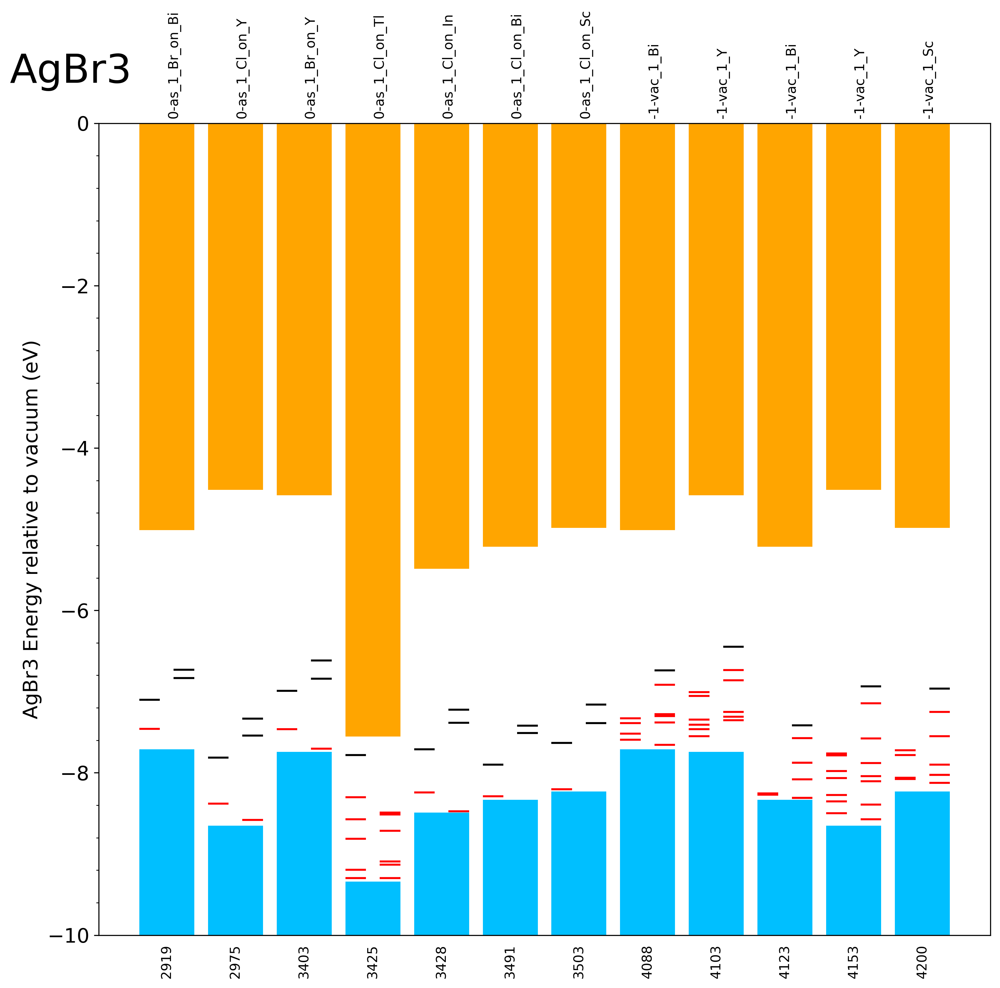

[523, 580, 631, 666, 670, 701, 759]

523 125
---task_id: 523---
total_mag:2.000
cbm:-2.302, vbm:-4.514, efermi:-2.714
{'1': {-3.116: True}, '-1': {}}
                28      48      24      49 spin orbital  adjacent  antisite
band_index                                                                 
220         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
220         0.0715  0.0715  0.0715  0.2318    1      pz    0.2145    0.2318
220         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
220         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
220         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
220         0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000    0.0000
220         0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000    0.0000
220         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
220         0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.0000    0.0000
     energy  occupied  tot_proj  adj_proj  antisite

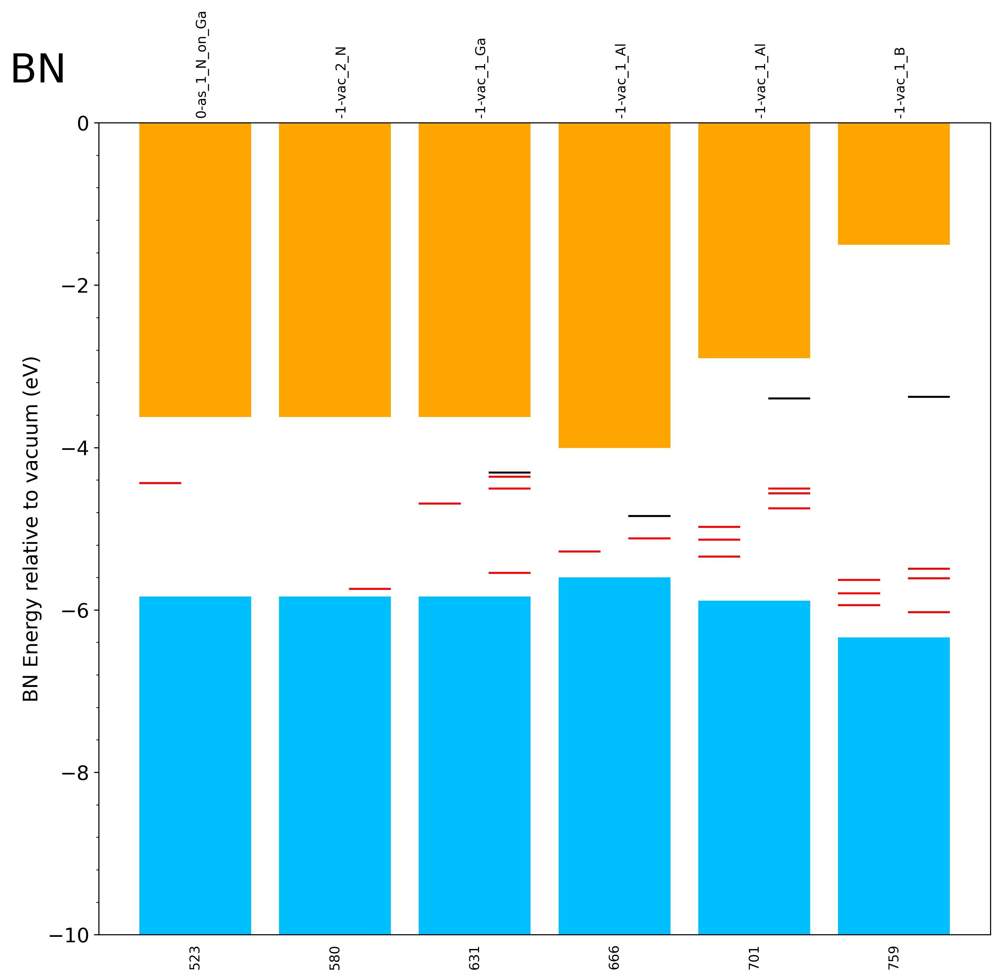

[2930,
 2933,
 2936,
 2949,
 2971,
 3001,
 3295,
 3308,
 3310,
 3314,
 3328,
 3331,
 3350,
 3353,
 3354,
 3359,
 3369,
 3374,
 3385,
 3388,
 3389,
 3407,
 3429,
 3433,
 3446,
 4116,
 4145,
 4151,
 4155,
 4167,
 4168,
 4177,
 4178,
 4186,
 4189,
 4204,
 4205,
 4211,
 4214,
 4218,
 4228,
 4231,
 4240,
 4241,
 4242,
 4244,
 4245,
 4249,
 4268,
 4270,
 4280,
 4289,
 4297,
 4438,
 4498,
 4507,
 4508,
 4532,
 4556,
 4573]

2930 1297
---task_id: 2930---
total_mag:2.000
cbm:-1.132, vbm:-5.437, efermi:-4.550
{'1': {-4.504: False, -4.609: True}, '-1': {-3.978: False, -4.131: False}}
                65      17      38      44      26      53      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0109  0.0109  0.0109  0.0109  0.0109  0.0109  0.2250    1   
219         0.0000  0.0433  0.0380  0.0433  0.0000  0.0380  0.0000    1   
219         0.0541  0.0110  0.0163  0.0110  0.0541  0.0163  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0.00

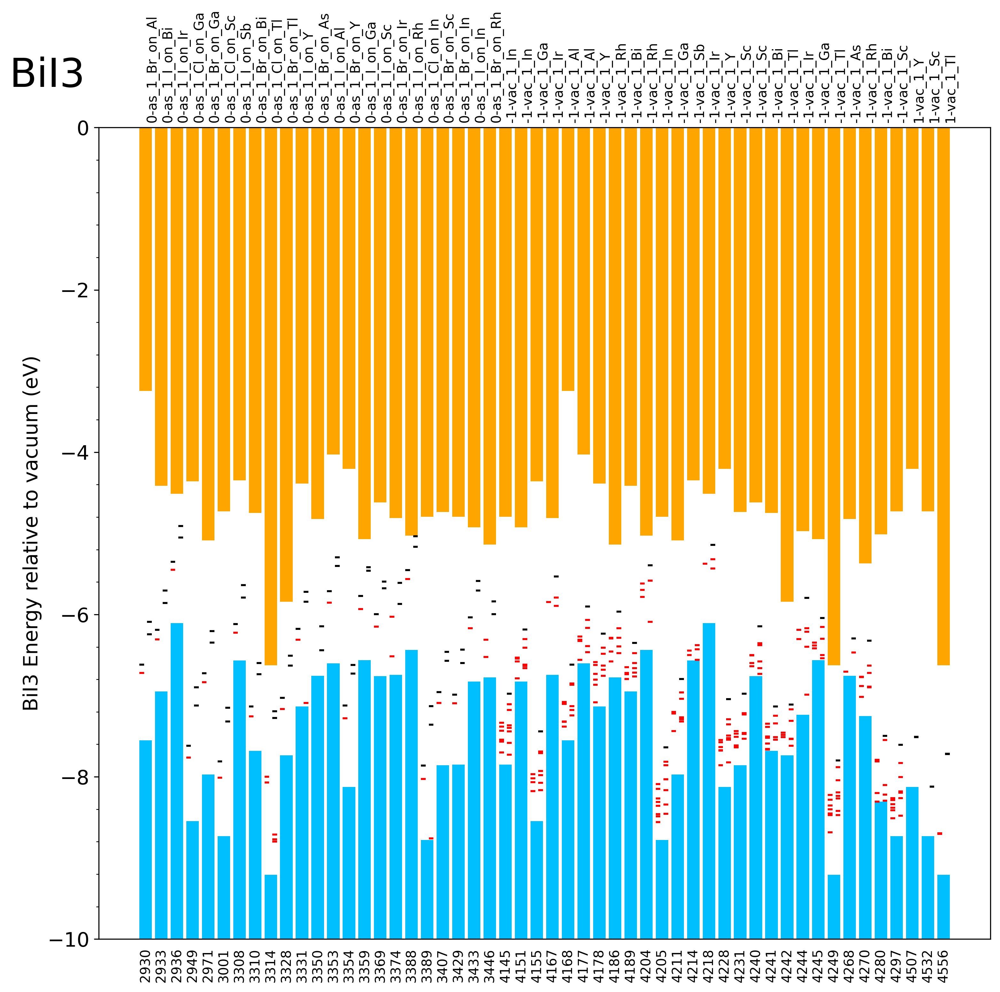

[1280,
 1306,
 1308,
 1320,
 1329,
 1337,
 1347,
 1348,
 1354,
 1366,
 1396,
 1406,
 1507,
 1519,
 1712,
 1763,
 2092,
 2113]

1280 1350
---task_id: 1280---
total_mag:2.000
cbm:-3.084, vbm:-4.407, efermi:-3.342
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
1306 1892
---task_id: 1306---
total_mag:2.000
cbm:-1.959, vbm:-4.159, efermi:-3.182
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
1308 2643
---task_id: 1308---
total_mag:2.000
cbm:-2.298, vbm:-3.849, efermi:-3.494
{'1': {-2.8: False, -3.397: False}, '-1': {-3.253: False}}
                29      27      30 spin orbital  adjacent antisite
band_index                                                        
191         0.0000  0.0000  0.0000    1       s    0.0000        1
191         0.0374  0.1402  0.0327    1      pz    0.2103        1
191         0.0000  0.0000  0.0000    1      py    0.0000        1
191         0.0000  0.0000  0.0000    1      px    0.0000        1
191         0.0000  0.0000  0.0000    1     dz2    0.0000        1
191         0.0000  0.0000  0.0000    1     dyz    0.0000        1
191         0.0000  0.0000 

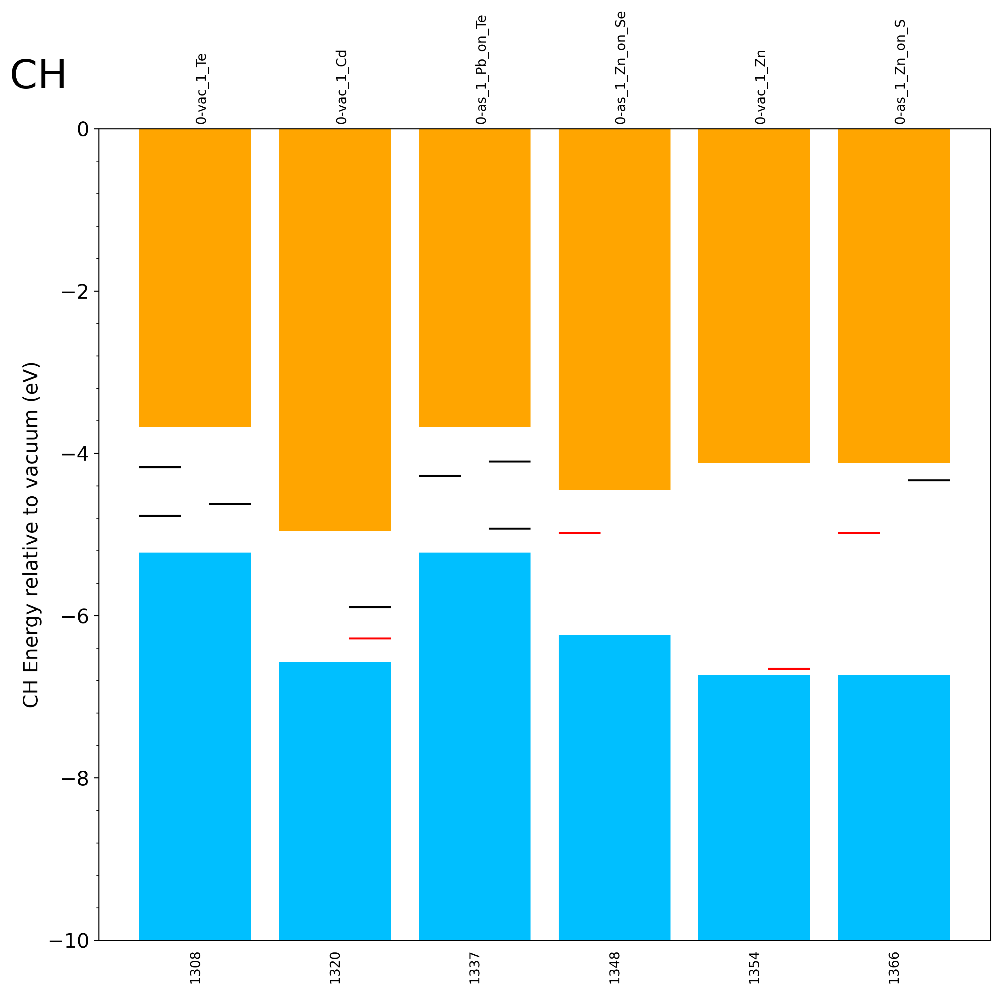

[2961,
 2962,
 3199,
 3532,
 3537,
 3552,
 3560,
 3561,
 3567,
 3569,
 3658,
 3674,
 3677,
 3693,
 3694,
 3700,
 3702,
 3703,
 3709,
 3713,
 3716,
 3722,
 3723,
 3730,
 3738,
 3741,
 3745,
 3749,
 3758,
 3760,
 3768,
 3774,
 3775,
 3781,
 3789,
 3795,
 3799,
 4652,
 4758,
 4783,
 4805,
 4811,
 4812,
 4823,
 4827,
 4837,
 4840,
 4845,
 4851,
 4853,
 4858,
 4861,
 4869,
 4870,
 4879,
 4881,
 4885,
 4887,
 4901,
 4904,
 4912,
 4915,
 4919,
 4923,
 4927,
 4933,
 4938,
 4940,
 4945,
 4951,
 4954,
 4956,
 4966,
 4968,
 4973,
 4977,
 4979,
 4982,
 4986,
 4990,
 4993,
 5000,
 5005,
 5011,
 5023,
 5034,
 5036,
 5037,
 5038,
 5040,
 5042,
 5043,
 5045,
 5046,
 5047,
 5049,
 5053,
 5062,
 5064]

2961 66
---task_id: 2961---
total_mag:2.000
cbm:-3.026, vbm:-4.717, efermi:-3.219
{'1': {-3.4: True, -3.919: True}, '-1': {-3.038: False, -3.668: True}}
                 5       6       0      25 spin orbital  adjacent  antisite
band_index                                                                 
329         0.0031  0.0420  0.0224  0.0000    1       s    0.0675    0.0000
329         0.0000  0.0100  0.0053  0.0000    1      pz    0.0153    0.0000
329         0.0011  0.0149  0.0032  0.1004    1      py    0.0192    0.1004
329         0.0000  0.0000  0.0049  0.0071    1      px    0.0049    0.0071
329         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
329         0.0000  0.0074  0.0000  0.0035    1     dyz    0.0074    0.0035
329         0.0000  0.0000  0.0035  0.0000    1     dxz    0.0035    0.0000
329         0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000    0.0000
329         0.0000  0.0024  0.0000  0.0000    1  dx2-y2    0.0024    0.0000
328        

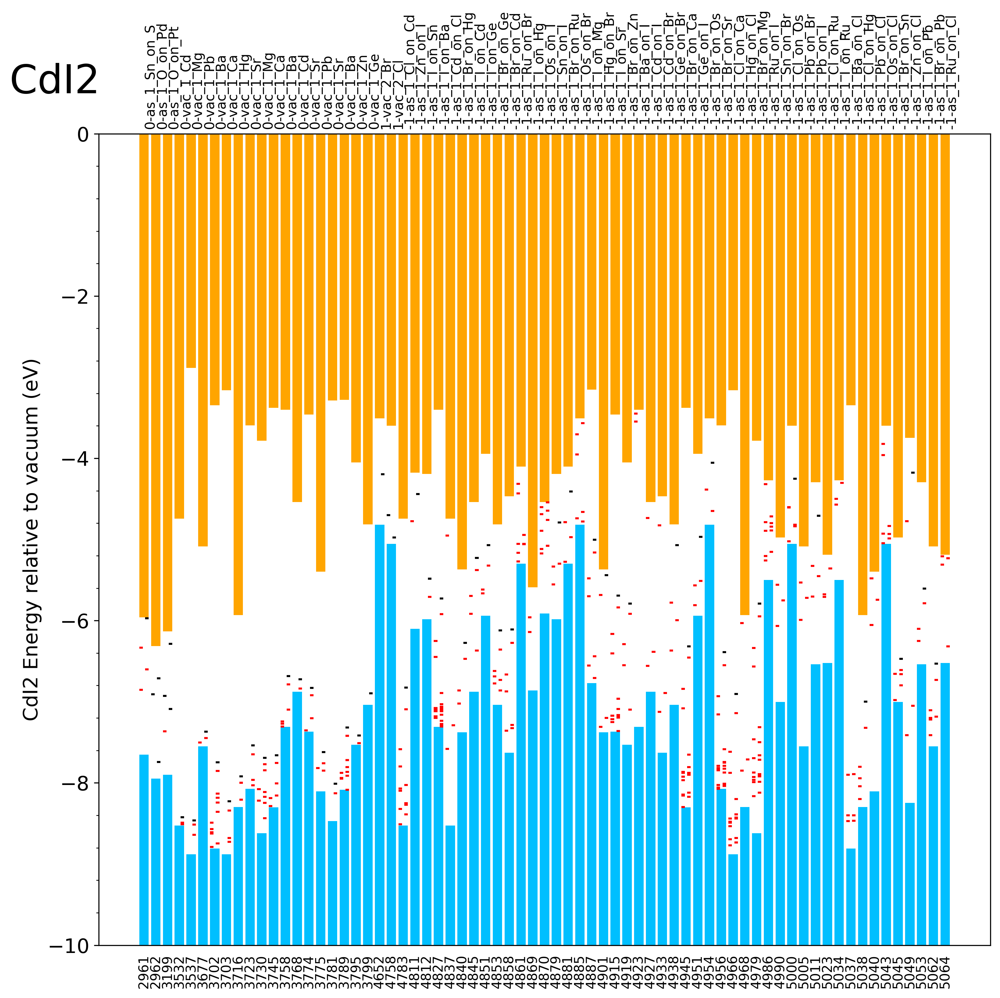

[2967,
 2983,
 2988,
 2989,
 2996,
 3026,
 3031,
 3032,
 3036,
 3091,
 3101,
 3106,
 3107,
 3111,
 3120,
 3121,
 3122,
 3143,
 3153,
 3156,
 3171,
 4332,
 4363,
 4422,
 4485,
 4486,
 4555]

2967 2286
---task_id: 2967---
total_mag:2.000
cbm:-2.074, vbm:-3.737, efermi:-3.107
{'1': {-2.755: False, -3.337: True}, '-1': {-2.583: False, -2.74: False}}
                 0       9      11       6      18 spin orbital  adjacent  \
band_index                                                                  
184         0.0159  0.0159  0.0159  0.0159  0.0000    1       s    0.0477   
184         0.0067  0.0067  0.0067  0.0067  0.1120    1      pz    0.0201   
184         0.0000  0.0139  0.0138  0.0000  0.0000    1      py    0.0277   
184         0.0139  0.0000  0.0000  0.0138  0.0000    1      px    0.0139   
184         0.0000  0.0000  0.0000  0.0000  0.0015    1     dz2    0.0000   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1     dyz    0.0000   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxz    0.0000   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1     dxy    0.0000   
184         0.0000  0.0000  0.0000  0.0000  0.0000    1  dx2-y2    0.000

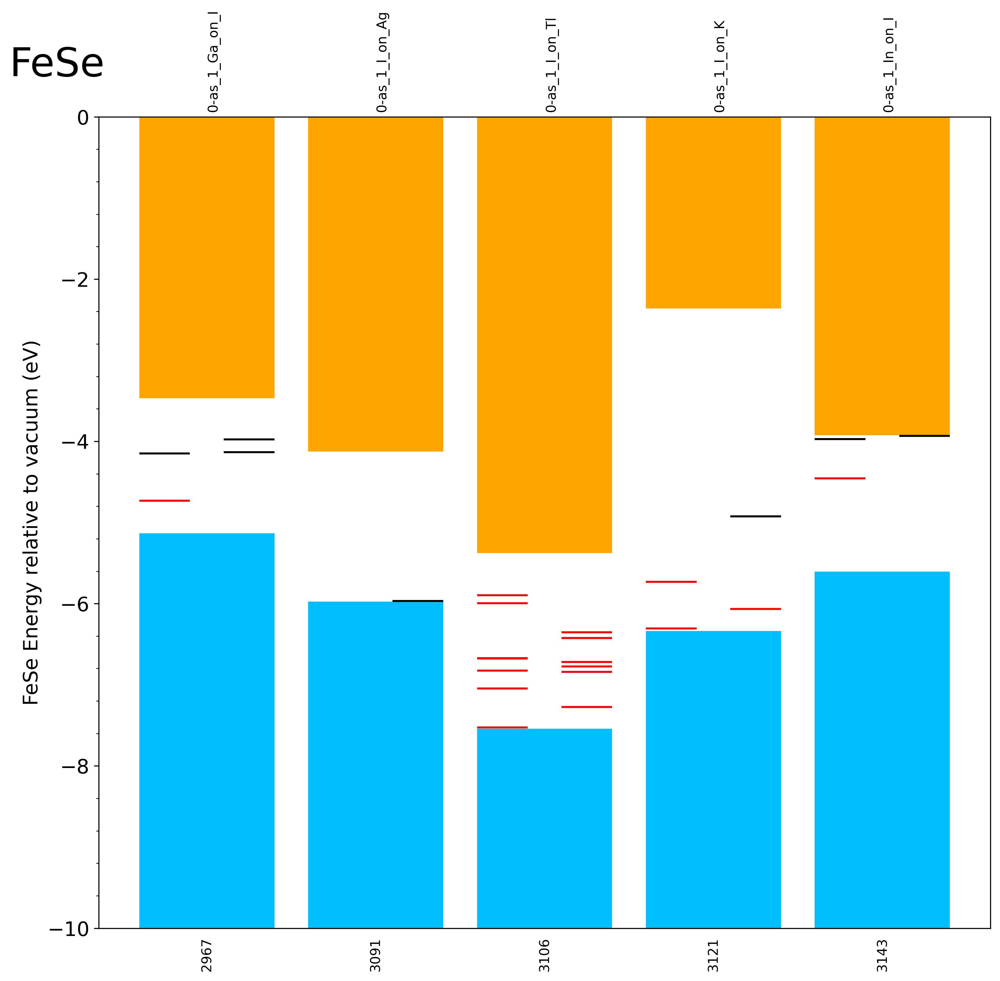

[586,
 591,
 602,
 644,
 654,
 709,
 728,
 741,
 781,
 813,
 852,
 855,
 869,
 881,
 891,
 894,
 902,
 913,
 940,
 955,
 970,
 978,
 1025,
 1029,
 1033,
 1034,
 1037,
 1095,
 2125,
 2130,
 2131,
 2132]

586 2582
---task_id: 586---
total_mag:2.000
cbm:-0.503, vbm:-2.035, efermi:-2.956
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
591 1375
---task_id: 591---
total_mag:2.000
cbm:-0.864, vbm:-2.882, efermi:-4.254
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
602 613
---task_id: 602---
total_mag:2.000
cbm:-0.597, vbm:-2.577, efermi:-3.843
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
644 2618
---task_id: 644---
total_mag:2.000
cbm:-1.099, vbm:-2.905, efermi:-4.036
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
654 2212
---task_id: 654---
total_mag:2.000
cbm:-0.811, vbm:-3.268, efermi:-4.109
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
709 2592
---task_id: 709---
total_mag:2.000
cbm:-1.201, vbm:-2.784, efermi:-3.932
{'1': {}, '-1': {}}
single positional indexer is out-of-bounds
728 1254
---task_id: 728---
total_mag:2.000
cbm:-0.141, vbm:-1.933, efermi:-3.048
{'1': {}, '-1': {}}
single positional indexer is 

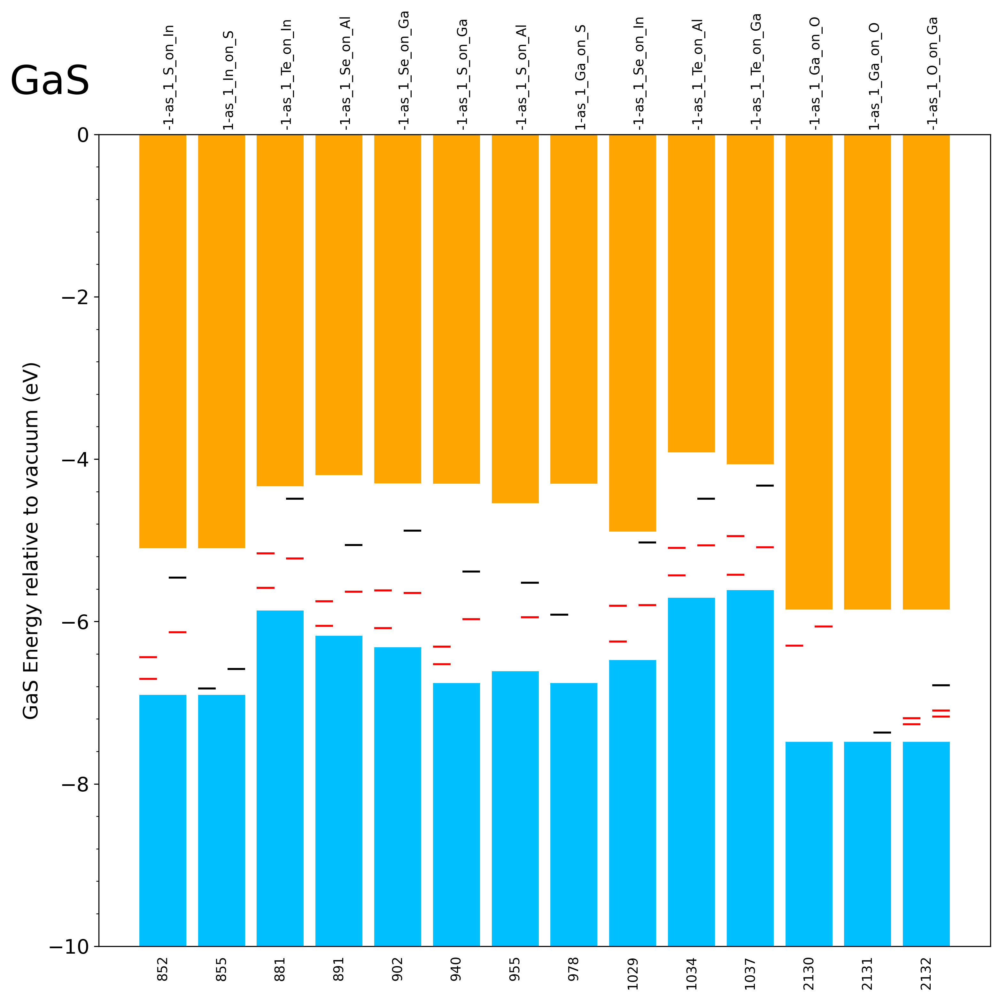

[604,
 607,
 629,
 758,
 784,
 794,
 800,
 951,
 968,
 972,
 973,
 984,
 996,
 999,
 1006,
 1007,
 1059,
 1060,
 1081,
 1083,
 1085,
 1086,
 1089,
 1090,
 1411,
 1416,
 1438,
 1440,
 1452,
 1456,
 1460,
 1472,
 1493,
 1530,
 1533,
 1547,
 1553,
 1576,
 1592,
 1601,
 1609,
 1634,
 1660,
 1663,
 1676,
 1681,
 1692,
 1700,
 1719,
 1781,
 1811,
 1826,
 2151]

604 836
---task_id: 604---
total_mag:2.000
cbm:0.143, vbm:-1.940, efermi:-2.961
{'1': {-1.472: False}, '-1': {-1.436: False}}
                59      62      47      15 spin orbital  adjacent  antisite
band_index                                                                 
143         0.0027  0.0027  0.0027  0.1378    1       s    0.0081    0.1378
143         0.0108  0.0108  0.0108  0.0000    1      pz    0.0324    0.0000
143         0.0016  0.0064  0.0016  0.0000    1      py    0.0096    0.0000
143         0.0048  0.0000  0.0048  0.0000    1      px    0.0096    0.0000
143         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
143         0.0000  0.0021  0.0000  0.0000    1     dyz    0.0021    0.0000
143         0.0016  0.0000  0.0016  0.0000    1     dxz    0.0032    0.0000
143         0.0011  0.0000  0.0011  0.0000    1     dxy    0.0022    0.0000
143         0.0000  0.0014  0.0000  0.0000    1  dx2-y2    0.0014    0.0000
143         0.0028  0.0028  0.0028  0.

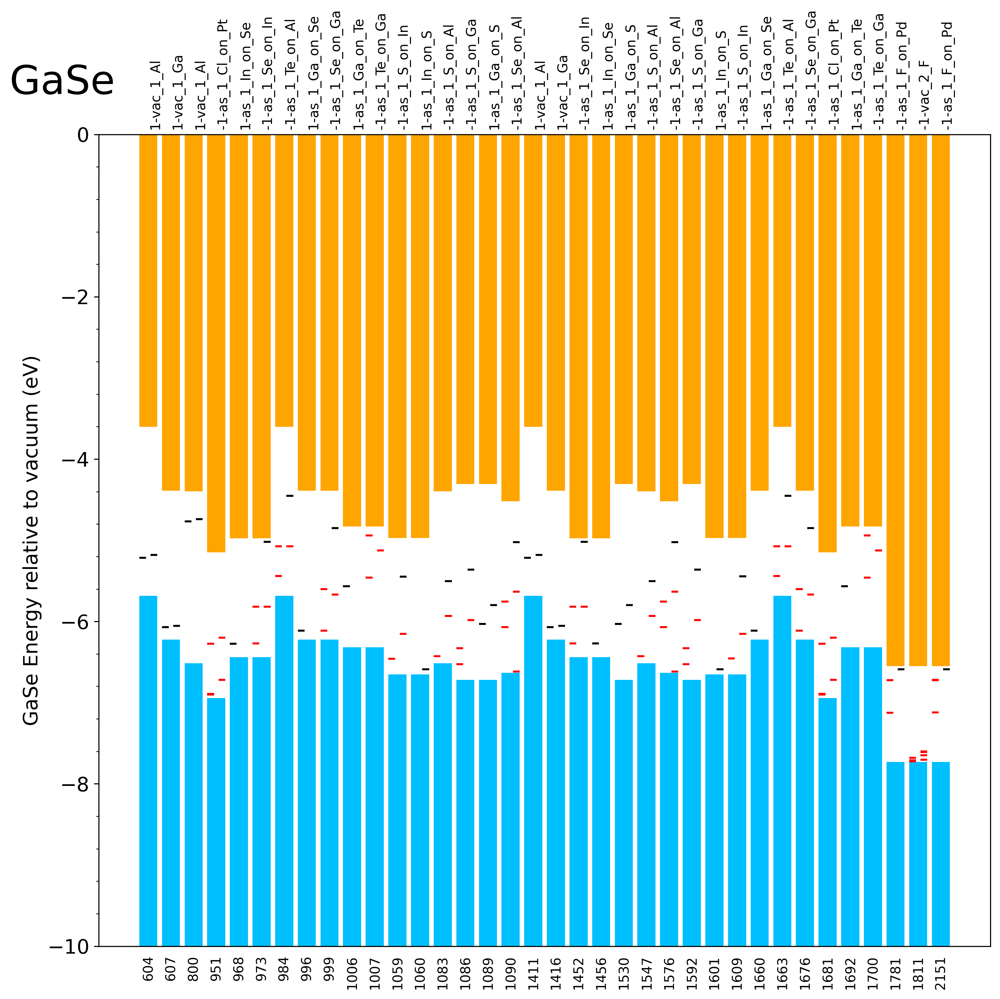

[3062,
 3063,
 3071,
 3074,
 3076,
 3077,
 3078,
 3087,
 3219,
 3223,
 3226,
 3251,
 3265,
 3266,
 4674,
 4680,
 4681,
 4689,
 4699,
 4703,
 4705,
 4706,
 4712,
 4724,
 4726]

3062 2163
---task_id: 3062---
total_mag:2.000
cbm:-2.081, vbm:-6.631, efermi:-5.717
{'1': {-6.106: True, -6.261: True, -6.41: True}, '-1': {-5.64: False, -5.725: True, -5.747: True, -6.376: True, -6.538: True}}
                17      10      23       8 spin orbital  adjacent  antisite
band_index                                                                 
103         0.0000  0.0000  0.0000  0.0000    1       s    0.0000    0.0000
103         0.0000  0.0000  0.0000  0.0000    1      pz    0.0000    0.0000
103         0.1536  0.0000  0.1536  0.0000    1      py    0.3072    0.0000
103         0.0000  0.1536  0.0000  0.1536    1      px    0.1536    0.1536
103         0.0000  0.0000  0.0000  0.0000    1     dz2    0.0000    0.0000
...            ...     ...     ...     ...  ...     ...       ...       ...
94          0.0000  0.0000  0.0000  0.0000   -1     dz2    0.0000    0.0000
94          0.0000  0.0000  0.0000  0.0000   -1     dyz    0.0000    0.0000
94          0.0000  0.0000  0

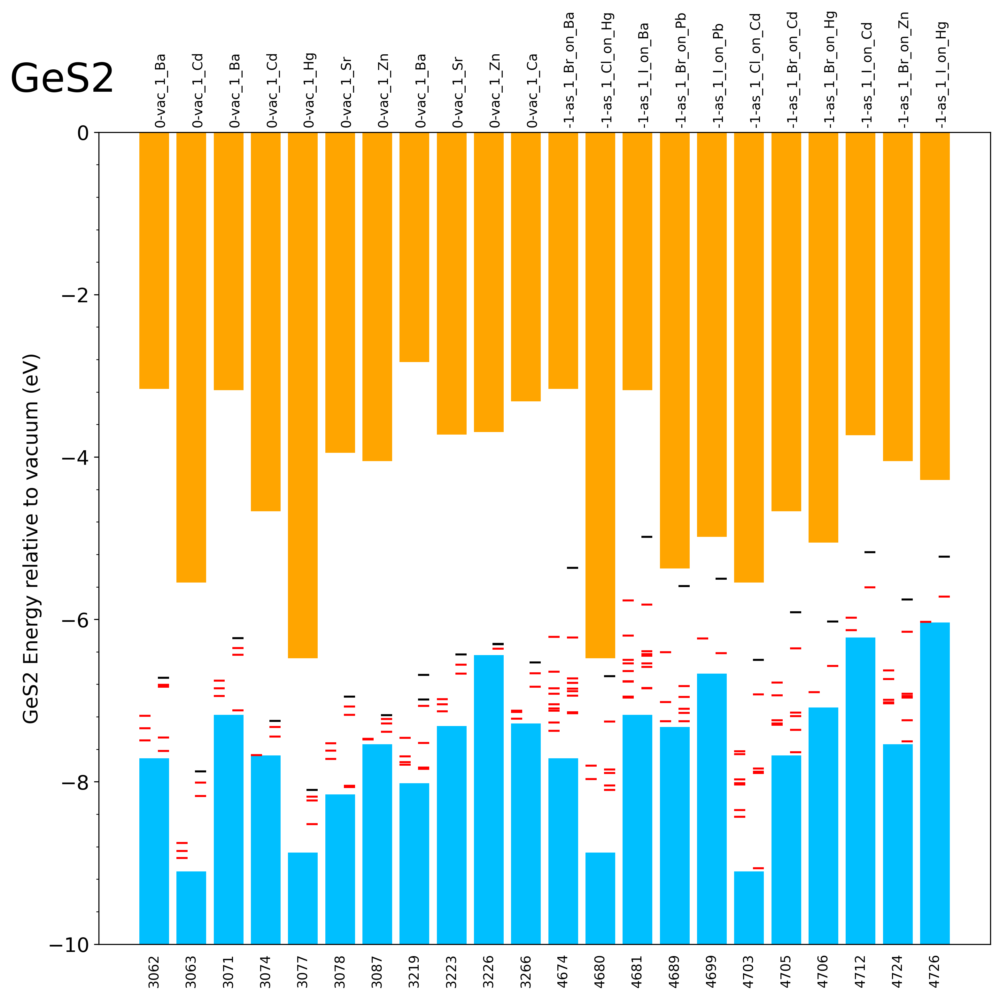

[104,
 127,
 131,
 147,
 246,
 280,
 285,
 325,
 330,
 334,
 338,
 349,
 505,
 512,
 624,
 639,
 693,
 703,
 706,
 710,
 762,
 771,
 2153,
 2159]

104 684
---task_id: 104---
total_mag:2.000
cbm:-1.547, vbm:-3.386, efermi:-3.309
{'1': {}, '-1': {-3.016: False}}
                27      15      30 spin orbital  adjacent antisite
band_index                                                        
153         0.0000  0.0000  0.0000   -1       s    0.0000       -1
153         0.0000  0.0394  0.0299   -1      pz    0.0693       -1
153         0.0034  0.0467  0.1022   -1      py    0.1523       -1
153         0.0079  0.0895  0.0033   -1      px    0.1007       -1
153         0.0000  0.0000  0.0000   -1     dz2    0.0000       -1
153         0.0000  0.0000  0.0000   -1     dyz    0.0000       -1
153         0.0000  0.0000  0.0000   -1     dxz    0.0000       -1
153         0.0000  0.0000  0.0000   -1     dxy    0.0000       -1
153         0.0000  0.0000  0.0000   -1  dx2-y2    0.0000       -1
152         0.0000  0.0000  0.0000   -1       s    0.0000       -1
152         0.0459  0.0072  0.0168   -1      pz    0.0699       -1
152         0.0

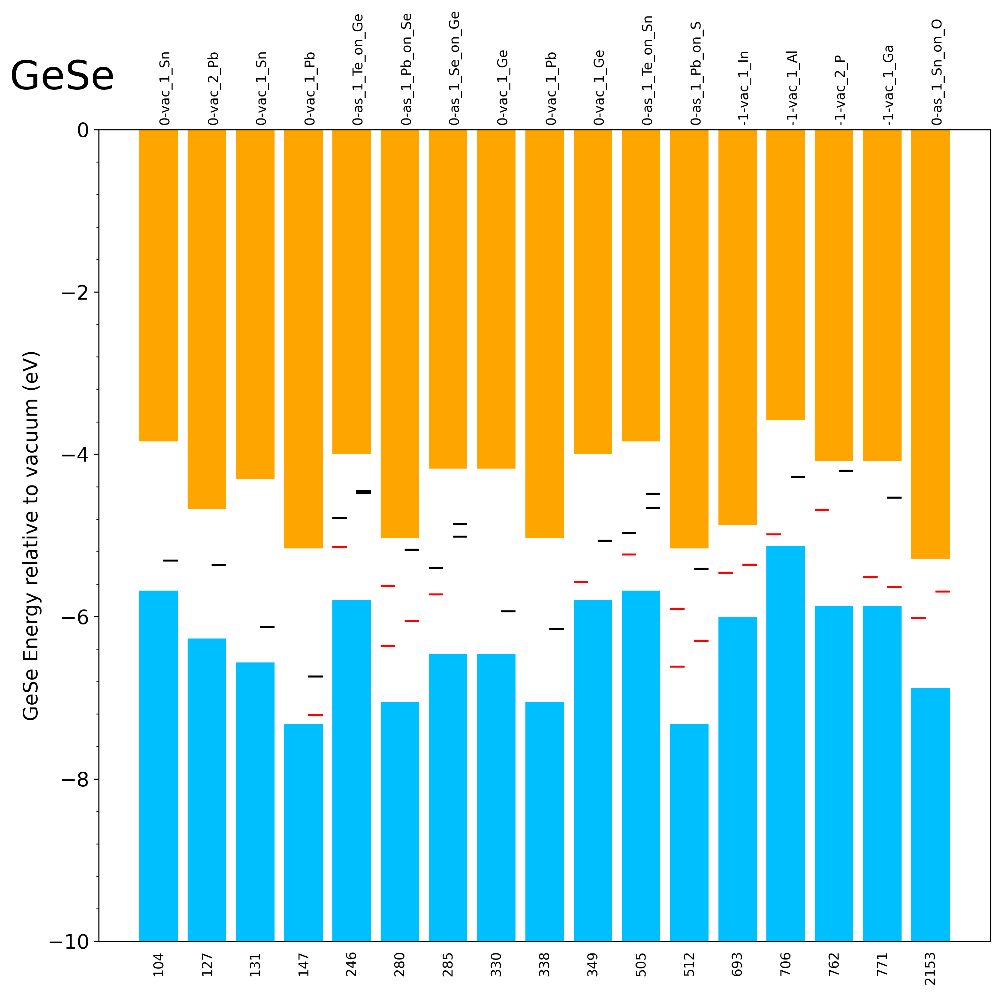

[2974,
 3222,
 3237,
 3239,
 3255,
 3278,
 3280,
 3282,
 3292,
 3298,
 3377,
 3387,
 3449,
 3468,
 3469,
 3470,
 3472,
 3473,
 3478,
 3486,
 3494,
 3527,
 3572,
 3575,
 3590,
 3594,
 3618,
 3619,
 3620,
 3645,
 3646,
 3647,
 3648,
 3651,
 3655,
 3675,
 3691,
 4159,
 4707,
 4716,
 4718,
 4734,
 4735,
 4739,
 4741,
 4763,
 5027,
 5055,
 5060,
 5070,
 5073,
 5080,
 5081,
 5085,
 5087,
 5097,
 5098,
 5099,
 5105,
 5107,
 5111,
 5115,
 5120]

2974 1289
---task_id: 2974---
total_mag:2.000
cbm:-1.614, vbm:-3.343, efermi:-2.354
{'1': {-2.156: False, -2.555: True, -3.229: True}, '-1': {-3.041: True}}
                 5       0       6      25 spin orbital  adjacent  antisite
band_index                                                                 
330         0.0000  0.0000  0.0000  0.0192    1       s    0.0000    0.0192
330         0.0000  0.0000  0.0000  0.0046    1      pz    0.0000    0.0046
330         0.0000  0.0000  0.0000  0.0000    1      py    0.0000    0.0000
330         0.0000  0.0000  0.0000  0.0000    1      px    0.0000    0.0000
330         0.0255  0.0255  0.0255  0.4629    1     dz2    0.0765    0.4629
...            ...     ...     ...     ...  ...     ...       ...       ...
326         0.0188  0.0047  0.0047  0.0000   -1     dz2    0.0282    0.0000
326         0.0070  0.0021  0.0070  0.0469   -1     dyz    0.0161    0.0469
326         0.0209  0.0049  0.0000  0.1406   -1     dxz    0.0258    0.1406
326    

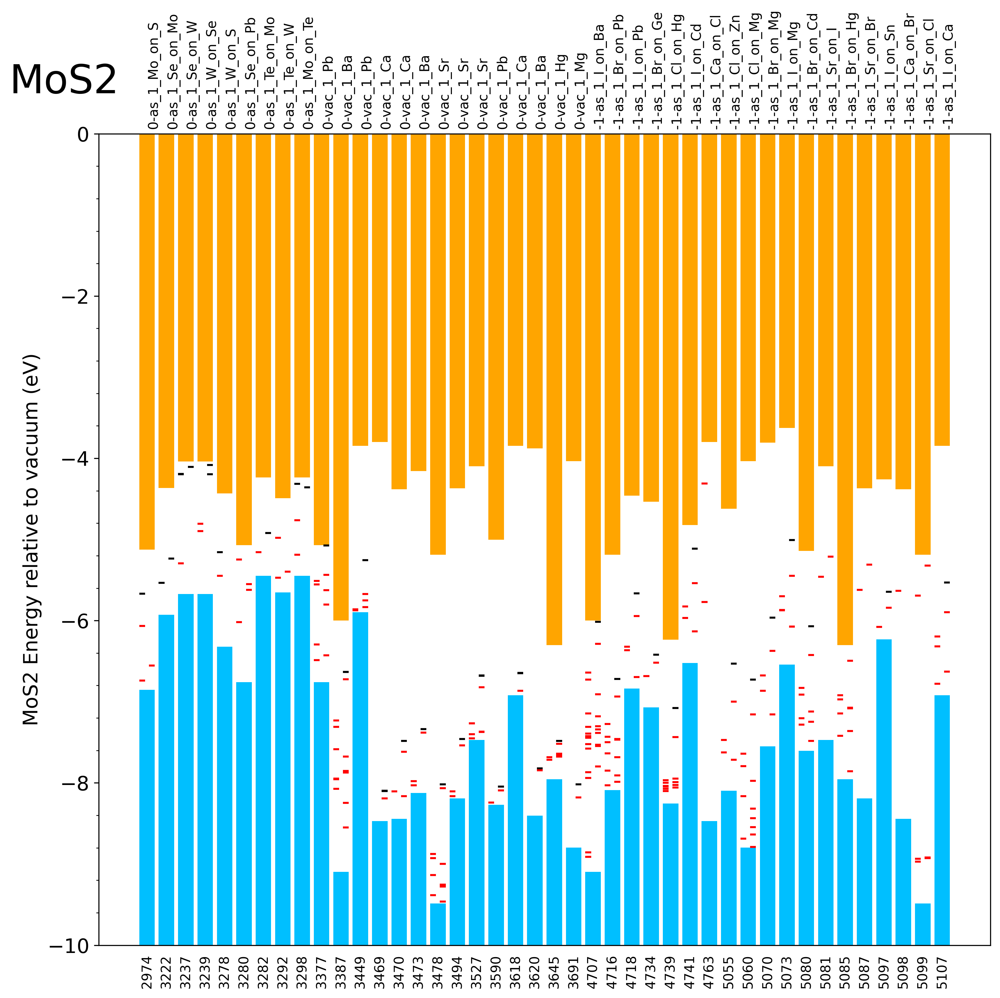

[2934,
 3386,
 3392,
 3415,
 3418,
 3420,
 3423,
 3426,
 3431,
 4069,
 4072,
 4076,
 4090,
 4092,
 4100,
 4109,
 4128,
 4139,
 4304,
 4317,
 4326,
 4380,
 4384]

2934 2032
---task_id: 2934---
total_mag:2.000
cbm:-2.184, vbm:-5.097, efermi:-4.863
{'1': {-4.602: False, -5.093: True}, '-1': {-4.244: False, -4.485: False}}
                65      38      17      44      26      53      71 spin  \
band_index                                                                
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0183  0.0183  0.0183  0.0183  0.0183  0.0183  0.2123    1   
219         0.0014  0.0014  0.0420  0.0420  0.0278  0.0278  0.0000    1   
219         0.0461  0.0461  0.0055  0.0055  0.0197  0.0197  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
219         0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000    1   
218         0.00

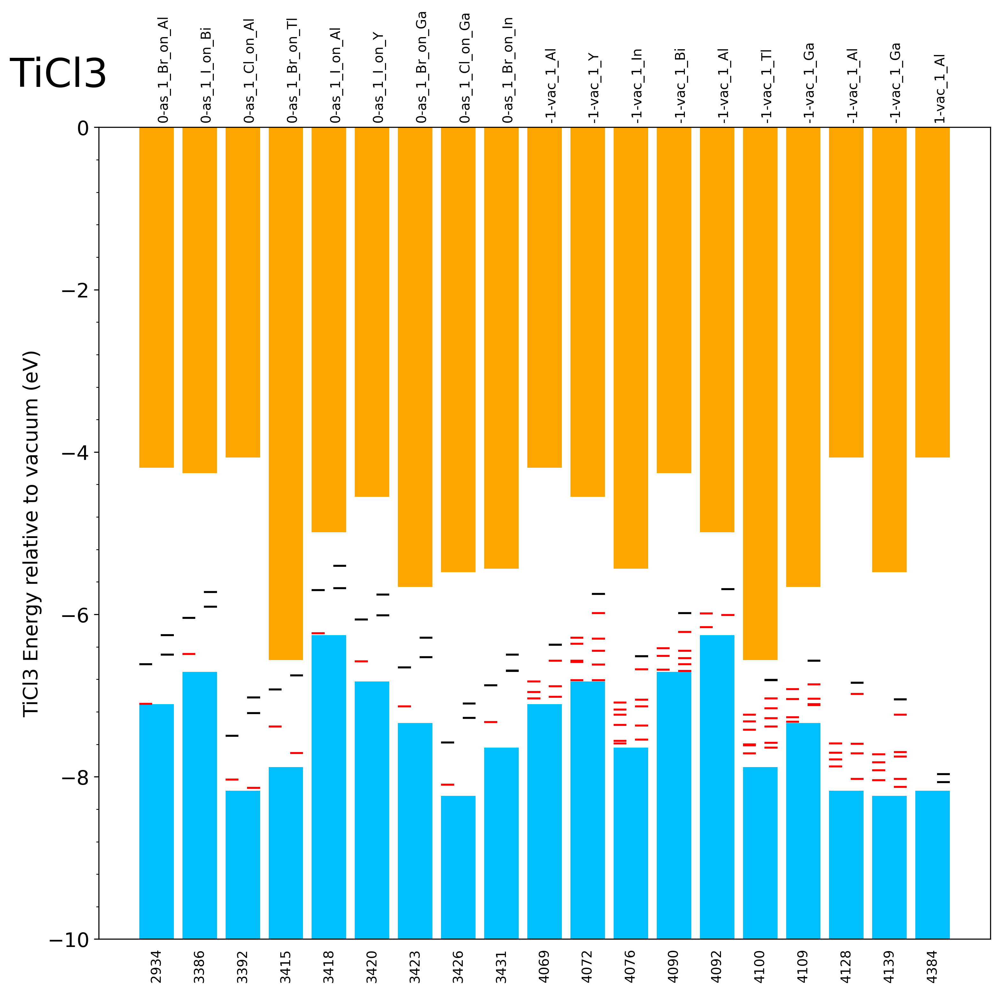

In [110]:
all_protos = ["AgBr3", "BN", "BiI3", "CH", "CdI2", "FeSe", "GaS", "GaSe", "GeS2", "GeSe", "MoS2", "TiCl3"]
for set_prototype in all_protos:
    plot_df = defect_df.loc[(defect_df["mag"].round(0) == 2) & (defect_df["prototype"] == set_prototype), :]
    display(plot_df["task_id"].tolist())
    input_data = []
    for taskid in plot_df["task_id"].tolist():
        e = SCAN2dDefect.collection.find_one({"task_id": taskid})
        host_taskid = e["pc_from_id"]
        info = {
            "d_taskid": taskid,
            "host_taskid": host_taskid,
            "d_name": e["defect_name"],
            "charge": e["charge_state"]
        }
        input_data.append(info)



    defect_levels = []
    taskid_labels = []
    defect_name_labels = []
    charge_labels = []
    for defect in input_data:
        print(defect["d_taskid"], defect["host_taskid"])
        try:
            levels = extract_defect_levels(defect["d_taskid"], defect["host_taskid"])
            defect_levels.append({"cbm": levels["cbm"], "vbm": levels["vbm"], "up": levels["1"], "dn": levels["-1"]})
            taskid_labels.append(defect["d_taskid"])
            defect_name_labels.append(defect["d_name"])
            charge_labels.append(defect["charge"])
        except Exception as er:
            print(er)
            continue



    fig, ax = plt.subplots(figsize=(12,11), dpi=300)
    print(np.arange(0, len(defect_levels)*2, 2))
    for defect, x in zip(defect_levels, np.arange(0, len(defect_levels)*5, 5)):
        cbm, vbm = defect["cbm"], defect["vbm"]
        for edge in [cbm, vbm]:
            ax.bar(x, vbm--10, 4, -10, color="deepskyblue")
            ax.bar(x, 0-cbm, 4, cbm, color="orange")

        dx = 0.35
        for level, occupied in defect["up"].items():
            # dx += 0.2
            if occupied:
                ax.hlines(level, x-2, x-0.5, colors="red")
            else:
                ax.hlines(level, x-2, x-0.5, colors="black")
            # if occupied:
            #     ax.arrow((2*x-2.5)/2, level-0.1, dx=0, dy=0.15,
            #              head_length=0.1, width=0.01, head_width=0.35, shape="full", color="black")
        dx = 1
        for level, occupied in defect["dn"].items():
            # dx += 0.2
            if occupied:
                ax.hlines(level, x+0.5, x+2, colors="red")
            else:
                ax.hlines(level, x+0.5, x+2, colors="black")
            # if occupied:
            #     ax.arrow((2*x+2.5)/2, level+0.1, dx=0, dy=-0.15,
            #              head_length=0.1, width=0.01, head_width=0.35, shape="full", color="black")

    ax.set_ylim(-10, 0)
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    for tick in ax.get_yticklabels():
        tick.set_fontsize(15)


    ax.tick_params(axis="x", bottom=False, labelbottom=True)
    ax.set_xticks(np.arange(0, len(defect_levels)*5, 5))
    ax.set_xticklabels(taskid_labels, fontdict={"fontsize": 10}, rotation=90)

    for x, name, q in zip(np.arange(0, len(defect_levels)*5, 5), defect_name_labels, charge_labels):
        ax.text(x, 0.1, "{}-{}".format(q, name), rotation=90, size=10)

    ax.set_ylabel("{} Energy relative to vacuum (eV)".format(set_prototype), fontsize=15)
    ax.text(-0.1, 1.05, set_prototype, size=30, transform=ax.transAxes)
    display(fig)

    fig.savefig(os.path.join(save_plt_path, "triplets_levels(incorrected)", "localize-0_2", "proto_{}_triplets.png"
                             .format(set_prototype)))